<a href="https://colab.research.google.com/github/KAVYANSHTYAGI/Food-Image-Classifier/blob/main/label_generator.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
pip install torch torchvision numpy opencv-python tqdm


In [ ]:
pip install ultralytics opencv-python matplotlib


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 922.2/922.2 kB 15.7 MB/s eta 0:00:00



0: 448x640 1 pizza, 35.3ms
Speed: 2.0ms preprocess, 35.3ms inference, 2.1ms postprocess per image at shape (1, 3, 448, 640)


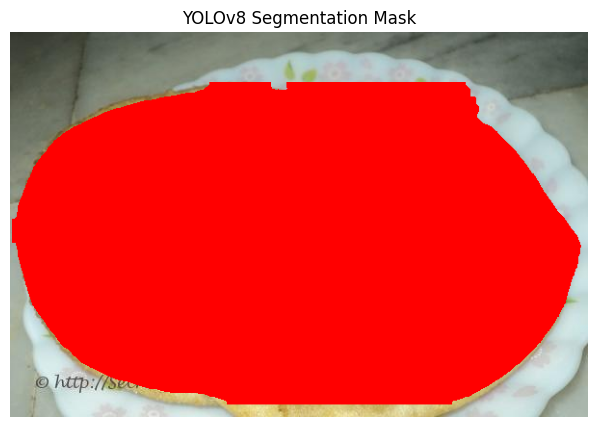

In [ ]:
from ultralytics import YOLO
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load YOLOv8-Segmentation Model (Pretrained)
model = YOLO("yolov8m-seg.pt")  # 'm' for medium, you can use 's' for small

def generate_yolo_mask(image_path):
    """
    Runs YOLOv8-Seg on an image and displays the detected object masks.
    """
    # Load Image
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Run YOLO-Segmentation
    results = model(image)

    # Get Image Shape
    img_h, img_w, _ = image.shape

    # Process Each Detected Object
    for result in results:
        masks = result.masks.data.cpu().numpy()  # Get mask data
        for mask in masks:
            mask = cv2.resize(mask, (img_w, img_h))  # Resize mask to match original image size
            mask = (mask > 0.5).astype(np.uint8) * 255  # Convert to binary mask

            # Apply mask overlay in red
            image_rgb[mask > 0] = [255, 0, 0]

    # Show Results
    plt.figure(figsize=(10, 5))
    plt.imshow(image_rgb)
    plt.title("YOLOv8 Segmentation Mask")
    plt.axis("off")
    plt.show()

# Process the uploaded image
generate_yolo_mask(uploaded_image_path)


In [ ]:
from ultralytics import YOLO
import cv2
import numpy as np
import os
from multiprocessing import Pool, cpu_count
from tqdm import tqdm

# Load YOLOv8-Segmentation Model (Pretrained)
model = YOLO("yolov8m-seg.pt")  # 'm' for medium, you can use 's' for small

# Define Directories
MAIN_FOLDER = "/content/drive/MyDrive/Food Image Datasets/North Indian/main_final"  # Replace with your dataset directory
OUTPUT_FOLDER = "/content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main2"  # Masks will be saved here

def process_image(image_path):
    """
    Process a single image, generate a YOLO segmentation mask, and save it in the corresponding folder.
    """
    try:
        # Compute relative path to maintain folder structure
        relative_path = os.path.relpath(image_path, MAIN_FOLDER)
        mask_relative_path = os.path.join(OUTPUT_FOLDER, relative_path)

        # Create corresponding mask folder in pseudo_masks/
        mask_dir = os.path.dirname(mask_relative_path)
        os.makedirs(mask_dir, exist_ok=True)

        # Load Image
        image = cv2.imread(image_path)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Run YOLO-Segmentation
        results = model(image)

        # Get Image Shape
        img_h, img_w, _ = image.shape

        # Create an empty mask
        final_mask = np.zeros((img_h, img_w), dtype=np.uint8)

        # Process Each Detected Object
        for result in results:
            if result.masks is not None:
                masks = result.masks.data.cpu().numpy()
                for mask in masks:
                    mask = cv2.resize(mask, (img_w, img_h))  # Resize to match original image size
                    mask = (mask > 0.5).astype(np.uint8) * 255  # Convert to binary mask
                    final_mask = np.maximum(final_mask, mask)  # Combine all object masks

        # Save the final mask
        mask_filename = os.path.basename(image_path).split('.')[0] + "_mask.png"
        mask_path = os.path.join(mask_dir, mask_filename)
        cv2.imwrite(mask_path, final_mask)

        return f"Saved mask: {mask_path}"

    except Exception as e:
        return f"Error processing {image_path}: {str(e)}"

def get_all_image_paths(root_dir):
    """
    Recursively collect all image paths from the given directory.
    """
    image_extensions = {".jpg", ".jpeg", ".png"}
    image_paths = []

    for subdir, _, files in os.walk(root_dir):
        for file in files:
            if any(file.lower().endswith(ext) for ext in image_extensions):
                image_paths.append(os.path.join(subdir, file))

    return image_paths

def process_images_multiprocessing(image_paths):
    """
    Use multiprocessing to process images in parallel.
    """
    num_workers = min(cpu_count(), len(image_paths))  # Use all available CPU cores
    with Pool(processes=num_workers) as pool:
        results = list(tqdm(pool.imap(process_image, image_paths), total=len(image_paths), desc="Generating YOLO Masks"))

    # Print results (optional)
    for res in results:
        print(res)

if __name__ == "__main__":
    print(f"Scanning images in {MAIN_FOLDER}...")
    image_paths = get_all_image_paths(MAIN_FOLDER)

    if not image_paths:
        print("No images found! Please check the dataset directory.")
    else:
        print(f"Found {len(image_paths)} images. Generating masks using {cpu_count()} cores...\n")
        process_images_multiprocessing(image_paths)

    print("\n✅ All YOLO segmentation masks have been generated and saved in pseudo_masks/")


Scanning images in /content/drive/MyDrive/Food Image Datasets/North Indian/main_final...
Found 10066 images. Generating masks using 8 cores...



Generating YOLO Masks:   0%|          | 0/10066 [00:00<?, ?it/s]

Generating YOLO Masks:   0%|          | 28/10066 [00:00<00:36, 273.14it/s]

Generating YOLO Masks:   1%|          | 56/10066 [00:00<02:00, 83.31it/s] 

Generating YOLO Masks:   1%|          | 71/10066 [00:00<01:51, 89.92it/s]

Generating YOLO Masks:   1%|          | 110/10066 [00:00<01:06, 150.39it/s]

Generating YOLO Masks:   1%|▏         | 133/10066 [00:01<01:08, 144.93it/s]

Generating YOLO Masks:   2%|▏         | 152/10066 [00:01<01:04, 154.49it/s]

Generating YOLO Masks:   2%|▏         | 171/10066 [00:01<02:50, 58.13it/s] 

Generating YOLO Masks:   2%|▏         | 185/10066 [00:02<03:46, 43.58it/s]

Generating YOLO Masks:   2%|▏         | 195/10066 [00:03<05:06, 32.25it/s]

Generating YOLO Masks:   2%|▏         | 203/10066 [00:03<05:51, 28.04it/s]

Generating YOLO Masks:   2%|▏         | 209/10066 [00:03<05:41, 28.90it/s]

Generating YOLO Masks:   2%|▏         | 214/10066 [00:04<06:49, 24.09it/s]

Generating YOLO Masks:   2%|▏         | 218/10066 [00:04<07:20, 22.34it/s]

Generating YOLO Masks:   2%|▏         | 222/10066 [00:04<07:11, 22.83it/s]

Generating YOLO Masks:   2%|▏         | 225/10066 [00:04<07:14, 22.65it/s]

Generating YOLO Masks:   2%|▏         | 228/10066 [00:05<08:21, 19.61it/s]

Generating YOLO Masks:   2%|▏         | 232/10066 [00:05<08:39, 18.94it/s]

Generating YOLO Masks:   2%|▏         | 236/10066 [00:05<07:43, 21.19it/s]

Generating YOLO Masks:   2%|▏         | 239/10066 [00:05<07:45, 21.10it/s]

Generating YOLO Masks:   2%|▏         | 242/10066 [00:05<07:52, 20.81it/s]

Generating YOLO Masks:   2%|▏         | 245/10066 [00:05<07:31, 21.77it/s]

Generating YOLO Masks:   2%|▏         | 248/10066 [00:06<08:08, 20.12it/s]

Generating YOLO Masks:   2%|▏         | 251/10066 [00:06<08:19, 19.64it/s]

Generating YOLO Masks:   3%|▎         | 254/10066 [00:06<08:16, 19.78it/s]

Generating YOLO Masks:   3%|▎         | 257/10066 [00:06<08:47, 18.60it/s]

Generating YOLO Masks:   3%|▎         | 260/10066 [00:06<08:23, 19.47it/s]

Generating YOLO Masks:   3%|▎         | 264/10066 [00:06<07:35, 21.51it/s]

Generating YOLO Masks:   3%|▎         | 267/10066 [00:07<08:55, 18.29it/s]

Generating YOLO Masks:   3%|▎         | 269/10066 [00:07<08:46, 18.59it/s]

Generating YOLO Masks:   3%|▎         | 274/10066 [00:07<07:48, 20.88it/s]

Generating YOLO Masks:   3%|▎         | 277/10066 [00:07<10:09, 16.06it/s]

Generating YOLO Masks:   3%|▎         | 282/10066 [00:07<08:18, 19.63it/s]

Generating YOLO Masks:   3%|▎         | 285/10066 [00:07<08:16, 19.69it/s]

Generating YOLO Masks:   3%|▎         | 288/10066 [00:08<08:04, 20.17it/s]

Generating YOLO Masks:   3%|▎         | 291/10066 [00:08<07:57, 20.48it/s]

Generating YOLO Masks:   3%|▎         | 294/10066 [00:08<08:55, 18.24it/s]

Generating YOLO Masks:   3%|▎         | 296/10066 [00:08<09:54, 16.43it/s]

Generating YOLO Masks:   3%|▎         | 301/10066 [00:08<08:09, 19.93it/s]

Generating YOLO Masks:   3%|▎         | 304/10066 [00:09<11:24, 14.25it/s]

Generating YOLO Masks:   3%|▎         | 310/10066 [00:09<08:12, 19.82it/s]

Generating YOLO Masks:   3%|▎         | 313/10066 [00:09<07:52, 20.64it/s]

Generating YOLO Masks:   3%|▎         | 316/10066 [00:09<07:34, 21.43it/s]

Generating YOLO Masks:   3%|▎         | 319/10066 [00:09<11:20, 14.33it/s]

Generating YOLO Masks:   3%|▎         | 326/10066 [00:10<07:19, 22.17it/s]

Generating YOLO Masks:   3%|▎         | 330/10066 [00:10<11:01, 14.71it/s]

Generating YOLO Masks:   3%|▎         | 337/10066 [00:10<07:36, 21.30it/s]

Generating YOLO Masks:   3%|▎         | 341/10066 [00:10<07:23, 21.94it/s]

Generating YOLO Masks:   3%|▎         | 345/10066 [00:11<07:38, 21.21it/s]

Generating YOLO Masks:   3%|▎         | 348/10066 [00:11<08:11, 19.77it/s]

Generating YOLO Masks:   3%|▎         | 352/10066 [00:11<09:17, 17.42it/s]

Generating YOLO Masks:   4%|▎         | 355/10066 [00:11<08:25, 19.22it/s]

Generating YOLO Masks:   4%|▎         | 360/10066 [00:11<06:44, 24.02it/s]

Generating YOLO Masks:   4%|▎         | 363/10066 [00:12<08:56, 18.08it/s]

Generating YOLO Masks:   4%|▎         | 366/10066 [00:12<09:55, 16.29it/s]

Generating YOLO Masks:   4%|▎         | 371/10066 [00:12<07:59, 20.23it/s]

Generating YOLO Masks:   4%|▎         | 374/10066 [00:12<07:31, 21.49it/s]

Generating YOLO Masks:   4%|▎         | 377/10066 [00:12<07:54, 20.41it/s]

Generating YOLO Masks:   4%|▍         | 380/10066 [00:12<07:45, 20.83it/s]

Generating YOLO Masks:   4%|▍         | 384/10066 [00:12<06:48, 23.67it/s]

Generating YOLO Masks:   4%|▍         | 387/10066 [00:13<07:28, 21.57it/s]

Generating YOLO Masks:   4%|▍         | 391/10066 [00:13<07:45, 20.78it/s]

Generating YOLO Masks:   4%|▍         | 394/10066 [00:13<14:32, 11.09it/s]

Generating YOLO Masks:   4%|▍         | 403/10066 [00:14<09:43, 16.56it/s]

Generating YOLO Masks:   4%|▍         | 406/10066 [00:14<12:17, 13.10it/s]

Generating YOLO Masks:   4%|▍         | 414/10066 [00:14<08:08, 19.77it/s]

Generating YOLO Masks:   4%|▍         | 418/10066 [00:15<09:11, 17.49it/s]

Generating YOLO Masks:   4%|▍         | 425/10066 [00:15<07:02, 22.80it/s]

Generating YOLO Masks:   4%|▍         | 429/10066 [00:15<08:11, 19.62it/s]

Generating YOLO Masks:   4%|▍         | 432/10066 [00:15<09:20, 17.17it/s]

Generating YOLO Masks:   4%|▍         | 438/10066 [00:16<07:20, 21.84it/s]

Generating YOLO Masks:   4%|▍         | 442/10066 [00:16<07:09, 22.41it/s]

Generating YOLO Masks:   4%|▍         | 445/10066 [00:16<06:58, 22.97it/s]

Generating YOLO Masks:   4%|▍         | 448/10066 [00:16<07:31, 21.30it/s]

Generating YOLO Masks:   4%|▍         | 451/10066 [00:16<07:53, 20.31it/s]

Generating YOLO Masks:   5%|▍         | 454/10066 [00:16<07:55, 20.22it/s]

Generating YOLO Masks:   5%|▍         | 457/10066 [00:17<09:55, 16.14it/s]

Generating YOLO Masks:   5%|▍         | 459/10066 [00:17<10:22, 15.43it/s]

Generating YOLO Masks:   5%|▍         | 461/10066 [00:17<10:04, 15.90it/s]

Generating YOLO Masks:   5%|▍         | 465/10066 [00:17<08:05, 19.76it/s]

Generating YOLO Masks:   5%|▍         | 472/10066 [00:17<06:05, 26.28it/s]

Generating YOLO Masks:   5%|▍         | 475/10066 [00:17<06:07, 26.07it/s]

Generating YOLO Masks:   5%|▍         | 478/10066 [00:17<07:36, 21.01it/s]

Generating YOLO Masks:   5%|▍         | 481/10066 [00:18<09:36, 16.62it/s]

Generating YOLO Masks:   5%|▍         | 485/10066 [00:18<08:08, 19.61it/s]

Generating YOLO Masks:   5%|▍         | 491/10066 [00:18<07:48, 20.43it/s]

Generating YOLO Masks:   5%|▍         | 494/10066 [00:18<09:00, 17.70it/s]

Generating YOLO Masks:   5%|▍         | 496/10066 [00:19<10:35, 15.06it/s]

Generating YOLO Masks:   5%|▍         | 501/10066 [00:19<08:31, 18.68it/s]

Generating YOLO Masks:   5%|▌         | 507/10066 [00:19<06:28, 24.61it/s]

Generating YOLO Masks:   5%|▌         | 510/10066 [00:19<06:38, 23.97it/s]

Generating YOLO Masks:   5%|▌         | 513/10066 [00:19<06:42, 23.73it/s]

Generating YOLO Masks:   5%|▌         | 516/10066 [00:19<07:52, 20.23it/s]

Generating YOLO Masks:   5%|▌         | 519/10066 [00:20<07:12, 22.07it/s]

Generating YOLO Masks:   5%|▌         | 522/10066 [00:20<09:14, 17.21it/s]

Generating YOLO Masks:   5%|▌         | 525/10066 [00:20<10:25, 15.25it/s]

Generating YOLO Masks:   5%|▌         | 527/10066 [00:20<11:24, 13.94it/s]

Generating YOLO Masks:   5%|▌         | 534/10066 [00:20<06:43, 23.61it/s]

Generating YOLO Masks:   5%|▌         | 538/10066 [00:21<07:01, 22.61it/s]

Generating YOLO Masks:   5%|▌         | 541/10066 [00:21<10:20, 15.35it/s]

Generating YOLO Masks:   5%|▌         | 551/10066 [00:21<06:40, 23.75it/s]

Generating YOLO Masks:   6%|▌         | 554/10066 [00:21<07:21, 21.53it/s]

Generating YOLO Masks:   6%|▌         | 557/10066 [00:21<07:20, 21.58it/s]

Generating YOLO Masks:   6%|▌         | 561/10066 [00:22<06:53, 22.99it/s]

Generating YOLO Masks:   6%|▌         | 564/10066 [00:22<07:16, 21.79it/s]

Generating YOLO Masks:   6%|▌         | 568/10066 [00:22<07:03, 22.41it/s]

Generating YOLO Masks:   6%|▌         | 571/10066 [00:22<07:05, 22.31it/s]

Generating YOLO Masks:   6%|▌         | 574/10066 [00:22<08:13, 19.25it/s]

Generating YOLO Masks:   6%|▌         | 577/10066 [00:22<07:57, 19.86it/s]

Generating YOLO Masks:   6%|▌         | 582/10066 [00:23<11:37, 13.60it/s]

Generating YOLO Masks:   6%|▌         | 593/10066 [00:23<06:59, 22.61it/s]

Generating YOLO Masks:   6%|▌         | 597/10066 [00:23<06:49, 23.12it/s]

Generating YOLO Masks:   6%|▌         | 601/10066 [00:24<06:13, 25.35it/s]

Generating YOLO Masks:   6%|▌         | 604/10066 [00:24<08:13, 19.17it/s]

Generating YOLO Masks:   6%|▌         | 610/10066 [00:24<06:28, 24.33it/s]

Generating YOLO Masks:   6%|▌         | 613/10066 [00:24<07:00, 22.48it/s]

Generating YOLO Masks:   6%|▌         | 617/10066 [00:24<07:36, 20.70it/s]

Generating YOLO Masks:   6%|▌         | 622/10066 [00:24<06:10, 25.49it/s]

Generating YOLO Masks:   6%|▌         | 626/10066 [00:25<08:31, 18.45it/s]

Generating YOLO Masks:   6%|▋         | 632/10066 [00:25<07:08, 22.03it/s]

Generating YOLO Masks:   6%|▋         | 635/10066 [00:25<06:59, 22.50it/s]

Generating YOLO Masks:   6%|▋         | 638/10066 [00:25<06:49, 23.03it/s]

Generating YOLO Masks:   6%|▋         | 641/10066 [00:26<10:17, 15.25it/s]

Generating YOLO Masks:   6%|▋         | 647/10066 [00:26<07:25, 21.14it/s]

Generating YOLO Masks:   6%|▋         | 650/10066 [00:26<07:17, 21.50it/s]

Generating YOLO Masks:   7%|▋         | 655/10066 [00:26<08:25, 18.62it/s]

Generating YOLO Masks:   7%|▋         | 658/10066 [00:27<11:44, 13.36it/s]

Generating YOLO Masks:   7%|▋         | 668/10066 [00:27<07:00, 22.33it/s]

Generating YOLO Masks:   7%|▋         | 672/10066 [00:27<06:24, 24.40it/s]

Generating YOLO Masks:   7%|▋         | 676/10066 [00:27<06:52, 22.76it/s]

Generating YOLO Masks:   7%|▋         | 681/10066 [00:27<07:26, 21.03it/s]

Generating YOLO Masks:   7%|▋         | 686/10066 [00:28<06:15, 25.01it/s]

Generating YOLO Masks:   7%|▋         | 690/10066 [00:28<06:28, 24.11it/s]

Generating YOLO Masks:   7%|▋         | 695/10066 [00:28<05:46, 27.06it/s]

Generating YOLO Masks:   7%|▋         | 699/10066 [00:28<07:40, 20.34it/s]

Generating YOLO Masks:   7%|▋         | 702/10066 [00:28<08:32, 18.28it/s]

Generating YOLO Masks:   7%|▋         | 710/10066 [00:29<05:34, 28.00it/s]

Generating YOLO Masks:   7%|▋         | 714/10066 [00:29<08:50, 17.62it/s]

Generating YOLO Masks:   7%|▋         | 718/10066 [00:29<09:35, 16.24it/s]

Generating YOLO Masks:   7%|▋         | 728/10066 [00:29<06:09, 25.24it/s]

Generating YOLO Masks:   7%|▋         | 732/10066 [00:30<07:40, 20.25it/s]

Generating YOLO Masks:   7%|▋         | 739/10066 [00:30<06:20, 24.48it/s]

Generating YOLO Masks:   7%|▋         | 743/10066 [00:30<07:28, 20.79it/s]

Generating YOLO Masks:   7%|▋         | 750/10066 [00:31<06:52, 22.61it/s]

Generating YOLO Masks:   8%|▊         | 757/10066 [00:31<06:01, 25.77it/s]

Generating YOLO Masks:   8%|▊         | 760/10066 [00:31<06:08, 25.26it/s]

Generating YOLO Masks:   8%|▊         | 764/10066 [00:31<05:43, 27.11it/s]

Generating YOLO Masks:   8%|▊         | 767/10066 [00:32<09:58, 15.54it/s]

Generating YOLO Masks:   8%|▊         | 778/10066 [00:32<05:46, 26.79it/s]

Generating YOLO Masks:   8%|▊         | 782/10066 [00:32<08:33, 18.07it/s]

Generating YOLO Masks:   8%|▊         | 790/10066 [00:32<06:50, 22.60it/s]

Generating YOLO Masks:   8%|▊         | 796/10066 [00:33<06:14, 24.76it/s]

Generating YOLO Masks:   8%|▊         | 800/10066 [00:33<06:09, 25.06it/s]

Generating YOLO Masks:   8%|▊         | 804/10066 [00:33<05:56, 25.97it/s]

Generating YOLO Masks:   8%|▊         | 808/10066 [00:33<06:40, 23.11it/s]

Generating YOLO Masks:   8%|▊         | 811/10066 [00:33<06:34, 23.46it/s]

Generating YOLO Masks:   8%|▊         | 814/10066 [00:33<06:26, 23.93it/s]

Generating YOLO Masks:   8%|▊         | 817/10066 [00:34<07:50, 19.68it/s]

Generating YOLO Masks:   8%|▊         | 823/10066 [00:34<06:07, 25.16it/s]

Generating YOLO Masks:   8%|▊         | 826/10066 [00:34<06:52, 22.38it/s]

Generating YOLO Masks:   8%|▊         | 829/10066 [00:34<07:34, 20.32it/s]

Generating YOLO Masks:   8%|▊         | 833/10066 [00:34<06:39, 23.11it/s]

Generating YOLO Masks:   8%|▊         | 837/10066 [00:34<06:05, 25.25it/s]

Generating YOLO Masks:   8%|▊         | 841/10066 [00:34<06:01, 25.52it/s]

Generating YOLO Masks:   8%|▊         | 845/10066 [00:35<05:21, 28.66it/s]

Generating YOLO Masks:   8%|▊         | 849/10066 [00:35<07:19, 20.98it/s]

Generating YOLO Masks:   9%|▊         | 856/10066 [00:35<07:54, 19.42it/s]

Generating YOLO Masks:   9%|▊         | 862/10066 [00:35<06:05, 25.20it/s]

Generating YOLO Masks:   9%|▊         | 866/10066 [00:35<05:54, 25.98it/s]

Generating YOLO Masks:   9%|▊         | 870/10066 [00:36<09:37, 15.93it/s]

Generating YOLO Masks:   9%|▊         | 873/10066 [00:36<09:27, 16.20it/s]

Generating YOLO Masks:   9%|▉         | 882/10066 [00:36<06:08, 24.94it/s]

Generating YOLO Masks:   9%|▉         | 887/10066 [00:37<05:57, 25.70it/s]

Generating YOLO Masks:   9%|▉         | 891/10066 [00:37<06:49, 22.39it/s]

Generating YOLO Masks:   9%|▉         | 895/10066 [00:37<06:05, 25.06it/s]

Generating YOLO Masks:   9%|▉         | 899/10066 [00:37<05:45, 26.50it/s]

Generating YOLO Masks:   9%|▉         | 903/10066 [00:37<06:58, 21.88it/s]

Generating YOLO Masks:   9%|▉         | 906/10066 [00:37<07:00, 21.76it/s]

Generating YOLO Masks:   9%|▉         | 911/10066 [00:38<07:27, 20.46it/s]

Generating YOLO Masks:   9%|▉         | 914/10066 [00:38<07:28, 20.42it/s]

Generating YOLO Masks:   9%|▉         | 919/10066 [00:38<06:40, 22.82it/s]

Generating YOLO Masks:   9%|▉         | 922/10066 [00:38<06:51, 22.21it/s]

Generating YOLO Masks:   9%|▉         | 927/10066 [00:38<06:30, 23.39it/s]

Generating YOLO Masks:   9%|▉         | 930/10066 [00:38<06:39, 22.86it/s]

Generating YOLO Masks:   9%|▉         | 935/10066 [00:39<07:01, 21.65it/s]

Generating YOLO Masks:   9%|▉         | 938/10066 [00:39<08:23, 18.12it/s]

Generating YOLO Masks:   9%|▉         | 945/10066 [00:39<06:26, 23.63it/s]

Generating YOLO Masks:   9%|▉         | 948/10066 [00:39<08:26, 18.01it/s]

Generating YOLO Masks:  10%|▉         | 957/10066 [00:40<05:16, 28.80it/s]

Generating YOLO Masks:  10%|▉         | 961/10066 [00:40<06:21, 23.86it/s]

Generating YOLO Masks:  10%|▉         | 965/10066 [00:40<05:47, 26.16it/s]

Generating YOLO Masks:  10%|▉         | 969/10066 [00:40<06:16, 24.19it/s]

Generating YOLO Masks:  10%|▉         | 973/10066 [00:40<05:37, 26.97it/s]

Generating YOLO Masks:  10%|▉         | 977/10066 [00:41<06:57, 21.75it/s]

Generating YOLO Masks:  10%|▉         | 983/10066 [00:41<07:15, 20.88it/s]

Generating YOLO Masks:  10%|▉         | 991/10066 [00:41<07:59, 18.94it/s]

Generating YOLO Masks:  10%|▉         | 999/10066 [00:41<05:42, 26.47it/s]

Generating YOLO Masks:  10%|▉         | 1004/10066 [00:42<05:18, 28.42it/s]

Generating YOLO Masks:  10%|█         | 1008/10066 [00:42<06:18, 23.96it/s]

Generating YOLO Masks:  10%|█         | 1015/10066 [00:42<05:31, 27.30it/s]

Generating YOLO Masks:  10%|█         | 1019/10066 [00:42<06:07, 24.64it/s]

Generating YOLO Masks:  10%|█         | 1022/10066 [00:42<06:38, 22.69it/s]

Generating YOLO Masks:  10%|█         | 1025/10066 [00:43<09:11, 16.40it/s]

Generating YOLO Masks:  10%|█         | 1031/10066 [00:43<09:36, 15.67it/s]

Generating YOLO Masks:  10%|█         | 1042/10066 [00:43<05:31, 27.24it/s]

Generating YOLO Masks:  10%|█         | 1047/10066 [00:43<05:15, 28.61it/s]

Generating YOLO Masks:  10%|█         | 1052/10066 [00:44<06:17, 23.88it/s]

Generating YOLO Masks:  10%|█         | 1056/10066 [00:44<07:40, 19.55it/s]

Generating YOLO Masks:  11%|█         | 1064/10066 [00:44<05:43, 26.21it/s]

Generating YOLO Masks:  11%|█         | 1068/10066 [00:45<06:49, 21.99it/s]

Generating YOLO Masks:  11%|█         | 1075/10066 [00:45<06:00, 24.93it/s]

Generating YOLO Masks:  11%|█         | 1080/10066 [00:45<05:49, 25.72it/s]

Generating YOLO Masks:  11%|█         | 1083/10066 [00:45<06:41, 22.35it/s]

Generating YOLO Masks:  11%|█         | 1089/10066 [00:45<06:40, 22.39it/s]

Generating YOLO Masks:  11%|█         | 1096/10066 [00:46<05:53, 25.36it/s]

Generating YOLO Masks:  11%|█         | 1099/10066 [00:46<05:51, 25.52it/s]

Generating YOLO Masks:  11%|█         | 1104/10066 [00:46<05:26, 27.43it/s]

Generating YOLO Masks:  11%|█         | 1107/10066 [00:46<06:06, 24.43it/s]

Generating YOLO Masks:  11%|█         | 1112/10066 [00:46<05:35, 26.72it/s]

Generating YOLO Masks:  11%|█         | 1115/10066 [00:46<06:21, 23.49it/s]

Generating YOLO Masks:  11%|█         | 1120/10066 [00:46<05:35, 26.70it/s]

Generating YOLO Masks:  11%|█         | 1123/10066 [00:47<06:51, 21.75it/s]

Generating YOLO Masks:  11%|█         | 1126/10066 [00:47<06:27, 23.07it/s]

Generating YOLO Masks:  11%|█         | 1130/10066 [00:47<06:22, 23.34it/s]

Generating YOLO Masks:  11%|█▏        | 1134/10066 [00:47<05:46, 25.81it/s]

Generating YOLO Masks:  11%|█▏        | 1137/10066 [00:47<06:45, 21.99it/s]

Generating YOLO Masks:  11%|█▏        | 1143/10066 [00:48<06:04, 24.48it/s]

Generating YOLO Masks:  11%|█▏        | 1148/10066 [00:48<05:03, 29.36it/s]

Generating YOLO Masks:  11%|█▏        | 1152/10066 [00:48<05:51, 25.37it/s]

Generating YOLO Masks:  11%|█▏        | 1155/10066 [00:48<05:55, 25.07it/s]

Generating YOLO Masks:  12%|█▏        | 1158/10066 [00:48<07:58, 18.63it/s]

Generating YOLO Masks:  12%|█▏        | 1163/10066 [00:48<07:41, 19.29it/s]

Generating YOLO Masks:  12%|█▏        | 1169/10066 [00:49<05:56, 24.99it/s]

Generating YOLO Masks:  12%|█▏        | 1173/10066 [00:49<05:42, 25.96it/s]

Generating YOLO Masks:  12%|█▏        | 1176/10066 [00:49<05:48, 25.50it/s]

Generating YOLO Masks:  12%|█▏        | 1179/10066 [00:49<06:06, 24.25it/s]

Generating YOLO Masks:  12%|█▏        | 1183/10066 [00:50<10:39, 13.89it/s]

Generating YOLO Masks:  12%|█▏        | 1192/10066 [00:50<06:10, 23.97it/s]

Generating YOLO Masks:  12%|█▏        | 1197/10066 [00:50<05:17, 27.93it/s]

Generating YOLO Masks:  12%|█▏        | 1202/10066 [00:50<06:02, 24.43it/s]

Generating YOLO Masks:  12%|█▏        | 1206/10066 [00:50<05:57, 24.78it/s]

Generating YOLO Masks:  12%|█▏        | 1211/10066 [00:50<05:27, 27.05it/s]

Generating YOLO Masks:  12%|█▏        | 1215/10066 [00:51<06:40, 22.09it/s]

Generating YOLO Masks:  12%|█▏        | 1221/10066 [00:51<05:35, 26.39it/s]

Generating YOLO Masks:  12%|█▏        | 1225/10066 [00:51<05:37, 26.19it/s]

Generating YOLO Masks:  12%|█▏        | 1229/10066 [00:51<07:04, 20.83it/s]

Generating YOLO Masks:  12%|█▏        | 1237/10066 [00:51<05:55, 24.80it/s]

Generating YOLO Masks:  12%|█▏        | 1241/10066 [00:52<09:53, 14.86it/s]

Generating YOLO Masks:  12%|█▏        | 1252/10066 [00:52<05:59, 24.51it/s]

Generating YOLO Masks:  12%|█▏        | 1258/10066 [00:52<05:21, 27.36it/s]

Generating YOLO Masks:  13%|█▎        | 1262/10066 [00:52<05:06, 28.77it/s]

Generating YOLO Masks:  13%|█▎        | 1266/10066 [00:53<06:04, 24.14it/s]

Generating YOLO Masks:  13%|█▎        | 1272/10066 [00:53<05:09, 28.39it/s]

Generating YOLO Masks:  13%|█▎        | 1276/10066 [00:53<05:46, 25.35it/s]

Generating YOLO Masks:  13%|█▎        | 1280/10066 [00:53<05:24, 27.07it/s]

Generating YOLO Masks:  13%|█▎        | 1284/10066 [00:54<07:45, 18.88it/s]

Generating YOLO Masks:  13%|█▎        | 1292/10066 [00:54<06:37, 22.07it/s]

Generating YOLO Masks:  13%|█▎        | 1297/10066 [00:54<05:59, 24.36it/s]

Generating YOLO Masks:  13%|█▎        | 1300/10066 [00:54<06:08, 23.77it/s]

Generating YOLO Masks:  13%|█▎        | 1303/10066 [00:54<06:56, 21.05it/s]

Generating YOLO Masks:  13%|█▎        | 1308/10066 [00:55<06:45, 21.57it/s]

Generating YOLO Masks:  13%|█▎        | 1314/10066 [00:55<05:11, 28.14it/s]

Generating YOLO Masks:  13%|█▎        | 1318/10066 [00:55<06:52, 21.23it/s]

Generating YOLO Masks:  13%|█▎        | 1322/10066 [00:55<06:08, 23.71it/s]

Generating YOLO Masks:  13%|█▎        | 1325/10066 [00:55<08:28, 17.20it/s]

Generating YOLO Masks:  13%|█▎        | 1334/10066 [00:56<05:10, 28.16it/s]

Generating YOLO Masks:  13%|█▎        | 1339/10066 [00:56<05:22, 27.07it/s]

Generating YOLO Masks:  13%|█▎        | 1343/10066 [00:56<06:22, 22.80it/s]

Generating YOLO Masks:  13%|█▎        | 1347/10066 [00:56<05:48, 25.01it/s]

Generating YOLO Masks:  13%|█▎        | 1351/10066 [00:56<05:32, 26.20it/s]

Generating YOLO Masks:  13%|█▎        | 1355/10066 [00:56<05:23, 26.92it/s]

Generating YOLO Masks:  14%|█▎        | 1359/10066 [00:57<07:13, 20.07it/s]

Generating YOLO Masks:  14%|█▎        | 1367/10066 [00:57<05:40, 25.58it/s]

Generating YOLO Masks:  14%|█▎        | 1370/10066 [00:57<06:53, 21.04it/s]

Generating YOLO Masks:  14%|█▎        | 1376/10066 [00:57<05:33, 26.07it/s]

Generating YOLO Masks:  14%|█▎        | 1380/10066 [00:58<05:34, 26.00it/s]

Generating YOLO Masks:  14%|█▎        | 1383/10066 [00:58<08:28, 17.08it/s]

Generating YOLO Masks:  14%|█▍        | 1391/10066 [00:58<06:42, 21.56it/s]

Generating YOLO Masks:  14%|█▍        | 1395/10066 [00:58<07:41, 18.80it/s]

Generating YOLO Masks:  14%|█▍        | 1403/10066 [00:59<05:59, 24.12it/s]

Generating YOLO Masks:  14%|█▍        | 1407/10066 [00:59<06:16, 22.97it/s]

Generating YOLO Masks:  14%|█▍        | 1412/10066 [00:59<06:33, 21.99it/s]

Generating YOLO Masks:  14%|█▍        | 1418/10066 [00:59<05:25, 26.55it/s]

Generating YOLO Masks:  14%|█▍        | 1422/10066 [00:59<05:25, 26.54it/s]

Generating YOLO Masks:  14%|█▍        | 1425/10066 [01:00<06:11, 23.28it/s]

Generating YOLO Masks:  14%|█▍        | 1430/10066 [01:00<05:44, 25.07it/s]

Generating YOLO Masks:  14%|█▍        | 1433/10066 [01:00<08:20, 17.26it/s]

Generating YOLO Masks:  14%|█▍        | 1440/10066 [01:00<06:17, 22.86it/s]

Generating YOLO Masks:  14%|█▍        | 1445/10066 [01:01<06:28, 22.21it/s]

Generating YOLO Masks:  14%|█▍        | 1449/10066 [01:01<06:09, 23.29it/s]

Generating YOLO Masks:  14%|█▍        | 1455/10066 [01:01<05:25, 26.47it/s]

Generating YOLO Masks:  14%|█▍        | 1458/10066 [01:01<07:45, 18.50it/s]

Generating YOLO Masks:  15%|█▍        | 1466/10066 [01:01<05:22, 26.66it/s]

Generating YOLO Masks:  15%|█▍        | 1470/10066 [01:02<05:49, 24.57it/s]

Generating YOLO Masks:  15%|█▍        | 1474/10066 [01:02<05:33, 25.77it/s]

Generating YOLO Masks:  15%|█▍        | 1478/10066 [01:02<05:38, 25.39it/s]

Generating YOLO Masks:  15%|█▍        | 1482/10066 [01:02<05:18, 26.97it/s]

Generating YOLO Masks:  15%|█▍        | 1486/10066 [01:02<05:38, 25.37it/s]

Generating YOLO Masks:  15%|█▍        | 1490/10066 [01:02<06:11, 23.09it/s]

Generating YOLO Masks:  15%|█▍        | 1495/10066 [01:03<05:58, 23.93it/s]

Generating YOLO Masks:  15%|█▍        | 1500/10066 [01:03<05:02, 28.35it/s]

Generating YOLO Masks:  15%|█▍        | 1504/10066 [01:03<05:21, 26.60it/s]

Generating YOLO Masks:  15%|█▍        | 1509/10066 [01:03<04:56, 28.90it/s]

Generating YOLO Masks:  15%|█▌        | 1513/10066 [01:03<06:35, 21.60it/s]

Generating YOLO Masks:  15%|█▌        | 1516/10066 [01:03<06:18, 22.62it/s]

Generating YOLO Masks:  15%|█▌        | 1522/10066 [01:04<07:10, 19.82it/s]

Generating YOLO Masks:  15%|█▌        | 1530/10066 [01:04<06:04, 23.42it/s]

Generating YOLO Masks:  15%|█▌        | 1533/10066 [01:04<07:18, 19.48it/s]

Generating YOLO Masks:  15%|█▌        | 1539/10066 [01:04<05:43, 24.82it/s]

Generating YOLO Masks:  15%|█▌        | 1543/10066 [01:05<05:58, 23.81it/s]

Generating YOLO Masks:  15%|█▌        | 1548/10066 [01:05<05:07, 27.68it/s]

Generating YOLO Masks:  15%|█▌        | 1552/10066 [01:05<06:59, 20.32it/s]

Generating YOLO Masks:  15%|█▌        | 1556/10066 [01:05<06:45, 20.99it/s]

Generating YOLO Masks:  15%|█▌        | 1560/10066 [01:05<06:50, 20.72it/s]

Generating YOLO Masks:  16%|█▌        | 1563/10066 [01:06<10:14, 13.84it/s]

Generating YOLO Masks:  16%|█▌        | 1574/10066 [01:06<05:34, 25.37it/s]

Generating YOLO Masks:  16%|█▌        | 1578/10066 [01:06<08:10, 17.31it/s]

Generating YOLO Masks:  16%|█▌        | 1587/10066 [01:07<06:11, 22.84it/s]

Generating YOLO Masks:  16%|█▌        | 1591/10066 [01:07<05:43, 24.68it/s]

Generating YOLO Masks:  16%|█▌        | 1595/10066 [01:07<05:55, 23.80it/s]

Generating YOLO Masks:  16%|█▌        | 1598/10066 [01:07<07:05, 19.88it/s]

Generating YOLO Masks:  16%|█▌        | 1605/10066 [01:07<05:29, 25.68it/s]

Generating YOLO Masks:  16%|█▌        | 1609/10066 [01:08<08:11, 17.19it/s]

Generating YOLO Masks:  16%|█▌        | 1613/10066 [01:08<07:01, 20.07it/s]

Generating YOLO Masks:  16%|█▌        | 1617/10066 [01:08<06:53, 20.45it/s]

Generating YOLO Masks:  16%|█▌        | 1620/10066 [01:08<07:03, 19.92it/s]

Generating YOLO Masks:  16%|█▌        | 1626/10066 [01:08<05:23, 26.11it/s]

Generating YOLO Masks:  16%|█▌        | 1630/10066 [01:09<07:02, 19.96it/s]

Generating YOLO Masks:  16%|█▌        | 1635/10066 [01:09<06:27, 21.73it/s]

Generating YOLO Masks:  16%|█▋        | 1638/10066 [01:09<06:58, 20.13it/s]

Generating YOLO Masks:  16%|█▋        | 1643/10066 [01:09<05:42, 24.57it/s]

Generating YOLO Masks:  16%|█▋        | 1646/10066 [01:10<07:07, 19.71it/s]

Generating YOLO Masks:  16%|█▋        | 1653/10066 [01:10<05:54, 23.70it/s]

Generating YOLO Masks:  16%|█▋        | 1658/10066 [01:10<06:19, 22.17it/s]

Generating YOLO Masks:  17%|█▋        | 1661/10066 [01:10<08:03, 17.39it/s]

Generating YOLO Masks:  17%|█▋        | 1671/10066 [01:10<04:54, 28.51it/s]

Generating YOLO Masks:  17%|█▋        | 1675/10066 [01:11<05:49, 23.99it/s]

Generating YOLO Masks:  17%|█▋        | 1681/10066 [01:11<05:31, 25.26it/s]

Generating YOLO Masks:  17%|█▋        | 1686/10066 [01:11<05:18, 26.29it/s]

Generating YOLO Masks:  17%|█▋        | 1690/10066 [01:11<05:24, 25.83it/s]

Generating YOLO Masks:  17%|█▋        | 1694/10066 [01:11<05:07, 27.27it/s]

Generating YOLO Masks:  17%|█▋        | 1697/10066 [01:12<05:49, 23.93it/s]

Generating YOLO Masks:  17%|█▋        | 1702/10066 [01:12<04:51, 28.69it/s]

Generating YOLO Masks:  17%|█▋        | 1706/10066 [01:12<06:23, 21.82it/s]

Generating YOLO Masks:  17%|█▋        | 1711/10066 [01:12<06:21, 21.91it/s]

Generating YOLO Masks:  17%|█▋        | 1716/10066 [01:12<06:28, 21.49it/s]

Generating YOLO Masks:  17%|█▋        | 1722/10066 [01:13<05:43, 24.30it/s]

Generating YOLO Masks:  17%|█▋        | 1726/10066 [01:13<05:13, 26.61it/s]

Generating YOLO Masks:  17%|█▋        | 1729/10066 [01:13<06:36, 21.02it/s]

Generating YOLO Masks:  17%|█▋        | 1736/10066 [01:13<05:39, 24.56it/s]

Generating YOLO Masks:  17%|█▋        | 1741/10066 [01:13<04:54, 28.24it/s]

Generating YOLO Masks:  17%|█▋        | 1745/10066 [01:13<05:20, 26.00it/s]

Generating YOLO Masks:  17%|█▋        | 1748/10066 [01:14<05:12, 26.66it/s]

Generating YOLO Masks:  17%|█▋        | 1752/10066 [01:14<05:40, 24.43it/s]

Generating YOLO Masks:  17%|█▋        | 1756/10066 [01:14<05:06, 27.09it/s]

Generating YOLO Masks:  17%|█▋        | 1759/10066 [01:14<05:21, 25.85it/s]

Generating YOLO Masks:  18%|█▊        | 1762/10066 [01:14<05:15, 26.31it/s]

Generating YOLO Masks:  18%|█▊        | 1765/10066 [01:14<05:11, 26.62it/s]

Generating YOLO Masks:  18%|█▊        | 1768/10066 [01:14<05:05, 27.19it/s]

Generating YOLO Masks:  18%|█▊        | 1771/10066 [01:15<05:49, 23.73it/s]

Generating YOLO Masks:  18%|█▊        | 1775/10066 [01:15<05:06, 27.03it/s]

Generating YOLO Masks:  18%|█▊        | 1778/10066 [01:15<05:42, 24.22it/s]

Generating YOLO Masks:  18%|█▊        | 1782/10066 [01:15<05:14, 26.34it/s]

Generating YOLO Masks:  18%|█▊        | 1785/10066 [01:15<05:52, 23.49it/s]

Generating YOLO Masks:  18%|█▊        | 1790/10066 [01:15<07:09, 19.29it/s]

Generating YOLO Masks:  18%|█▊        | 1794/10066 [01:16<06:37, 20.83it/s]

Generating YOLO Masks:  18%|█▊        | 1799/10066 [01:16<05:20, 25.76it/s]

Generating YOLO Masks:  18%|█▊        | 1805/10066 [01:16<04:51, 28.35it/s]

Generating YOLO Masks:  18%|█▊        | 1809/10066 [01:16<04:52, 28.21it/s]

Generating YOLO Masks:  18%|█▊        | 1812/10066 [01:16<04:49, 28.49it/s]

Generating YOLO Masks:  18%|█▊        | 1815/10066 [01:16<05:10, 26.60it/s]

Generating YOLO Masks:  18%|█▊        | 1819/10066 [01:17<07:06, 19.35it/s]

Generating YOLO Masks:  18%|█▊        | 1827/10066 [01:17<04:41, 29.29it/s]

Generating YOLO Masks:  18%|█▊        | 1831/10066 [01:17<04:46, 28.79it/s]

Generating YOLO Masks:  18%|█▊        | 1835/10066 [01:17<04:34, 29.94it/s]

Generating YOLO Masks:  18%|█▊        | 1839/10066 [01:17<06:03, 22.63it/s]

Generating YOLO Masks:  18%|█▊        | 1846/10066 [01:18<05:42, 23.97it/s]

Generating YOLO Masks:  18%|█▊        | 1849/10066 [01:18<08:01, 17.07it/s]

Generating YOLO Masks:  18%|█▊        | 1858/10066 [01:18<05:03, 27.03it/s]

Generating YOLO Masks:  19%|█▊        | 1863/10066 [01:18<04:40, 29.28it/s]

Generating YOLO Masks:  19%|█▊        | 1867/10066 [01:18<04:58, 27.46it/s]

Generating YOLO Masks:  19%|█▊        | 1871/10066 [01:18<04:57, 27.57it/s]

Generating YOLO Masks:  19%|█▊        | 1875/10066 [01:19<05:13, 26.12it/s]

Generating YOLO Masks:  19%|█▊        | 1878/10066 [01:19<06:25, 21.23it/s]

Generating YOLO Masks:  19%|█▊        | 1882/10066 [01:19<06:12, 21.95it/s]

Generating YOLO Masks:  19%|█▊        | 1886/10066 [01:19<07:22, 18.49it/s]

Generating YOLO Masks:  19%|█▉        | 1891/10066 [01:19<06:06, 22.33it/s]

Generating YOLO Masks:  19%|█▉        | 1896/10066 [01:20<06:43, 20.24it/s]

Generating YOLO Masks:  19%|█▉        | 1899/10066 [01:20<06:15, 21.75it/s]

Generating YOLO Masks:  19%|█▉        | 1902/10066 [01:20<05:57, 22.81it/s]

Generating YOLO Masks:  19%|█▉        | 1906/10066 [01:20<05:18, 25.64it/s]

Generating YOLO Masks:  19%|█▉        | 1909/10066 [01:20<07:28, 18.18it/s]

Generating YOLO Masks:  19%|█▉        | 1916/10066 [01:21<05:50, 23.22it/s]

Generating YOLO Masks:  19%|█▉        | 1920/10066 [01:21<05:43, 23.71it/s]

Generating YOLO Masks:  19%|█▉        | 1924/10066 [01:21<05:12, 26.05it/s]

Generating YOLO Masks:  19%|█▉        | 1928/10066 [01:21<04:44, 28.60it/s]

Generating YOLO Masks:  19%|█▉        | 1932/10066 [01:21<05:29, 24.71it/s]

Generating YOLO Masks:  19%|█▉        | 1936/10066 [01:21<05:46, 23.49it/s]

Generating YOLO Masks:  19%|█▉        | 1940/10066 [01:22<05:38, 24.02it/s]

Generating YOLO Masks:  19%|█▉        | 1943/10066 [01:22<05:25, 24.98it/s]

Generating YOLO Masks:  19%|█▉        | 1946/10066 [01:22<05:24, 25.04it/s]

Generating YOLO Masks:  19%|█▉        | 1949/10066 [01:22<05:43, 23.62it/s]

Generating YOLO Masks:  19%|█▉        | 1952/10066 [01:22<06:21, 21.28it/s]

Generating YOLO Masks:  19%|█▉        | 1957/10066 [01:22<05:56, 22.78it/s]

Generating YOLO Masks:  20%|█▉        | 1963/10066 [01:22<05:02, 26.80it/s]

Generating YOLO Masks:  20%|█▉        | 1966/10066 [01:23<05:17, 25.47it/s]

Generating YOLO Masks:  20%|█▉        | 1969/10066 [01:23<05:42, 23.64it/s]

Generating YOLO Masks:  20%|█▉        | 1972/10066 [01:23<07:06, 18.99it/s]

Generating YOLO Masks:  20%|█▉        | 1978/10066 [01:23<07:20, 18.38it/s]

Generating YOLO Masks:  20%|█▉        | 1987/10066 [01:24<06:01, 22.37it/s]

Generating YOLO Masks:  20%|█▉        | 1994/10066 [01:24<05:06, 26.30it/s]

Generating YOLO Masks:  20%|█▉        | 1997/10066 [01:24<05:19, 25.22it/s]

Generating YOLO Masks:  20%|█▉        | 2002/10066 [01:24<04:53, 27.49it/s]

Generating YOLO Masks:  20%|█▉        | 2005/10066 [01:24<05:32, 24.25it/s]

Generating YOLO Masks:  20%|█▉        | 2010/10066 [01:24<04:52, 27.57it/s]

Generating YOLO Masks:  20%|█▉        | 2013/10066 [01:25<05:02, 26.60it/s]

Generating YOLO Masks:  20%|██        | 2016/10066 [01:25<05:50, 22.98it/s]

Generating YOLO Masks:  20%|██        | 2019/10066 [01:25<05:59, 22.41it/s]

Generating YOLO Masks:  20%|██        | 2024/10066 [01:25<05:56, 22.53it/s]

Generating YOLO Masks:  20%|██        | 2031/10066 [01:25<05:14, 25.54it/s]

Generating YOLO Masks:  20%|██        | 2034/10066 [01:25<05:50, 22.90it/s]

Generating YOLO Masks:  20%|██        | 2037/10066 [01:26<06:21, 21.06it/s]

Generating YOLO Masks:  20%|██        | 2044/10066 [01:26<05:02, 26.52it/s]

Generating YOLO Masks:  20%|██        | 2047/10066 [01:26<06:27, 20.68it/s]

Generating YOLO Masks:  20%|██        | 2054/10066 [01:26<05:27, 24.45it/s]

Generating YOLO Masks:  20%|██        | 2060/10066 [01:26<04:31, 29.49it/s]

Generating YOLO Masks:  21%|██        | 2064/10066 [01:27<05:10, 25.74it/s]

Generating YOLO Masks:  21%|██        | 2068/10066 [01:27<04:49, 27.65it/s]

Generating YOLO Masks:  21%|██        | 2072/10066 [01:27<05:03, 26.37it/s]

Generating YOLO Masks:  21%|██        | 2075/10066 [01:27<07:03, 18.87it/s]

Generating YOLO Masks:  21%|██        | 2083/10066 [01:27<05:02, 26.42it/s]

Generating YOLO Masks:  21%|██        | 2087/10066 [01:28<04:55, 27.04it/s]

Generating YOLO Masks:  21%|██        | 2091/10066 [01:28<04:32, 29.24it/s]

Generating YOLO Masks:  21%|██        | 2095/10066 [01:28<05:07, 25.93it/s]

Generating YOLO Masks:  21%|██        | 2098/10066 [01:28<05:20, 24.86it/s]

Generating YOLO Masks:  21%|██        | 2101/10066 [01:28<05:47, 22.94it/s]

Generating YOLO Masks:  21%|██        | 2104/10066 [01:28<05:42, 23.21it/s]

Generating YOLO Masks:  21%|██        | 2107/10066 [01:28<06:39, 19.94it/s]

Generating YOLO Masks:  21%|██        | 2113/10066 [01:29<04:58, 26.62it/s]

Generating YOLO Masks:  21%|██        | 2116/10066 [01:29<05:11, 25.48it/s]

Generating YOLO Masks:  21%|██        | 2119/10066 [01:29<05:46, 22.95it/s]

Generating YOLO Masks:  21%|██        | 2122/10066 [01:29<05:48, 22.77it/s]

Generating YOLO Masks:  21%|██        | 2126/10066 [01:29<05:22, 24.64it/s]

Generating YOLO Masks:  21%|██        | 2130/10066 [01:29<05:21, 24.65it/s]

Generating YOLO Masks:  21%|██        | 2134/10066 [01:29<04:47, 27.60it/s]

Generating YOLO Masks:  21%|██        | 2137/10066 [01:30<05:46, 22.88it/s]

Generating YOLO Masks:  21%|██▏       | 2140/10066 [01:30<06:17, 20.99it/s]

Generating YOLO Masks:  21%|██▏       | 2143/10066 [01:30<06:23, 20.68it/s]

Generating YOLO Masks:  21%|██▏       | 2146/10066 [01:30<06:42, 19.68it/s]

Generating YOLO Masks:  21%|██▏       | 2152/10066 [01:30<05:24, 24.38it/s]

Generating YOLO Masks:  21%|██▏       | 2157/10066 [01:31<05:05, 25.90it/s]

Generating YOLO Masks:  21%|██▏       | 2161/10066 [01:31<04:43, 27.89it/s]

Generating YOLO Masks:  21%|██▏       | 2164/10066 [01:31<06:07, 21.53it/s]

Generating YOLO Masks:  22%|██▏       | 2169/10066 [01:31<05:24, 24.33it/s]

Generating YOLO Masks:  22%|██▏       | 2172/10066 [01:31<05:11, 25.34it/s]

Generating YOLO Masks:  22%|██▏       | 2175/10066 [01:31<06:51, 19.19it/s]

Generating YOLO Masks:  22%|██▏       | 2178/10066 [01:32<06:48, 19.31it/s]

Generating YOLO Masks:  22%|██▏       | 2181/10066 [01:32<07:49, 16.79it/s]

Generating YOLO Masks:  22%|██▏       | 2187/10066 [01:32<05:31, 23.80it/s]

Generating YOLO Masks:  22%|██▏       | 2190/10066 [01:32<05:15, 24.98it/s]

Generating YOLO Masks:  22%|██▏       | 2193/10066 [01:32<05:06, 25.70it/s]

Generating YOLO Masks:  22%|██▏       | 2197/10066 [01:32<05:11, 25.27it/s]

Generating YOLO Masks:  22%|██▏       | 2200/10066 [01:32<04:59, 26.25it/s]

Generating YOLO Masks:  22%|██▏       | 2203/10066 [01:33<06:33, 19.98it/s]

Generating YOLO Masks:  22%|██▏       | 2206/10066 [01:33<08:53, 14.72it/s]

Generating YOLO Masks:  22%|██▏       | 2212/10066 [01:33<05:59, 21.82it/s]

Generating YOLO Masks:  22%|██▏       | 2219/10066 [01:33<04:28, 29.27it/s]

Generating YOLO Masks:  22%|██▏       | 2223/10066 [01:33<04:43, 27.67it/s]

Generating YOLO Masks:  22%|██▏       | 2227/10066 [01:34<04:42, 27.74it/s]

Generating YOLO Masks:  22%|██▏       | 2231/10066 [01:34<05:02, 25.94it/s]

Generating YOLO Masks:  22%|██▏       | 2234/10066 [01:34<05:35, 23.35it/s]

Generating YOLO Masks:  22%|██▏       | 2237/10066 [01:34<05:30, 23.67it/s]

Generating YOLO Masks:  22%|██▏       | 2240/10066 [01:34<06:03, 21.55it/s]

Generating YOLO Masks:  22%|██▏       | 2245/10066 [01:34<05:59, 21.76it/s]

Generating YOLO Masks:  22%|██▏       | 2248/10066 [01:35<06:06, 21.31it/s]

Generating YOLO Masks:  22%|██▏       | 2254/10066 [01:35<04:56, 26.32it/s]

Generating YOLO Masks:  22%|██▏       | 2257/10066 [01:35<07:28, 17.41it/s]

Generating YOLO Masks:  23%|██▎       | 2265/10066 [01:35<05:12, 24.96it/s]

Generating YOLO Masks:  23%|██▎       | 2269/10066 [01:35<05:27, 23.78it/s]

Generating YOLO Masks:  23%|██▎       | 2275/10066 [01:36<04:23, 29.54it/s]

Generating YOLO Masks:  23%|██▎       | 2279/10066 [01:36<05:05, 25.51it/s]

Generating YOLO Masks:  23%|██▎       | 2285/10066 [01:36<04:59, 25.94it/s]

Generating YOLO Masks:  23%|██▎       | 2288/10066 [01:36<06:11, 20.95it/s]

Generating YOLO Masks:  23%|██▎       | 2293/10066 [01:36<05:09, 25.09it/s]

Generating YOLO Masks:  23%|██▎       | 2298/10066 [01:36<04:47, 26.98it/s]

Generating YOLO Masks:  23%|██▎       | 2302/10066 [01:37<04:58, 26.03it/s]

Generating YOLO Masks:  23%|██▎       | 2306/10066 [01:37<04:34, 28.31it/s]

Generating YOLO Masks:  23%|██▎       | 2310/10066 [01:37<05:01, 25.69it/s]

Generating YOLO Masks:  23%|██▎       | 2313/10066 [01:37<05:58, 21.61it/s]

Generating YOLO Masks:  23%|██▎       | 2319/10066 [01:37<04:52, 26.48it/s]

Generating YOLO Masks:  23%|██▎       | 2322/10066 [01:37<05:02, 25.60it/s]

Generating YOLO Masks:  23%|██▎       | 2326/10066 [01:38<05:08, 25.13it/s]

Generating YOLO Masks:  23%|██▎       | 2329/10066 [01:38<08:41, 14.82it/s]

Generating YOLO Masks:  23%|██▎       | 2332/10066 [01:39<14:42,  8.76it/s]

Generating YOLO Masks:  23%|██▎       | 2353/10066 [01:39<04:40, 27.45it/s]

Generating YOLO Masks:  23%|██▎       | 2359/10066 [01:39<04:45, 26.99it/s]

Generating YOLO Masks:  23%|██▎       | 2364/10066 [01:39<04:51, 26.38it/s]

Generating YOLO Masks:  24%|██▎       | 2369/10066 [01:40<04:29, 28.54it/s]

Generating YOLO Masks:  24%|██▎       | 2374/10066 [01:40<04:46, 26.87it/s]

Generating YOLO Masks:  24%|██▎       | 2378/10066 [01:40<04:51, 26.41it/s]

Generating YOLO Masks:  24%|██▎       | 2382/10066 [01:40<05:46, 22.14it/s]

Generating YOLO Masks:  24%|██▎       | 2386/10066 [01:40<05:30, 23.26it/s]

Generating YOLO Masks:  24%|██▍       | 2391/10066 [01:41<06:05, 21.00it/s]

Generating YOLO Masks:  24%|██▍       | 2399/10066 [01:41<04:48, 26.54it/s]

Generating YOLO Masks:  24%|██▍       | 2402/10066 [01:41<04:59, 25.62it/s]

Generating YOLO Masks:  24%|██▍       | 2407/10066 [01:41<04:58, 25.64it/s]

Generating YOLO Masks:  24%|██▍       | 2411/10066 [01:41<04:31, 28.23it/s]

Generating YOLO Masks:  24%|██▍       | 2415/10066 [01:41<04:52, 26.13it/s]

Generating YOLO Masks:  24%|██▍       | 2418/10066 [01:42<06:08, 20.74it/s]

Generating YOLO Masks:  24%|██▍       | 2423/10066 [01:42<07:04, 17.99it/s]

Generating YOLO Masks:  24%|██▍       | 2431/10066 [01:42<04:43, 26.90it/s]

Generating YOLO Masks:  24%|██▍       | 2437/10066 [01:42<04:23, 28.92it/s]

Generating YOLO Masks:  24%|██▍       | 2441/10066 [01:42<04:43, 26.87it/s]

Generating YOLO Masks:  24%|██▍       | 2445/10066 [01:43<05:18, 23.90it/s]

Generating YOLO Masks:  24%|██▍       | 2448/10066 [01:43<06:24, 19.81it/s]

Generating YOLO Masks:  24%|██▍       | 2454/10066 [01:43<04:52, 26.00it/s]

Generating YOLO Masks:  24%|██▍       | 2458/10066 [01:43<05:10, 24.54it/s]

Generating YOLO Masks:  24%|██▍       | 2461/10066 [01:43<05:32, 22.85it/s]

Generating YOLO Masks:  24%|██▍       | 2466/10066 [01:44<04:41, 26.98it/s]

Generating YOLO Masks:  25%|██▍       | 2470/10066 [01:44<04:58, 25.42it/s]

Generating YOLO Masks:  25%|██▍       | 2473/10066 [01:44<04:48, 26.33it/s]

Generating YOLO Masks:  25%|██▍       | 2476/10066 [01:44<05:29, 23.02it/s]

Generating YOLO Masks:  25%|██▍       | 2479/10066 [01:44<05:39, 22.37it/s]

Generating YOLO Masks:  25%|██▍       | 2482/10066 [01:44<07:51, 16.07it/s]

Generating YOLO Masks:  25%|██▍       | 2491/10066 [01:45<04:30, 27.97it/s]

Generating YOLO Masks:  25%|██▍       | 2495/10066 [01:45<04:47, 26.31it/s]

Generating YOLO Masks:  25%|██▍       | 2499/10066 [01:45<04:32, 27.74it/s]

Generating YOLO Masks:  25%|██▍       | 2503/10066 [01:45<04:42, 26.79it/s]

Generating YOLO Masks:  25%|██▍       | 2507/10066 [01:45<04:40, 26.92it/s]

Generating YOLO Masks:  25%|██▍       | 2510/10066 [01:45<04:41, 26.81it/s]

Generating YOLO Masks:  25%|██▍       | 2514/10066 [01:46<05:03, 24.91it/s]

Generating YOLO Masks:  25%|██▌       | 2517/10066 [01:46<06:42, 18.77it/s]

Generating YOLO Masks:  25%|██▌       | 2526/10066 [01:46<04:10, 30.13it/s]

Generating YOLO Masks:  25%|██▌       | 2530/10066 [01:46<04:29, 27.92it/s]

Generating YOLO Masks:  25%|██▌       | 2534/10066 [01:46<04:24, 28.47it/s]

Generating YOLO Masks:  25%|██▌       | 2538/10066 [01:47<05:40, 22.11it/s]

Generating YOLO Masks:  25%|██▌       | 2545/10066 [01:47<04:34, 27.35it/s]

Generating YOLO Masks:  25%|██▌       | 2549/10066 [01:47<04:42, 26.56it/s]

Generating YOLO Masks:  25%|██▌       | 2553/10066 [01:47<04:37, 27.05it/s]

Generating YOLO Masks:  25%|██▌       | 2556/10066 [01:47<07:06, 17.62it/s]

Generating YOLO Masks:  25%|██▌       | 2562/10066 [01:48<05:37, 22.26it/s]

Generating YOLO Masks:  26%|██▌       | 2568/10066 [01:48<04:32, 27.56it/s]

Generating YOLO Masks:  26%|██▌       | 2572/10066 [01:48<04:28, 27.87it/s]

Generating YOLO Masks:  26%|██▌       | 2576/10066 [01:48<05:04, 24.63it/s]

Generating YOLO Masks:  26%|██▌       | 2580/10066 [01:48<04:32, 27.52it/s]

Generating YOLO Masks:  26%|██▌       | 2584/10066 [01:48<04:45, 26.17it/s]

Generating YOLO Masks:  26%|██▌       | 2587/10066 [01:48<05:24, 23.02it/s]

Generating YOLO Masks:  26%|██▌       | 2592/10066 [01:49<04:29, 27.77it/s]

Generating YOLO Masks:  26%|██▌       | 2596/10066 [01:49<04:45, 26.14it/s]

Generating YOLO Masks:  26%|██▌       | 2599/10066 [01:49<05:02, 24.70it/s]

Generating YOLO Masks:  26%|██▌       | 2602/10066 [01:49<05:05, 24.40it/s]

Generating YOLO Masks:  26%|██▌       | 2605/10066 [01:49<04:58, 25.03it/s]

Generating YOLO Masks:  26%|██▌       | 2609/10066 [01:49<04:27, 27.89it/s]

Generating YOLO Masks:  26%|██▌       | 2612/10066 [01:50<06:19, 19.66it/s]

Generating YOLO Masks:  26%|██▌       | 2618/10066 [01:50<04:35, 27.06it/s]

Generating YOLO Masks:  26%|██▌       | 2622/10066 [01:50<04:32, 27.35it/s]

Generating YOLO Masks:  26%|██▌       | 2626/10066 [01:50<05:15, 23.56it/s]

Generating YOLO Masks:  26%|██▌       | 2631/10066 [01:50<05:40, 21.83it/s]

Generating YOLO Masks:  26%|██▌       | 2635/10066 [01:50<05:59, 20.66it/s]

Generating YOLO Masks:  26%|██▋       | 2643/10066 [01:51<04:37, 26.71it/s]

Generating YOLO Masks:  26%|██▋       | 2646/10066 [01:51<04:34, 27.08it/s]

Generating YOLO Masks:  26%|██▋       | 2649/10066 [01:51<04:36, 26.86it/s]

Generating YOLO Masks:  26%|██▋       | 2652/10066 [01:51<05:01, 24.63it/s]

Generating YOLO Masks:  26%|██▋       | 2655/10066 [01:51<05:55, 20.82it/s]

Generating YOLO Masks:  26%|██▋       | 2660/10066 [01:51<04:42, 26.20it/s]

Generating YOLO Masks:  26%|██▋       | 2664/10066 [01:52<05:15, 23.45it/s]

Generating YOLO Masks:  27%|██▋       | 2668/10066 [01:52<04:39, 26.43it/s]

Generating YOLO Masks:  27%|██▋       | 2672/10066 [01:52<04:23, 28.02it/s]

Generating YOLO Masks:  27%|██▋       | 2676/10066 [01:52<04:47, 25.72it/s]

Generating YOLO Masks:  27%|██▋       | 2681/10066 [01:52<04:51, 25.35it/s]

Generating YOLO Masks:  27%|██▋       | 2686/10066 [01:52<04:22, 28.10it/s]

Generating YOLO Masks:  27%|██▋       | 2689/10066 [01:52<04:43, 26.06it/s]

Generating YOLO Masks:  27%|██▋       | 2693/10066 [01:53<04:14, 28.93it/s]

Generating YOLO Masks:  27%|██▋       | 2697/10066 [01:53<04:52, 25.18it/s]

Generating YOLO Masks:  27%|██▋       | 2700/10066 [01:53<04:41, 26.12it/s]

Generating YOLO Masks:  27%|██▋       | 2703/10066 [01:53<04:54, 24.97it/s]

Generating YOLO Masks:  27%|██▋       | 2706/10066 [01:53<05:19, 23.05it/s]

Generating YOLO Masks:  27%|██▋       | 2711/10066 [01:53<04:39, 26.29it/s]

Generating YOLO Masks:  27%|██▋       | 2715/10066 [01:53<04:19, 28.30it/s]

Generating YOLO Masks:  27%|██▋       | 2719/10066 [01:54<04:44, 25.82it/s]

Generating YOLO Masks:  27%|██▋       | 2722/10066 [01:54<04:52, 25.08it/s]

Generating YOLO Masks:  27%|██▋       | 2727/10066 [01:54<04:20, 28.17it/s]

Generating YOLO Masks:  27%|██▋       | 2730/10066 [01:54<05:34, 21.94it/s]

Generating YOLO Masks:  27%|██▋       | 2733/10066 [01:54<05:57, 20.49it/s]

Generating YOLO Masks:  27%|██▋       | 2740/10066 [01:55<05:22, 22.75it/s]

Generating YOLO Masks:  27%|██▋       | 2746/10066 [01:55<04:41, 26.05it/s]

Generating YOLO Masks:  27%|██▋       | 2749/10066 [01:55<05:47, 21.03it/s]

Generating YOLO Masks:  27%|██▋       | 2756/10066 [01:55<04:33, 26.72it/s]

Generating YOLO Masks:  27%|██▋       | 2759/10066 [01:56<06:42, 18.15it/s]

Generating YOLO Masks:  27%|██▋       | 2766/10066 [01:56<04:48, 25.32it/s]

Generating YOLO Masks:  28%|██▊       | 2771/10066 [01:56<04:25, 27.52it/s]

Generating YOLO Masks:  28%|██▊       | 2775/10066 [01:56<04:49, 25.20it/s]

Generating YOLO Masks:  28%|██▊       | 2779/10066 [01:56<04:59, 24.30it/s]

Generating YOLO Masks:  28%|██▊       | 2782/10066 [01:56<04:59, 24.30it/s]

Generating YOLO Masks:  28%|██▊       | 2786/10066 [01:56<04:41, 25.89it/s]

Generating YOLO Masks:  28%|██▊       | 2789/10066 [01:57<04:35, 26.45it/s]

Generating YOLO Masks:  28%|██▊       | 2793/10066 [01:57<04:17, 28.25it/s]

Generating YOLO Masks:  28%|██▊       | 2796/10066 [01:57<04:43, 25.65it/s]

Generating YOLO Masks:  28%|██▊       | 2800/10066 [01:57<04:20, 27.86it/s]

Generating YOLO Masks:  28%|██▊       | 2803/10066 [01:57<04:23, 27.55it/s]

Generating YOLO Masks:  28%|██▊       | 2806/10066 [01:57<04:33, 26.50it/s]

Generating YOLO Masks:  28%|██▊       | 2809/10066 [01:58<07:40, 15.77it/s]

Generating YOLO Masks:  28%|██▊       | 2819/10066 [01:58<04:24, 27.37it/s]

Generating YOLO Masks:  28%|██▊       | 2825/10066 [01:58<03:57, 30.43it/s]

Generating YOLO Masks:  28%|██▊       | 2829/10066 [02:00<16:56,  7.12it/s]

Generating YOLO Masks:  29%|██▊       | 2870/10066 [02:00<03:59, 30.08it/s]

Generating YOLO Masks:  29%|██▊       | 2884/10066 [02:00<04:08, 28.92it/s]

Generating YOLO Masks:  29%|██▉       | 2895/10066 [02:01<04:16, 27.97it/s]

Generating YOLO Masks:  29%|██▉       | 2904/10066 [02:01<04:14, 28.17it/s]

Generating YOLO Masks:  29%|██▉       | 2911/10066 [02:01<04:21, 27.34it/s]

Generating YOLO Masks:  29%|██▉       | 2917/10066 [02:02<04:38, 25.70it/s]

Generating YOLO Masks:  29%|██▉       | 2922/10066 [02:02<04:46, 24.89it/s]

Generating YOLO Masks:  29%|██▉       | 2926/10066 [02:02<04:28, 26.56it/s]

Generating YOLO Masks:  29%|██▉       | 2930/10066 [02:02<04:28, 26.55it/s]

Generating YOLO Masks:  29%|██▉       | 2934/10066 [02:02<04:45, 24.97it/s]

Generating YOLO Masks:  29%|██▉       | 2938/10066 [02:03<05:31, 21.47it/s]

Generating YOLO Masks:  29%|██▉       | 2944/10066 [02:03<05:37, 21.13it/s]

Generating YOLO Masks:  29%|██▉       | 2952/10066 [02:03<04:42, 25.14it/s]

Generating YOLO Masks:  29%|██▉       | 2955/10066 [02:03<04:39, 25.40it/s]

Generating YOLO Masks:  29%|██▉       | 2960/10066 [02:04<04:35, 25.82it/s]

Generating YOLO Masks:  29%|██▉       | 2963/10066 [02:04<05:14, 22.60it/s]

Generating YOLO Masks:  29%|██▉       | 2969/10066 [02:04<04:18, 27.48it/s]

Generating YOLO Masks:  30%|██▉       | 2972/10066 [02:04<04:21, 27.11it/s]

Generating YOLO Masks:  30%|██▉       | 2976/10066 [02:04<04:18, 27.38it/s]

Generating YOLO Masks:  30%|██▉       | 2979/10066 [02:04<04:45, 24.86it/s]

Generating YOLO Masks:  30%|██▉       | 2982/10066 [02:05<07:41, 15.36it/s]

Generating YOLO Masks:  30%|██▉       | 2989/10066 [02:05<06:20, 18.58it/s]

Generating YOLO Masks:  30%|██▉       | 2998/10066 [02:05<04:28, 26.30it/s]

Generating YOLO Masks:  30%|██▉       | 3002/10066 [02:06<06:06, 19.26it/s]

Generating YOLO Masks:  30%|██▉       | 3013/10066 [02:06<04:06, 28.67it/s]

Generating YOLO Masks:  30%|██▉       | 3017/10066 [02:06<05:22, 21.87it/s]

Generating YOLO Masks:  30%|███       | 3023/10066 [02:06<04:24, 26.61it/s]

Generating YOLO Masks:  30%|███       | 3027/10066 [02:06<04:22, 26.85it/s]

Generating YOLO Masks:  30%|███       | 3031/10066 [02:06<04:28, 26.24it/s]

Generating YOLO Masks:  30%|███       | 3035/10066 [02:07<04:56, 23.73it/s]

Generating YOLO Masks:  30%|███       | 3041/10066 [02:07<04:08, 28.29it/s]

Generating YOLO Masks:  30%|███       | 3045/10066 [02:07<05:10, 22.65it/s]

Generating YOLO Masks:  30%|███       | 3050/10066 [02:07<04:20, 26.96it/s]

Generating YOLO Masks:  30%|███       | 3054/10066 [02:07<04:24, 26.56it/s]

Generating YOLO Masks:  30%|███       | 3058/10066 [02:08<04:57, 23.54it/s]

Generating YOLO Masks:  30%|███       | 3065/10066 [02:08<03:49, 30.54it/s]

Generating YOLO Masks:  30%|███       | 3069/10066 [02:08<05:52, 19.82it/s]

Generating YOLO Masks:  31%|███       | 3072/10066 [02:08<06:29, 17.97it/s]

Generating YOLO Masks:  31%|███       | 3080/10066 [02:09<05:51, 19.86it/s]

Generating YOLO Masks:  31%|███       | 3085/10066 [02:09<05:13, 22.23it/s]

Generating YOLO Masks:  31%|███       | 3089/10066 [02:09<05:01, 23.16it/s]

Generating YOLO Masks:  31%|███       | 3094/10066 [02:09<04:59, 23.27it/s]

Generating YOLO Masks:  31%|███       | 3099/10066 [02:09<04:12, 27.62it/s]

Generating YOLO Masks:  31%|███       | 3103/10066 [02:10<04:24, 26.34it/s]

Generating YOLO Masks:  31%|███       | 3106/10066 [02:10<04:19, 26.87it/s]

Generating YOLO Masks:  31%|███       | 3110/10066 [02:10<03:58, 29.14it/s]

Generating YOLO Masks:  31%|███       | 3114/10066 [02:10<04:24, 26.25it/s]

Generating YOLO Masks:  31%|███       | 3118/10066 [02:10<04:23, 26.36it/s]

Generating YOLO Masks:  31%|███       | 3121/10066 [02:10<04:30, 25.65it/s]

Generating YOLO Masks:  31%|███       | 3124/10066 [02:10<04:34, 25.28it/s]

Generating YOLO Masks:  31%|███       | 3127/10066 [02:10<04:39, 24.87it/s]

Generating YOLO Masks:  31%|███       | 3130/10066 [02:11<04:41, 24.66it/s]

Generating YOLO Masks:  31%|███       | 3133/10066 [02:11<04:35, 25.14it/s]

Generating YOLO Masks:  31%|███       | 3136/10066 [02:11<04:38, 24.84it/s]

Generating YOLO Masks:  31%|███       | 3139/10066 [02:11<04:32, 25.41it/s]

Generating YOLO Masks:  31%|███       | 3142/10066 [02:11<04:48, 24.01it/s]

Generating YOLO Masks:  31%|███▏      | 3146/10066 [02:11<05:09, 22.33it/s]

Generating YOLO Masks:  31%|███▏      | 3150/10066 [02:11<04:26, 25.99it/s]

Generating YOLO Masks:  31%|███▏      | 3154/10066 [02:12<05:15, 21.93it/s]

Generating YOLO Masks:  31%|███▏      | 3159/10066 [02:12<04:44, 24.25it/s]

Generating YOLO Masks:  31%|███▏      | 3162/10066 [02:12<04:43, 24.39it/s]

Generating YOLO Masks:  31%|███▏      | 3167/10066 [02:12<04:25, 25.95it/s]

Generating YOLO Masks:  32%|███▏      | 3171/10066 [02:12<04:25, 26.00it/s]

Generating YOLO Masks:  32%|███▏      | 3175/10066 [02:12<04:16, 26.90it/s]

Generating YOLO Masks:  32%|███▏      | 3179/10066 [02:12<04:12, 27.31it/s]

Generating YOLO Masks:  32%|███▏      | 3182/10066 [02:13<04:08, 27.71it/s]

Generating YOLO Masks:  32%|███▏      | 3185/10066 [02:13<04:37, 24.83it/s]

Generating YOLO Masks:  32%|███▏      | 3190/10066 [02:13<04:01, 28.48it/s]

Generating YOLO Masks:  32%|███▏      | 3193/10066 [02:13<04:33, 25.15it/s]

Generating YOLO Masks:  32%|███▏      | 3196/10066 [02:13<04:31, 25.31it/s]

Generating YOLO Masks:  32%|███▏      | 3199/10066 [02:13<04:33, 25.12it/s]

Generating YOLO Masks:  32%|███▏      | 3203/10066 [02:13<04:03, 28.16it/s]

Generating YOLO Masks:  32%|███▏      | 3206/10066 [02:14<04:00, 28.57it/s]

Generating YOLO Masks:  32%|███▏      | 3209/10066 [02:14<05:08, 22.22it/s]

Generating YOLO Masks:  32%|███▏      | 3212/10066 [02:14<05:22, 21.28it/s]

Generating YOLO Masks:  32%|███▏      | 3217/10066 [02:14<04:28, 25.50it/s]

Generating YOLO Masks:  32%|███▏      | 3222/10066 [02:14<04:52, 23.37it/s]

Generating YOLO Masks:  32%|███▏      | 3227/10066 [02:14<04:44, 24.00it/s]

Generating YOLO Masks:  32%|███▏      | 3231/10066 [02:15<04:18, 26.45it/s]

Generating YOLO Masks:  32%|███▏      | 3235/10066 [02:15<04:45, 23.92it/s]

Generating YOLO Masks:  32%|███▏      | 3241/10066 [02:15<03:53, 29.21it/s]

Generating YOLO Masks:  32%|███▏      | 3245/10066 [02:15<04:32, 25.05it/s]

Generating YOLO Masks:  32%|███▏      | 3249/10066 [02:15<05:16, 21.56it/s]

Generating YOLO Masks:  32%|███▏      | 3253/10066 [02:16<04:51, 23.35it/s]

Generating YOLO Masks:  32%|███▏      | 3257/10066 [02:16<04:42, 24.09it/s]

Generating YOLO Masks:  32%|███▏      | 3262/10066 [02:16<03:58, 28.47it/s]

Generating YOLO Masks:  32%|███▏      | 3266/10066 [02:16<04:38, 24.39it/s]

Generating YOLO Masks:  32%|███▏      | 3271/10066 [02:17<07:05, 15.97it/s]

Generating YOLO Masks:  33%|███▎      | 3279/10066 [02:17<05:31, 20.46it/s]

Generating YOLO Masks:  33%|███▎      | 3283/10066 [02:17<04:56, 22.85it/s]

Generating YOLO Masks:  33%|███▎      | 3287/10066 [02:17<05:04, 22.28it/s]

Generating YOLO Masks:  33%|███▎      | 3291/10066 [02:17<04:56, 22.89it/s]

Generating YOLO Masks:  33%|███▎      | 3295/10066 [02:17<05:23, 20.94it/s]

Generating YOLO Masks:  33%|███▎      | 3303/10066 [02:18<04:33, 24.74it/s]

Generating YOLO Masks:  33%|███▎      | 3306/10066 [02:18<04:28, 25.17it/s]

Generating YOLO Masks:  33%|███▎      | 3311/10066 [02:18<04:23, 25.65it/s]

Generating YOLO Masks:  33%|███▎      | 3317/10066 [02:18<03:44, 30.11it/s]

Generating YOLO Masks:  33%|███▎      | 3321/10066 [02:18<04:36, 24.39it/s]

Generating YOLO Masks:  33%|███▎      | 3324/10066 [02:19<04:32, 24.77it/s]

Generating YOLO Masks:  33%|███▎      | 3327/10066 [02:19<05:03, 22.19it/s]

Generating YOLO Masks:  33%|███▎      | 3333/10066 [02:19<04:03, 27.61it/s]

Generating YOLO Masks:  33%|███▎      | 3336/10066 [02:19<04:36, 24.34it/s]

Generating YOLO Masks:  33%|███▎      | 3341/10066 [02:19<03:48, 29.44it/s]

Generating YOLO Masks:  33%|███▎      | 3345/10066 [02:19<04:12, 26.58it/s]

Generating YOLO Masks:  33%|███▎      | 3349/10066 [02:20<04:45, 23.56it/s]

Generating YOLO Masks:  33%|███▎      | 3352/10066 [02:20<04:32, 24.62it/s]

Generating YOLO Masks:  33%|███▎      | 3355/10066 [02:20<05:29, 20.39it/s]

Generating YOLO Masks:  33%|███▎      | 3358/10066 [02:20<06:27, 17.30it/s]

Generating YOLO Masks:  33%|███▎      | 3365/10066 [02:20<04:47, 23.33it/s]

Generating YOLO Masks:  33%|███▎      | 3368/10066 [02:20<05:12, 21.41it/s]

Generating YOLO Masks:  33%|███▎      | 3371/10066 [02:21<05:32, 20.14it/s]

Generating YOLO Masks:  34%|███▎      | 3376/10066 [02:21<04:24, 25.29it/s]

Generating YOLO Masks:  34%|███▎      | 3379/10066 [02:21<04:28, 24.94it/s]

Generating YOLO Masks:  34%|███▎      | 3383/10066 [02:21<04:04, 27.37it/s]

Generating YOLO Masks:  34%|███▎      | 3386/10066 [02:21<04:06, 27.05it/s]

Generating YOLO Masks:  34%|███▎      | 3389/10066 [02:21<04:23, 25.34it/s]

Generating YOLO Masks:  34%|███▎      | 3392/10066 [02:22<06:45, 16.46it/s]

Generating YOLO Masks:  34%|███▍      | 3401/10066 [02:22<04:02, 27.45it/s]

Generating YOLO Masks:  34%|███▍      | 3405/10066 [02:22<04:06, 27.05it/s]

Generating YOLO Masks:  34%|███▍      | 3409/10066 [02:22<04:04, 27.22it/s]

Generating YOLO Masks:  34%|███▍      | 3413/10066 [02:22<04:30, 24.61it/s]

Generating YOLO Masks:  34%|███▍      | 3418/10066 [02:22<03:59, 27.72it/s]

Generating YOLO Masks:  34%|███▍      | 3422/10066 [02:23<04:02, 27.40it/s]

Generating YOLO Masks:  34%|███▍      | 3425/10066 [02:23<04:11, 26.37it/s]

Generating YOLO Masks:  34%|███▍      | 3429/10066 [02:23<04:42, 23.51it/s]

Generating YOLO Masks:  34%|███▍      | 3433/10066 [02:23<05:36, 19.74it/s]

Generating YOLO Masks:  34%|███▍      | 3441/10066 [02:23<04:43, 23.40it/s]

Generating YOLO Masks:  34%|███▍      | 3447/10066 [02:24<03:54, 28.21it/s]

Generating YOLO Masks:  34%|███▍      | 3451/10066 [02:24<04:15, 25.88it/s]

Generating YOLO Masks:  34%|███▍      | 3454/10066 [02:24<04:17, 25.65it/s]

Generating YOLO Masks:  34%|███▍      | 3457/10066 [02:24<04:46, 23.04it/s]

Generating YOLO Masks:  34%|███▍      | 3460/10066 [02:24<04:53, 22.47it/s]

Generating YOLO Masks:  34%|███▍      | 3465/10066 [02:24<04:14, 25.98it/s]

Generating YOLO Masks:  34%|███▍      | 3469/10066 [02:24<04:14, 25.92it/s]

Generating YOLO Masks:  34%|███▍      | 3472/10066 [02:25<04:08, 26.55it/s]

Generating YOLO Masks:  35%|███▍      | 3475/10066 [02:25<04:20, 25.28it/s]

Generating YOLO Masks:  35%|███▍      | 3480/10066 [02:25<03:59, 27.55it/s]

Generating YOLO Masks:  35%|███▍      | 3483/10066 [02:25<04:54, 22.33it/s]

Generating YOLO Masks:  35%|███▍      | 3489/10066 [02:25<03:56, 27.86it/s]

Generating YOLO Masks:  35%|███▍      | 3492/10066 [02:26<05:49, 18.83it/s]

Generating YOLO Masks:  35%|███▍      | 3500/10066 [02:26<04:40, 23.43it/s]

Generating YOLO Masks:  35%|███▍      | 3503/10066 [02:26<04:30, 24.30it/s]

Generating YOLO Masks:  35%|███▍      | 3508/10066 [02:26<04:58, 21.97it/s]

Generating YOLO Masks:  35%|███▍      | 3511/10066 [02:26<04:56, 22.12it/s]

Generating YOLO Masks:  35%|███▍      | 3516/10066 [02:27<04:58, 21.94it/s]

Generating YOLO Masks:  35%|███▍      | 3522/10066 [02:27<04:07, 26.46it/s]

Generating YOLO Masks:  35%|███▌      | 3527/10066 [02:27<03:48, 28.62it/s]

Generating YOLO Masks:  35%|███▌      | 3531/10066 [02:27<04:32, 23.96it/s]

Generating YOLO Masks:  35%|███▌      | 3535/10066 [02:27<04:07, 26.43it/s]

Generating YOLO Masks:  35%|███▌      | 3538/10066 [02:27<04:34, 23.80it/s]

Generating YOLO Masks:  35%|███▌      | 3542/10066 [02:27<04:11, 25.97it/s]

Generating YOLO Masks:  35%|███▌      | 3546/10066 [02:28<04:19, 25.10it/s]

Generating YOLO Masks:  35%|███▌      | 3550/10066 [02:28<04:10, 26.04it/s]

Generating YOLO Masks:  35%|███▌      | 3554/10066 [02:28<05:04, 21.42it/s]

Generating YOLO Masks:  35%|███▌      | 3561/10066 [02:28<03:51, 28.14it/s]

Generating YOLO Masks:  35%|███▌      | 3565/10066 [02:28<04:02, 26.80it/s]

Generating YOLO Masks:  35%|███▌      | 3569/10066 [02:28<03:56, 27.52it/s]

Generating YOLO Masks:  35%|███▌      | 3572/10066 [02:29<04:41, 23.10it/s]

Generating YOLO Masks:  36%|███▌      | 3575/10066 [02:29<05:27, 19.80it/s]

Generating YOLO Masks:  36%|███▌      | 3578/10066 [02:29<05:41, 19.00it/s]

Generating YOLO Masks:  36%|███▌      | 3586/10066 [02:29<03:44, 28.92it/s]

Generating YOLO Masks:  36%|███▌      | 3590/10066 [02:29<04:13, 25.59it/s]

Generating YOLO Masks:  36%|███▌      | 3594/10066 [02:30<03:53, 27.76it/s]

Generating YOLO Masks:  36%|███▌      | 3598/10066 [02:30<05:56, 18.13it/s]

Generating YOLO Masks:  36%|███▌      | 3606/10066 [02:30<04:01, 26.77it/s]

Generating YOLO Masks:  36%|███▌      | 3610/10066 [02:30<03:48, 28.25it/s]

Generating YOLO Masks:  36%|███▌      | 3614/10066 [02:30<03:56, 27.24it/s]

Generating YOLO Masks:  36%|███▌      | 3618/10066 [02:30<03:42, 29.01it/s]

Generating YOLO Masks:  36%|███▌      | 3622/10066 [02:31<04:41, 22.93it/s]

Generating YOLO Masks:  36%|███▌      | 3627/10066 [02:31<04:07, 26.04it/s]

Generating YOLO Masks:  36%|███▌      | 3631/10066 [02:31<04:52, 21.97it/s]

Generating YOLO Masks:  36%|███▌      | 3634/10066 [02:31<05:03, 21.17it/s]

Generating YOLO Masks:  36%|███▌      | 3641/10066 [02:31<03:50, 27.87it/s]

Generating YOLO Masks:  36%|███▌      | 3645/10066 [02:32<05:45, 18.58it/s]

Generating YOLO Masks:  36%|███▋      | 3655/10066 [02:32<03:46, 28.32it/s]

Generating YOLO Masks:  36%|███▋      | 3659/10066 [02:32<03:48, 28.03it/s]

Generating YOLO Masks:  36%|███▋      | 3663/10066 [02:32<04:34, 23.31it/s]

Generating YOLO Masks:  36%|███▋      | 3669/10066 [02:33<04:00, 26.55it/s]

Generating YOLO Masks:  36%|███▋      | 3673/10066 [02:33<03:54, 27.26it/s]

Generating YOLO Masks:  37%|███▋      | 3677/10066 [02:33<04:17, 24.84it/s]

Generating YOLO Masks:  37%|███▋      | 3680/10066 [02:33<04:40, 22.75it/s]

Generating YOLO Masks:  37%|███▋      | 3685/10066 [02:33<04:32, 23.38it/s]

Generating YOLO Masks:  37%|███▋      | 3688/10066 [02:34<05:33, 19.12it/s]

Generating YOLO Masks:  37%|███▋      | 3695/10066 [02:34<03:55, 27.10it/s]

Generating YOLO Masks:  37%|███▋      | 3700/10066 [02:34<04:20, 24.47it/s]

Generating YOLO Masks:  37%|███▋      | 3703/10066 [02:34<05:26, 19.46it/s]

Generating YOLO Masks:  37%|███▋      | 3708/10066 [02:34<05:24, 19.59it/s]

Generating YOLO Masks:  37%|███▋      | 3717/10066 [02:35<03:53, 27.19it/s]

Generating YOLO Masks:  37%|███▋      | 3722/10066 [02:35<03:31, 29.98it/s]

Generating YOLO Masks:  37%|███▋      | 3726/10066 [02:35<03:58, 26.56it/s]

Generating YOLO Masks:  37%|███▋      | 3732/10066 [02:35<03:26, 30.62it/s]

Generating YOLO Masks:  37%|███▋      | 3736/10066 [02:35<04:18, 24.48it/s]

Generating YOLO Masks:  37%|███▋      | 3741/10066 [02:35<03:42, 28.42it/s]

Generating YOLO Masks:  37%|███▋      | 3745/10066 [02:36<03:53, 27.09it/s]

Generating YOLO Masks:  37%|███▋      | 3749/10066 [02:36<03:39, 28.75it/s]

Generating YOLO Masks:  37%|███▋      | 3753/10066 [02:36<04:01, 26.11it/s]

Generating YOLO Masks:  37%|███▋      | 3758/10066 [02:36<03:38, 28.90it/s]

Generating YOLO Masks:  37%|███▋      | 3762/10066 [02:36<04:17, 24.46it/s]

Generating YOLO Masks:  37%|███▋      | 3766/10066 [02:36<03:53, 26.97it/s]

Generating YOLO Masks:  37%|███▋      | 3769/10066 [02:37<04:18, 24.37it/s]

Generating YOLO Masks:  37%|███▋      | 3772/10066 [02:37<04:14, 24.76it/s]

Generating YOLO Masks:  38%|███▊      | 3775/10066 [02:37<04:36, 22.76it/s]

Generating YOLO Masks:  38%|███▊      | 3779/10066 [02:37<04:25, 23.69it/s]

Generating YOLO Masks:  38%|███▊      | 3783/10066 [02:37<04:01, 26.06it/s]

Generating YOLO Masks:  38%|███▊      | 3788/10066 [02:37<03:45, 27.83it/s]

Generating YOLO Masks:  38%|███▊      | 3791/10066 [02:37<03:50, 27.26it/s]

Generating YOLO Masks:  38%|███▊      | 3794/10066 [02:38<05:42, 18.32it/s]

Generating YOLO Masks:  38%|███▊      | 3799/10066 [02:38<04:57, 21.06it/s]

Generating YOLO Masks:  38%|███▊      | 3804/10066 [02:38<04:02, 25.78it/s]

Generating YOLO Masks:  38%|███▊      | 3807/10066 [02:38<04:59, 20.91it/s]

Generating YOLO Masks:  38%|███▊      | 3814/10066 [02:38<03:55, 26.54it/s]

Generating YOLO Masks:  38%|███▊      | 3818/10066 [02:39<03:58, 26.24it/s]

Generating YOLO Masks:  38%|███▊      | 3821/10066 [02:39<03:57, 26.25it/s]

Generating YOLO Masks:  38%|███▊      | 3825/10066 [02:39<03:41, 28.13it/s]

Generating YOLO Masks:  38%|███▊      | 3828/10066 [02:39<03:51, 26.93it/s]

Generating YOLO Masks:  38%|███▊      | 3831/10066 [02:39<04:07, 25.14it/s]

Generating YOLO Masks:  38%|███▊      | 3835/10066 [02:39<04:50, 21.43it/s]

Generating YOLO Masks:  38%|███▊      | 3840/10066 [02:39<04:02, 25.62it/s]

Generating YOLO Masks:  38%|███▊      | 3844/10066 [02:40<04:00, 25.83it/s]

Generating YOLO Masks:  38%|███▊      | 3847/10066 [02:40<04:00, 25.82it/s]

Generating YOLO Masks:  38%|███▊      | 3850/10066 [02:40<04:37, 22.40it/s]

Generating YOLO Masks:  38%|███▊      | 3856/10066 [02:40<03:35, 28.88it/s]

Generating YOLO Masks:  38%|███▊      | 3860/10066 [02:40<03:56, 26.20it/s]

Generating YOLO Masks:  38%|███▊      | 3863/10066 [02:40<04:15, 24.26it/s]

Generating YOLO Masks:  38%|███▊      | 3867/10066 [02:41<04:12, 24.52it/s]

Generating YOLO Masks:  38%|███▊      | 3872/10066 [02:41<03:31, 29.30it/s]

Generating YOLO Masks:  39%|███▊      | 3876/10066 [02:41<03:59, 25.90it/s]

Generating YOLO Masks:  39%|███▊      | 3880/10066 [02:41<03:38, 28.27it/s]

Generating YOLO Masks:  39%|███▊      | 3884/10066 [02:41<04:26, 23.17it/s]

Generating YOLO Masks:  39%|███▊      | 3890/10066 [02:41<03:35, 28.61it/s]

Generating YOLO Masks:  39%|███▊      | 3894/10066 [02:42<03:45, 27.32it/s]

Generating YOLO Masks:  39%|███▊      | 3897/10066 [02:42<04:08, 24.81it/s]

Generating YOLO Masks:  39%|███▉      | 3902/10066 [02:42<03:28, 29.59it/s]

Generating YOLO Masks:  39%|███▉      | 3906/10066 [02:42<06:19, 16.24it/s]

Generating YOLO Masks:  39%|███▉      | 3915/10066 [02:42<03:51, 26.59it/s]

Generating YOLO Masks:  39%|███▉      | 3920/10066 [02:43<04:31, 22.62it/s]

Generating YOLO Masks:  39%|███▉      | 3924/10066 [02:43<05:18, 19.30it/s]

Generating YOLO Masks:  39%|███▉      | 3932/10066 [02:43<03:40, 27.76it/s]

Generating YOLO Masks:  39%|███▉      | 3937/10066 [02:43<03:43, 27.46it/s]

Generating YOLO Masks:  39%|███▉      | 3941/10066 [02:43<03:52, 26.35it/s]

Generating YOLO Masks:  39%|███▉      | 3945/10066 [02:44<03:53, 26.19it/s]

Generating YOLO Masks:  39%|███▉      | 3949/10066 [02:44<04:12, 24.24it/s]

Generating YOLO Masks:  39%|███▉      | 3956/10066 [02:44<03:50, 26.48it/s]

Generating YOLO Masks:  39%|███▉      | 3960/10066 [02:44<03:33, 28.67it/s]

Generating YOLO Masks:  39%|███▉      | 3964/10066 [02:44<03:43, 27.28it/s]

Generating YOLO Masks:  39%|███▉      | 3968/10066 [02:44<03:42, 27.38it/s]

Generating YOLO Masks:  39%|███▉      | 3971/10066 [02:45<03:40, 27.70it/s]

Generating YOLO Masks:  39%|███▉      | 3974/10066 [02:45<04:00, 25.36it/s]

Generating YOLO Masks:  40%|███▉      | 3978/10066 [02:45<04:23, 23.09it/s]

Generating YOLO Masks:  40%|███▉      | 3981/10066 [02:45<05:17, 19.14it/s]

Generating YOLO Masks:  40%|███▉      | 3986/10066 [02:45<04:09, 24.34it/s]

Generating YOLO Masks:  40%|███▉      | 3992/10066 [02:45<03:41, 27.39it/s]

Generating YOLO Masks:  40%|███▉      | 3995/10066 [02:46<03:42, 27.24it/s]

Generating YOLO Masks:  40%|███▉      | 3999/10066 [02:46<03:45, 26.85it/s]

Generating YOLO Masks:  40%|███▉      | 4002/10066 [02:46<04:08, 24.35it/s]

Generating YOLO Masks:  40%|███▉      | 4005/10066 [02:46<04:13, 23.87it/s]

Generating YOLO Masks:  40%|███▉      | 4008/10066 [02:46<04:18, 23.43it/s]

Generating YOLO Masks:  40%|███▉      | 4013/10066 [02:46<04:20, 23.23it/s]

Generating YOLO Masks:  40%|███▉      | 4019/10066 [02:47<03:46, 26.70it/s]

Generating YOLO Masks:  40%|███▉      | 4022/10066 [02:47<03:47, 26.55it/s]

Generating YOLO Masks:  40%|███▉      | 4025/10066 [02:47<03:46, 26.67it/s]

Generating YOLO Masks:  40%|████      | 4030/10066 [02:47<03:51, 26.09it/s]

Generating YOLO Masks:  40%|████      | 4034/10066 [02:47<03:27, 29.01it/s]

Generating YOLO Masks:  40%|████      | 4038/10066 [02:47<03:58, 25.26it/s]

Generating YOLO Masks:  40%|████      | 4041/10066 [02:47<03:54, 25.64it/s]

Generating YOLO Masks:  40%|████      | 4044/10066 [02:48<06:29, 15.44it/s]

Generating YOLO Masks:  40%|████      | 4054/10066 [02:48<03:31, 28.38it/s]

Generating YOLO Masks:  40%|████      | 4059/10066 [02:48<03:26, 29.04it/s]

Generating YOLO Masks:  40%|████      | 4063/10066 [02:48<04:07, 24.30it/s]

Generating YOLO Masks:  40%|████      | 4067/10066 [02:49<05:28, 18.27it/s]

Generating YOLO Masks:  40%|████      | 4076/10066 [02:49<03:42, 26.97it/s]

Generating YOLO Masks:  41%|████      | 4080/10066 [02:49<03:46, 26.40it/s]

Generating YOLO Masks:  41%|████      | 4084/10066 [02:49<04:31, 22.05it/s]

Generating YOLO Masks:  41%|████      | 4091/10066 [02:49<03:30, 28.34it/s]

Generating YOLO Masks:  41%|████      | 4095/10066 [02:50<03:57, 25.16it/s]

Generating YOLO Masks:  41%|████      | 4100/10066 [02:50<04:07, 24.14it/s]

Generating YOLO Masks:  41%|████      | 4105/10066 [02:50<03:29, 28.42it/s]

Generating YOLO Masks:  41%|████      | 4109/10066 [02:50<04:08, 23.97it/s]

Generating YOLO Masks:  41%|████      | 4115/10066 [02:50<03:21, 29.58it/s]

Generating YOLO Masks:  41%|████      | 4119/10066 [02:51<03:46, 26.22it/s]

Generating YOLO Masks:  41%|████      | 4124/10066 [02:51<04:13, 23.49it/s]

Generating YOLO Masks:  41%|████      | 4129/10066 [02:51<03:50, 25.76it/s]

Generating YOLO Masks:  41%|████      | 4132/10066 [02:51<03:49, 25.85it/s]

Generating YOLO Masks:  41%|████      | 4135/10066 [02:51<04:28, 22.10it/s]

Generating YOLO Masks:  41%|████      | 4140/10066 [02:51<03:50, 25.73it/s]

Generating YOLO Masks:  41%|████      | 4144/10066 [02:51<03:30, 28.18it/s]

Generating YOLO Masks:  41%|████      | 4148/10066 [02:52<04:13, 23.39it/s]

Generating YOLO Masks:  41%|████      | 4152/10066 [02:52<03:49, 25.77it/s]

Generating YOLO Masks:  41%|████▏     | 4155/10066 [02:52<03:51, 25.58it/s]

Generating YOLO Masks:  41%|████▏     | 4158/10066 [02:52<04:19, 22.77it/s]

Generating YOLO Masks:  41%|████▏     | 4162/10066 [02:52<03:49, 25.70it/s]

Generating YOLO Masks:  41%|████▏     | 4165/10066 [02:52<04:48, 20.43it/s]

Generating YOLO Masks:  41%|████▏     | 4170/10066 [02:53<04:50, 20.30it/s]

Generating YOLO Masks:  41%|████▏     | 4173/10066 [02:53<04:31, 21.71it/s]

Generating YOLO Masks:  42%|████▏     | 4178/10066 [02:53<03:35, 27.38it/s]

Generating YOLO Masks:  42%|████▏     | 4182/10066 [02:53<03:35, 27.25it/s]

Generating YOLO Masks:  42%|████▏     | 4186/10066 [02:53<03:47, 25.87it/s]

Generating YOLO Masks:  42%|████▏     | 4189/10066 [02:53<03:48, 25.71it/s]

Generating YOLO Masks:  42%|████▏     | 4192/10066 [02:54<04:19, 22.59it/s]

Generating YOLO Masks:  42%|████▏     | 4198/10066 [02:54<03:24, 28.75it/s]

Generating YOLO Masks:  42%|████▏     | 4202/10066 [02:54<04:46, 20.47it/s]

Generating YOLO Masks:  42%|████▏     | 4208/10066 [02:54<03:37, 26.93it/s]

Generating YOLO Masks:  42%|████▏     | 4212/10066 [02:54<03:47, 25.77it/s]

Generating YOLO Masks:  42%|████▏     | 4216/10066 [02:55<04:00, 24.30it/s]

Generating YOLO Masks:  42%|████▏     | 4220/10066 [02:55<06:02, 16.13it/s]

Generating YOLO Masks:  42%|████▏     | 4231/10066 [02:55<03:28, 27.97it/s]

Generating YOLO Masks:  42%|████▏     | 4236/10066 [02:55<03:19, 29.19it/s]

Generating YOLO Masks:  42%|████▏     | 4240/10066 [02:55<03:28, 27.90it/s]

Generating YOLO Masks:  42%|████▏     | 4244/10066 [02:56<03:46, 25.75it/s]

Generating YOLO Masks:  42%|████▏     | 4248/10066 [02:56<04:45, 20.41it/s]

Generating YOLO Masks:  42%|████▏     | 4251/10066 [02:56<04:28, 21.66it/s]

Generating YOLO Masks:  42%|████▏     | 4257/10066 [02:56<03:38, 26.56it/s]

Generating YOLO Masks:  42%|████▏     | 4261/10066 [02:56<03:43, 26.00it/s]

Generating YOLO Masks:  42%|████▏     | 4264/10066 [02:56<03:45, 25.70it/s]

Generating YOLO Masks:  42%|████▏     | 4269/10066 [02:57<03:36, 26.84it/s]

Generating YOLO Masks:  42%|████▏     | 4272/10066 [02:57<05:12, 18.56it/s]

Generating YOLO Masks:  43%|████▎     | 4280/10066 [02:57<03:22, 28.51it/s]

Generating YOLO Masks:  43%|████▎     | 4284/10066 [02:57<03:20, 28.90it/s]

Generating YOLO Masks:  43%|████▎     | 4288/10066 [02:57<03:35, 26.81it/s]

Generating YOLO Masks:  43%|████▎     | 4292/10066 [02:58<04:51, 19.82it/s]

Generating YOLO Masks:  43%|████▎     | 4301/10066 [02:58<03:13, 29.72it/s]

Generating YOLO Masks:  43%|████▎     | 4305/10066 [02:58<03:16, 29.27it/s]

Generating YOLO Masks:  43%|████▎     | 4309/10066 [02:58<03:26, 27.83it/s]

Generating YOLO Masks:  43%|████▎     | 4313/10066 [02:58<03:22, 28.37it/s]

Generating YOLO Masks:  43%|████▎     | 4317/10066 [02:58<03:43, 25.68it/s]

Generating YOLO Masks:  43%|████▎     | 4320/10066 [02:59<03:41, 25.96it/s]

Generating YOLO Masks:  43%|████▎     | 4325/10066 [02:59<03:48, 25.07it/s]

Generating YOLO Masks:  43%|████▎     | 4328/10066 [02:59<04:41, 20.41it/s]

Generating YOLO Masks:  43%|████▎     | 4334/10066 [02:59<03:32, 27.00it/s]

Generating YOLO Masks:  43%|████▎     | 4338/10066 [02:59<03:16, 29.10it/s]

Generating YOLO Masks:  43%|████▎     | 4342/10066 [02:59<03:36, 26.45it/s]

Generating YOLO Masks:  43%|████▎     | 4347/10066 [03:00<05:13, 18.25it/s]

Generating YOLO Masks:  43%|████▎     | 4357/10066 [03:00<03:10, 29.95it/s]

Generating YOLO Masks:  43%|████▎     | 4362/10066 [03:00<03:10, 30.01it/s]

Generating YOLO Masks:  43%|████▎     | 4366/10066 [03:00<03:11, 29.75it/s]

Generating YOLO Masks:  43%|████▎     | 4370/10066 [03:00<03:19, 28.58it/s]

Generating YOLO Masks:  43%|████▎     | 4374/10066 [03:01<03:15, 29.16it/s]

Generating YOLO Masks:  43%|████▎     | 4378/10066 [03:01<05:07, 18.48it/s]

Generating YOLO Masks:  44%|████▎     | 4388/10066 [03:01<03:15, 29.06it/s]

Generating YOLO Masks:  44%|████▎     | 4392/10066 [03:01<04:08, 22.85it/s]

Generating YOLO Masks:  44%|████▎     | 4398/10066 [03:02<03:54, 24.13it/s]

Generating YOLO Masks:  44%|████▍     | 4404/10066 [03:02<03:22, 28.02it/s]

Generating YOLO Masks:  44%|████▍     | 4408/10066 [03:02<03:29, 26.97it/s]

Generating YOLO Masks:  44%|████▍     | 4412/10066 [03:02<03:45, 25.13it/s]

Generating YOLO Masks:  44%|████▍     | 4415/10066 [03:02<03:45, 25.09it/s]

Generating YOLO Masks:  44%|████▍     | 4420/10066 [03:02<03:21, 28.05it/s]

Generating YOLO Masks:  44%|████▍     | 4423/10066 [03:03<03:39, 25.68it/s]

Generating YOLO Masks:  44%|████▍     | 4428/10066 [03:03<03:21, 27.98it/s]

Generating YOLO Masks:  44%|████▍     | 4431/10066 [03:03<03:38, 25.83it/s]

Generating YOLO Masks:  44%|████▍     | 4435/10066 [03:03<03:15, 28.75it/s]

Generating YOLO Masks:  44%|████▍     | 4439/10066 [03:03<03:44, 25.08it/s]

Generating YOLO Masks:  44%|████▍     | 4442/10066 [03:03<03:53, 24.05it/s]

Generating YOLO Masks:  44%|████▍     | 4445/10066 [03:03<03:58, 23.55it/s]

Generating YOLO Masks:  44%|████▍     | 4449/10066 [03:04<03:47, 24.64it/s]

Generating YOLO Masks:  44%|████▍     | 4452/10066 [03:04<04:22, 21.38it/s]

Generating YOLO Masks:  44%|████▍     | 4457/10066 [03:04<03:31, 26.56it/s]

Generating YOLO Masks:  44%|████▍     | 4461/10066 [03:04<03:32, 26.38it/s]

Generating YOLO Masks:  44%|████▍     | 4465/10066 [03:04<03:11, 29.31it/s]

Generating YOLO Masks:  44%|████▍     | 4469/10066 [03:04<03:50, 24.28it/s]

Generating YOLO Masks:  44%|████▍     | 4474/10066 [03:05<03:39, 25.51it/s]

Generating YOLO Masks:  44%|████▍     | 4478/10066 [03:05<03:20, 27.88it/s]

Generating YOLO Masks:  45%|████▍     | 4482/10066 [03:05<03:38, 25.60it/s]

Generating YOLO Masks:  45%|████▍     | 4485/10066 [03:05<03:33, 26.14it/s]

Generating YOLO Masks:  45%|████▍     | 4488/10066 [03:05<03:58, 23.43it/s]

Generating YOLO Masks:  45%|████▍     | 4493/10066 [03:05<03:29, 26.66it/s]

Generating YOLO Masks:  45%|████▍     | 4496/10066 [03:05<03:42, 25.04it/s]

Generating YOLO Masks:  45%|████▍     | 4499/10066 [03:06<03:57, 23.47it/s]

Generating YOLO Masks:  45%|████▍     | 4505/10066 [03:06<03:39, 25.39it/s]

Generating YOLO Masks:  45%|████▍     | 4508/10066 [03:06<03:44, 24.77it/s]

Generating YOLO Masks:  45%|████▍     | 4512/10066 [03:06<03:23, 27.32it/s]

Generating YOLO Masks:  45%|████▍     | 4515/10066 [03:06<03:28, 26.60it/s]

Generating YOLO Masks:  45%|████▍     | 4518/10066 [03:06<03:38, 25.37it/s]

Generating YOLO Masks:  45%|████▍     | 4523/10066 [03:06<03:26, 26.84it/s]

Generating YOLO Masks:  45%|████▍     | 4527/10066 [03:07<03:15, 28.27it/s]

Generating YOLO Masks:  45%|████▌     | 4530/10066 [03:07<04:25, 20.88it/s]

Generating YOLO Masks:  45%|████▌     | 4537/10066 [03:07<03:12, 28.69it/s]

Generating YOLO Masks:  45%|████▌     | 4541/10066 [03:07<03:35, 25.59it/s]

Generating YOLO Masks:  45%|████▌     | 4544/10066 [03:07<03:54, 23.50it/s]

Generating YOLO Masks:  45%|████▌     | 4549/10066 [03:07<03:18, 27.75it/s]

Generating YOLO Masks:  45%|████▌     | 4553/10066 [03:08<03:26, 26.63it/s]

Generating YOLO Masks:  45%|████▌     | 4556/10066 [03:08<03:28, 26.39it/s]

Generating YOLO Masks:  45%|████▌     | 4560/10066 [03:08<03:35, 25.56it/s]

Generating YOLO Masks:  45%|████▌     | 4563/10066 [03:08<03:49, 23.98it/s]

Generating YOLO Masks:  45%|████▌     | 4568/10066 [03:08<03:39, 24.99it/s]

Generating YOLO Masks:  45%|████▌     | 4573/10066 [03:08<03:03, 29.93it/s]

Generating YOLO Masks:  45%|████▌     | 4577/10066 [03:09<03:30, 26.03it/s]

Generating YOLO Masks:  45%|████▌     | 4580/10066 [03:09<03:27, 26.44it/s]

Generating YOLO Masks:  46%|████▌     | 4584/10066 [03:09<03:48, 24.00it/s]

Generating YOLO Masks:  46%|████▌     | 4588/10066 [03:09<04:05, 22.31it/s]

Generating YOLO Masks:  46%|████▌     | 4594/10066 [03:09<03:20, 27.33it/s]

Generating YOLO Masks:  46%|████▌     | 4598/10066 [03:09<03:17, 27.65it/s]

Generating YOLO Masks:  46%|████▌     | 4602/10066 [03:10<03:56, 23.10it/s]

Generating YOLO Masks:  46%|████▌     | 4608/10066 [03:10<03:16, 27.84it/s]

Generating YOLO Masks:  46%|████▌     | 4612/10066 [03:10<03:05, 29.35it/s]

Generating YOLO Masks:  46%|████▌     | 4616/10066 [03:10<03:18, 27.47it/s]

Generating YOLO Masks:  46%|████▌     | 4619/10066 [03:10<03:19, 27.37it/s]

Generating YOLO Masks:  46%|████▌     | 4622/10066 [03:10<03:39, 24.77it/s]

Generating YOLO Masks:  46%|████▌     | 4626/10066 [03:10<03:35, 25.20it/s]

Generating YOLO Masks:  46%|████▌     | 4630/10066 [03:11<03:43, 24.33it/s]

Generating YOLO Masks:  46%|████▌     | 4633/10066 [03:11<03:45, 24.14it/s]

Generating YOLO Masks:  46%|████▌     | 4638/10066 [03:11<03:35, 25.22it/s]

Generating YOLO Masks:  46%|████▌     | 4641/10066 [03:11<04:11, 21.58it/s]

Generating YOLO Masks:  46%|████▌     | 4646/10066 [03:11<03:45, 24.06it/s]

Generating YOLO Masks:  46%|████▌     | 4651/10066 [03:11<03:06, 29.01it/s]

Generating YOLO Masks:  46%|████▌     | 4655/10066 [03:12<03:18, 27.20it/s]

Generating YOLO Masks:  46%|████▋     | 4658/10066 [03:12<03:14, 27.76it/s]

Generating YOLO Masks:  46%|████▋     | 4661/10066 [03:12<03:34, 25.23it/s]

Generating YOLO Masks:  46%|████▋     | 4666/10066 [03:12<03:07, 28.86it/s]

Generating YOLO Masks:  46%|████▋     | 4669/10066 [03:12<03:35, 25.08it/s]

Generating YOLO Masks:  46%|████▋     | 4673/10066 [03:12<03:21, 26.76it/s]

Generating YOLO Masks:  46%|████▋     | 4677/10066 [03:12<03:25, 26.20it/s]

Generating YOLO Masks:  47%|████▋     | 4681/10066 [03:13<03:12, 28.02it/s]

Generating YOLO Masks:  47%|████▋     | 4685/10066 [03:13<03:53, 23.07it/s]

Generating YOLO Masks:  47%|████▋     | 4688/10066 [03:13<03:49, 23.41it/s]

Generating YOLO Masks:  47%|████▋     | 4693/10066 [03:13<03:39, 24.47it/s]

Generating YOLO Masks:  47%|████▋     | 4698/10066 [03:13<03:29, 25.60it/s]

Generating YOLO Masks:  47%|████▋     | 4701/10066 [03:13<03:23, 26.34it/s]

Generating YOLO Masks:  47%|████▋     | 4706/10066 [03:14<03:51, 23.13it/s]

Generating YOLO Masks:  47%|████▋     | 4713/10066 [03:14<03:04, 28.98it/s]

Generating YOLO Masks:  47%|████▋     | 4717/10066 [03:14<03:20, 26.70it/s]

Generating YOLO Masks:  47%|████▋     | 4721/10066 [03:14<03:07, 28.43it/s]

Generating YOLO Masks:  47%|████▋     | 4725/10066 [03:14<03:10, 28.09it/s]

Generating YOLO Masks:  47%|████▋     | 4728/10066 [03:14<03:09, 28.24it/s]

Generating YOLO Masks:  47%|████▋     | 4731/10066 [03:14<03:10, 27.95it/s]

Generating YOLO Masks:  47%|████▋     | 4734/10066 [03:15<03:29, 25.48it/s]

Generating YOLO Masks:  47%|████▋     | 4738/10066 [03:15<03:28, 25.59it/s]

Generating YOLO Masks:  47%|████▋     | 4741/10066 [03:15<03:25, 25.89it/s]

Generating YOLO Masks:  47%|████▋     | 4744/10066 [03:15<04:00, 22.10it/s]

Generating YOLO Masks:  47%|████▋     | 4747/10066 [03:15<04:03, 21.88it/s]

Generating YOLO Masks:  47%|████▋     | 4754/10066 [03:15<02:58, 29.83it/s]

Generating YOLO Masks:  47%|████▋     | 4758/10066 [03:16<03:33, 24.91it/s]

Generating YOLO Masks:  47%|████▋     | 4763/10066 [03:16<03:27, 25.57it/s]

Generating YOLO Masks:  47%|████▋     | 4766/10066 [03:16<03:21, 26.31it/s]

Generating YOLO Masks:  47%|████▋     | 4769/10066 [03:16<03:56, 22.42it/s]

Generating YOLO Masks:  47%|████▋     | 4775/10066 [03:16<03:27, 25.50it/s]

Generating YOLO Masks:  47%|████▋     | 4781/10066 [03:16<02:52, 30.67it/s]

Generating YOLO Masks:  48%|████▊     | 4785/10066 [03:17<03:15, 27.06it/s]

Generating YOLO Masks:  48%|████▊     | 4788/10066 [03:17<03:40, 23.90it/s]

Generating YOLO Masks:  48%|████▊     | 4791/10066 [03:17<04:47, 18.34it/s]

Generating YOLO Masks:  48%|████▊     | 4801/10066 [03:17<03:07, 28.05it/s]

Generating YOLO Masks:  48%|████▊     | 4805/10066 [03:17<03:03, 28.60it/s]

Generating YOLO Masks:  48%|████▊     | 4809/10066 [03:18<02:56, 29.81it/s]

Generating YOLO Masks:  48%|████▊     | 4813/10066 [03:18<03:38, 24.02it/s]

Generating YOLO Masks:  48%|████▊     | 4819/10066 [03:18<03:24, 25.62it/s]

Generating YOLO Masks:  48%|████▊     | 4823/10066 [03:18<03:06, 28.12it/s]

Generating YOLO Masks:  48%|████▊     | 4827/10066 [03:18<04:08, 21.12it/s]

Generating YOLO Masks:  48%|████▊     | 4834/10066 [03:19<03:01, 28.82it/s]

Generating YOLO Masks:  48%|████▊     | 4838/10066 [03:19<03:02, 28.66it/s]

Generating YOLO Masks:  48%|████▊     | 4842/10066 [03:19<03:44, 23.28it/s]

Generating YOLO Masks:  48%|████▊     | 4849/10066 [03:19<02:49, 30.82it/s]

Generating YOLO Masks:  48%|████▊     | 4853/10066 [03:19<03:43, 23.28it/s]

Generating YOLO Masks:  48%|████▊     | 4858/10066 [03:19<03:24, 25.46it/s]

Generating YOLO Masks:  48%|████▊     | 4862/10066 [03:20<03:13, 26.91it/s]

Generating YOLO Masks:  48%|████▊     | 4866/10066 [03:20<03:50, 22.53it/s]

Generating YOLO Masks:  48%|████▊     | 4872/10066 [03:20<02:59, 29.00it/s]

Generating YOLO Masks:  48%|████▊     | 4876/10066 [03:20<03:13, 26.85it/s]

Generating YOLO Masks:  48%|████▊     | 4880/10066 [03:20<03:38, 23.77it/s]

Generating YOLO Masks:  49%|████▊     | 4887/10066 [03:21<03:15, 26.50it/s]

Generating YOLO Masks:  49%|████▊     | 4890/10066 [03:21<03:17, 26.27it/s]

Generating YOLO Masks:  49%|████▊     | 4895/10066 [03:21<02:57, 29.10it/s]

Generating YOLO Masks:  49%|████▊     | 4899/10066 [03:21<03:02, 28.24it/s]

Generating YOLO Masks:  49%|████▊     | 4903/10066 [03:21<03:02, 28.23it/s]

Generating YOLO Masks:  49%|████▊     | 4906/10066 [03:21<03:30, 24.55it/s]

Generating YOLO Masks:  49%|████▉     | 4911/10066 [03:21<02:58, 28.95it/s]

Generating YOLO Masks:  49%|████▉     | 4915/10066 [03:22<03:09, 27.16it/s]

Generating YOLO Masks:  49%|████▉     | 4918/10066 [03:22<03:11, 26.83it/s]

Generating YOLO Masks:  49%|████▉     | 4921/10066 [03:22<03:10, 27.01it/s]

Generating YOLO Masks:  49%|████▉     | 4924/10066 [03:22<03:37, 23.59it/s]

Generating YOLO Masks:  49%|████▉     | 4929/10066 [03:22<03:04, 27.89it/s]

Generating YOLO Masks:  49%|████▉     | 4932/10066 [03:22<03:10, 26.92it/s]

Generating YOLO Masks:  49%|████▉     | 4935/10066 [03:22<03:31, 24.27it/s]

Generating YOLO Masks:  49%|████▉     | 4939/10066 [03:23<03:08, 27.26it/s]

Generating YOLO Masks:  49%|████▉     | 4942/10066 [03:23<03:36, 23.71it/s]

Generating YOLO Masks:  49%|████▉     | 4947/10066 [03:23<04:49, 17.66it/s]

Generating YOLO Masks:  49%|████▉     | 4956/10066 [03:23<03:09, 26.95it/s]

Generating YOLO Masks:  49%|████▉     | 4960/10066 [03:23<03:07, 27.28it/s]

Generating YOLO Masks:  49%|████▉     | 4964/10066 [03:24<03:17, 25.86it/s]

Generating YOLO Masks:  49%|████▉     | 4968/10066 [03:24<03:41, 23.07it/s]

Generating YOLO Masks:  49%|████▉     | 4975/10066 [03:24<02:51, 29.61it/s]

Generating YOLO Masks:  49%|████▉     | 4979/10066 [03:24<02:59, 28.28it/s]

Generating YOLO Masks:  50%|████▉     | 4983/10066 [03:24<02:57, 28.58it/s]

Generating YOLO Masks:  50%|████▉     | 4987/10066 [03:25<04:12, 20.12it/s]

Generating YOLO Masks:  50%|████▉     | 4992/10066 [03:25<03:31, 23.99it/s]

Generating YOLO Masks:  50%|████▉     | 4995/10066 [03:25<03:32, 23.83it/s]

Generating YOLO Masks:  50%|████▉     | 5000/10066 [03:25<03:32, 23.86it/s]

Generating YOLO Masks:  50%|████▉     | 5004/10066 [03:25<03:22, 24.97it/s]

Generating YOLO Masks:  50%|████▉     | 5008/10066 [03:25<03:31, 23.94it/s]

Generating YOLO Masks:  50%|████▉     | 5014/10066 [03:25<02:44, 30.70it/s]

Generating YOLO Masks:  50%|████▉     | 5018/10066 [03:26<02:55, 28.69it/s]

Generating YOLO Masks:  50%|████▉     | 5022/10066 [03:26<03:24, 24.64it/s]

Generating YOLO Masks:  50%|████▉     | 5029/10066 [03:26<02:57, 28.35it/s]

Generating YOLO Masks:  50%|█████     | 5033/10066 [03:26<03:09, 26.59it/s]

Generating YOLO Masks:  50%|█████     | 5037/10066 [03:26<03:41, 22.67it/s]

Generating YOLO Masks:  50%|█████     | 5042/10066 [03:27<03:15, 25.72it/s]

Generating YOLO Masks:  50%|█████     | 5046/10066 [03:27<03:08, 26.68it/s]

Generating YOLO Masks:  50%|█████     | 5049/10066 [03:27<03:11, 26.23it/s]

Generating YOLO Masks:  50%|█████     | 5053/10066 [03:27<02:57, 28.23it/s]

Generating YOLO Masks:  50%|█████     | 5057/10066 [03:27<02:56, 28.34it/s]

Generating YOLO Masks:  50%|█████     | 5061/10066 [03:27<03:17, 25.32it/s]

Generating YOLO Masks:  50%|█████     | 5065/10066 [03:27<02:57, 28.10it/s]

Generating YOLO Masks:  50%|█████     | 5068/10066 [03:28<03:06, 26.76it/s]

Generating YOLO Masks:  50%|█████     | 5073/10066 [03:28<02:56, 28.31it/s]

Generating YOLO Masks:  50%|█████     | 5076/10066 [03:28<03:13, 25.81it/s]

Generating YOLO Masks:  50%|█████     | 5080/10066 [03:28<03:13, 25.72it/s]

Generating YOLO Masks:  51%|█████     | 5084/10066 [03:28<03:26, 24.12it/s]

Generating YOLO Masks:  51%|█████     | 5089/10066 [03:28<03:04, 26.92it/s]

Generating YOLO Masks:  51%|█████     | 5092/10066 [03:29<03:23, 24.45it/s]

Generating YOLO Masks:  51%|█████     | 5097/10066 [03:29<03:09, 26.24it/s]

Generating YOLO Masks:  51%|█████     | 5101/10066 [03:29<02:52, 28.87it/s]

Generating YOLO Masks:  51%|█████     | 5104/10066 [03:29<03:21, 24.66it/s]

Generating YOLO Masks:  51%|█████     | 5111/10066 [03:29<02:44, 30.05it/s]

Generating YOLO Masks:  51%|█████     | 5115/10066 [03:29<03:10, 25.94it/s]

Generating YOLO Masks:  51%|█████     | 5120/10066 [03:29<02:54, 28.42it/s]

Generating YOLO Masks:  51%|█████     | 5124/10066 [03:30<03:04, 26.79it/s]

Generating YOLO Masks:  51%|█████     | 5128/10066 [03:30<02:56, 28.02it/s]

Generating YOLO Masks:  51%|█████     | 5131/10066 [03:30<03:01, 27.16it/s]

Generating YOLO Masks:  51%|█████     | 5135/10066 [03:30<02:48, 29.25it/s]

Generating YOLO Masks:  51%|█████     | 5139/10066 [03:30<03:07, 26.34it/s]

Generating YOLO Masks:  51%|█████     | 5144/10066 [03:30<03:21, 24.39it/s]

Generating YOLO Masks:  51%|█████     | 5147/10066 [03:31<04:05, 20.03it/s]

Generating YOLO Masks:  51%|█████     | 5153/10066 [03:31<03:06, 26.32it/s]

Generating YOLO Masks:  51%|█████     | 5158/10066 [03:31<02:53, 28.23it/s]

Generating YOLO Masks:  51%|█████▏    | 5162/10066 [03:31<02:57, 27.67it/s]

Generating YOLO Masks:  51%|█████▏    | 5166/10066 [03:31<03:20, 24.45it/s]

Generating YOLO Masks:  51%|█████▏    | 5172/10066 [03:32<03:09, 25.80it/s]

Generating YOLO Masks:  51%|█████▏    | 5175/10066 [03:32<03:20, 24.34it/s]

Generating YOLO Masks:  51%|█████▏    | 5181/10066 [03:32<03:00, 27.12it/s]

Generating YOLO Masks:  52%|█████▏    | 5184/10066 [03:32<03:05, 26.32it/s]

Generating YOLO Masks:  52%|█████▏    | 5188/10066 [03:32<02:55, 27.82it/s]

Generating YOLO Masks:  52%|█████▏    | 5191/10066 [03:32<02:53, 28.05it/s]

Generating YOLO Masks:  52%|█████▏    | 5194/10066 [03:32<03:07, 26.02it/s]

Generating YOLO Masks:  52%|█████▏    | 5197/10066 [03:32<03:04, 26.32it/s]

Generating YOLO Masks:  52%|█████▏    | 5200/10066 [03:33<03:14, 24.96it/s]

Generating YOLO Masks:  52%|█████▏    | 5205/10066 [03:33<02:59, 27.03it/s]

Generating YOLO Masks:  52%|█████▏    | 5208/10066 [03:33<03:28, 23.32it/s]

Generating YOLO Masks:  52%|█████▏    | 5213/10066 [03:33<02:47, 28.95it/s]

Generating YOLO Masks:  52%|█████▏    | 5217/10066 [03:33<03:32, 22.80it/s]

Generating YOLO Masks:  52%|█████▏    | 5222/10066 [03:33<03:26, 23.46it/s]

Generating YOLO Masks:  52%|█████▏    | 5225/10066 [03:34<03:28, 23.23it/s]

Generating YOLO Masks:  52%|█████▏    | 5230/10066 [03:34<03:11, 25.27it/s]

Generating YOLO Masks:  52%|█████▏    | 5235/10066 [03:34<02:50, 28.32it/s]

Generating YOLO Masks:  52%|█████▏    | 5238/10066 [03:34<03:18, 24.26it/s]

Generating YOLO Masks:  52%|█████▏    | 5243/10066 [03:34<02:46, 28.90it/s]

Generating YOLO Masks:  52%|█████▏    | 5247/10066 [03:35<04:00, 20.05it/s]

Generating YOLO Masks:  52%|█████▏    | 5254/10066 [03:35<03:12, 24.96it/s]

Generating YOLO Masks:  52%|█████▏    | 5257/10066 [03:35<03:13, 24.80it/s]

Generating YOLO Masks:  52%|█████▏    | 5262/10066 [03:35<02:56, 27.25it/s]

Generating YOLO Masks:  52%|█████▏    | 5265/10066 [03:35<02:57, 27.01it/s]

Generating YOLO Masks:  52%|█████▏    | 5269/10066 [03:35<02:48, 28.43it/s]

Generating YOLO Masks:  52%|█████▏    | 5272/10066 [03:35<03:12, 24.87it/s]

Generating YOLO Masks:  52%|█████▏    | 5277/10066 [03:36<02:44, 29.11it/s]

Generating YOLO Masks:  52%|█████▏    | 5281/10066 [03:36<03:44, 21.33it/s]

Generating YOLO Masks:  53%|█████▎    | 5288/10066 [03:36<03:10, 25.02it/s]

Generating YOLO Masks:  53%|█████▎    | 5293/10066 [03:36<03:30, 22.68it/s]

Generating YOLO Masks:  53%|█████▎    | 5296/10066 [03:37<03:47, 20.99it/s]

Generating YOLO Masks:  53%|█████▎    | 5301/10066 [03:37<03:15, 24.40it/s]

Generating YOLO Masks:  53%|█████▎    | 5304/10066 [03:37<03:11, 24.86it/s]

Generating YOLO Masks:  53%|█████▎    | 5309/10066 [03:37<04:42, 16.87it/s]

Generating YOLO Masks:  53%|█████▎    | 5319/10066 [03:37<02:48, 28.16it/s]

Generating YOLO Masks:  53%|█████▎    | 5324/10066 [03:38<02:47, 28.24it/s]

Generating YOLO Masks:  53%|█████▎    | 5328/10066 [03:38<03:13, 24.49it/s]

Generating YOLO Masks:  53%|█████▎    | 5333/10066 [03:38<03:29, 22.57it/s]

Generating YOLO Masks:  53%|█████▎    | 5337/10066 [03:38<03:27, 22.79it/s]

Generating YOLO Masks:  53%|█████▎    | 5344/10066 [03:38<02:37, 29.98it/s]

Generating YOLO Masks:  53%|█████▎    | 5348/10066 [03:39<02:56, 26.68it/s]

Generating YOLO Masks:  53%|█████▎    | 5352/10066 [03:39<03:49, 20.52it/s]

Generating YOLO Masks:  53%|█████▎    | 5355/10066 [03:39<03:58, 19.74it/s]

Generating YOLO Masks:  53%|█████▎    | 5359/10066 [03:39<03:27, 22.66it/s]

Generating YOLO Masks:  53%|█████▎    | 5363/10066 [03:39<03:42, 21.13it/s]

Generating YOLO Masks:  53%|█████▎    | 5371/10066 [03:40<02:49, 27.72it/s]

Generating YOLO Masks:  53%|█████▎    | 5375/10066 [03:40<03:36, 21.63it/s]

Generating YOLO Masks:  53%|█████▎    | 5382/10066 [03:40<02:52, 27.21it/s]

Generating YOLO Masks:  54%|█████▎    | 5386/10066 [03:40<03:02, 25.61it/s]

Generating YOLO Masks:  54%|█████▎    | 5390/10066 [03:40<02:59, 26.08it/s]

Generating YOLO Masks:  54%|█████▎    | 5393/10066 [03:40<02:59, 26.08it/s]

Generating YOLO Masks:  54%|█████▎    | 5396/10066 [03:41<03:31, 22.11it/s]

Generating YOLO Masks:  54%|█████▎    | 5401/10066 [03:41<03:05, 25.17it/s]

Generating YOLO Masks:  54%|█████▎    | 5406/10066 [03:41<02:54, 26.78it/s]

Generating YOLO Masks:  54%|█████▎    | 5409/10066 [03:41<02:52, 27.02it/s]

Generating YOLO Masks:  54%|█████▍    | 5412/10066 [03:41<02:55, 26.50it/s]

Generating YOLO Masks:  54%|█████▍    | 5415/10066 [03:41<03:51, 20.06it/s]

Generating YOLO Masks:  54%|█████▍    | 5419/10066 [03:42<03:47, 20.45it/s]

Generating YOLO Masks:  54%|█████▍    | 5423/10066 [03:42<03:55, 19.73it/s]

Generating YOLO Masks:  54%|█████▍    | 5430/10066 [03:42<04:13, 18.29it/s]

Generating YOLO Masks:  54%|█████▍    | 5440/10066 [03:43<03:09, 24.44it/s]

Generating YOLO Masks:  54%|█████▍    | 5443/10066 [03:43<03:10, 24.25it/s]

Generating YOLO Masks:  54%|█████▍    | 5448/10066 [03:43<02:46, 27.67it/s]

Generating YOLO Masks:  54%|█████▍    | 5452/10066 [03:43<02:57, 25.94it/s]

Generating YOLO Masks:  54%|█████▍    | 5455/10066 [03:43<03:41, 20.79it/s]

Generating YOLO Masks:  54%|█████▍    | 5462/10066 [03:43<02:42, 28.32it/s]

Generating YOLO Masks:  54%|█████▍    | 5466/10066 [03:44<03:58, 19.30it/s]

Generating YOLO Masks:  54%|█████▍    | 5472/10066 [03:44<03:16, 23.35it/s]

Generating YOLO Masks:  54%|█████▍    | 5476/10066 [03:44<03:41, 20.68it/s]

Generating YOLO Masks:  54%|█████▍    | 5481/10066 [03:44<03:18, 23.11it/s]

Generating YOLO Masks:  55%|█████▍    | 5488/10066 [03:45<03:03, 24.89it/s]

Generating YOLO Masks:  55%|█████▍    | 5491/10066 [03:45<04:24, 17.29it/s]

Generating YOLO Masks:  55%|█████▍    | 5500/10066 [03:45<03:36, 21.14it/s]

Generating YOLO Masks:  55%|█████▍    | 5508/10066 [03:45<02:41, 28.22it/s]

Generating YOLO Masks:  55%|█████▍    | 5512/10066 [03:46<02:50, 26.74it/s]

Generating YOLO Masks:  55%|█████▍    | 5516/10066 [03:46<02:40, 28.27it/s]

Generating YOLO Masks:  55%|█████▍    | 5520/10066 [03:46<02:52, 26.40it/s]

Generating YOLO Masks:  55%|█████▍    | 5524/10066 [03:46<02:58, 25.48it/s]

Generating YOLO Masks:  55%|█████▍    | 5527/10066 [03:46<03:00, 25.17it/s]

Generating YOLO Masks:  55%|█████▍    | 5531/10066 [03:46<02:55, 25.79it/s]

Generating YOLO Masks:  55%|█████▍    | 5534/10066 [03:46<02:59, 25.31it/s]

Generating YOLO Masks:  55%|█████▌    | 5537/10066 [03:47<03:03, 24.67it/s]

Generating YOLO Masks:  55%|█████▌    | 5541/10066 [03:47<02:48, 26.82it/s]

Generating YOLO Masks:  55%|█████▌    | 5544/10066 [03:47<03:39, 20.59it/s]

Generating YOLO Masks:  55%|█████▌    | 5547/10066 [03:47<03:24, 22.13it/s]

Generating YOLO Masks:  55%|█████▌    | 5551/10066 [03:47<03:00, 25.02it/s]

Generating YOLO Masks:  55%|█████▌    | 5554/10066 [03:47<03:01, 24.89it/s]

Generating YOLO Masks:  55%|█████▌    | 5558/10066 [03:47<02:49, 26.53it/s]

Generating YOLO Masks:  55%|█████▌    | 5562/10066 [03:48<03:14, 23.20it/s]

Generating YOLO Masks:  55%|█████▌    | 5567/10066 [03:48<03:07, 23.95it/s]

Generating YOLO Masks:  55%|█████▌    | 5572/10066 [03:48<04:02, 18.52it/s]

Generating YOLO Masks:  55%|█████▌    | 5578/10066 [03:48<03:35, 20.86it/s]

Generating YOLO Masks:  55%|█████▌    | 5586/10066 [03:49<03:03, 24.46it/s]

Generating YOLO Masks:  56%|█████▌    | 5590/10066 [03:49<02:49, 26.46it/s]

Generating YOLO Masks:  56%|█████▌    | 5594/10066 [03:49<03:07, 23.81it/s]

Generating YOLO Masks:  56%|█████▌    | 5600/10066 [03:49<02:32, 29.37it/s]

Generating YOLO Masks:  56%|█████▌    | 5604/10066 [03:49<02:57, 25.11it/s]

Generating YOLO Masks:  56%|█████▌    | 5609/10066 [03:50<02:43, 27.33it/s]

Generating YOLO Masks:  56%|█████▌    | 5613/10066 [03:50<02:54, 25.51it/s]

Generating YOLO Masks:  56%|█████▌    | 5617/10066 [03:50<02:48, 26.40it/s]

Generating YOLO Masks:  56%|█████▌    | 5620/10066 [03:50<02:56, 25.25it/s]

Generating YOLO Masks:  56%|█████▌    | 5623/10066 [03:50<02:59, 24.75it/s]

Generating YOLO Masks:  56%|█████▌    | 5626/10066 [03:50<03:59, 18.52it/s]

Generating YOLO Masks:  56%|█████▌    | 5629/10066 [03:51<04:58, 14.86it/s]

Generating YOLO Masks:  56%|█████▌    | 5640/10066 [03:51<02:34, 28.64it/s]

Generating YOLO Masks:  56%|█████▌    | 5644/10066 [03:51<02:48, 26.29it/s]

Generating YOLO Masks:  56%|█████▌    | 5648/10066 [03:51<02:33, 28.69it/s]

Generating YOLO Masks:  56%|█████▌    | 5652/10066 [03:51<02:57, 24.84it/s]

Generating YOLO Masks:  56%|█████▌    | 5657/10066 [03:51<02:32, 28.89it/s]

Generating YOLO Masks:  56%|█████▌    | 5661/10066 [03:52<03:28, 21.13it/s]

Generating YOLO Masks:  56%|█████▋    | 5664/10066 [03:52<03:47, 19.35it/s]

Generating YOLO Masks:  56%|█████▋    | 5671/10066 [03:52<03:25, 21.37it/s]

Generating YOLO Masks:  56%|█████▋    | 5678/10066 [03:52<02:33, 28.54it/s]

Generating YOLO Masks:  56%|█████▋    | 5682/10066 [03:53<03:19, 21.96it/s]

Generating YOLO Masks:  57%|█████▋    | 5689/10066 [03:53<02:42, 27.01it/s]

Generating YOLO Masks:  57%|█████▋    | 5693/10066 [03:53<02:43, 26.78it/s]

Generating YOLO Masks:  57%|█████▋    | 5698/10066 [03:53<02:38, 27.62it/s]

Generating YOLO Masks:  57%|█████▋    | 5702/10066 [03:53<02:37, 27.63it/s]

Generating YOLO Masks:  57%|█████▋    | 5706/10066 [03:53<02:46, 26.11it/s]

Generating YOLO Masks:  57%|█████▋    | 5709/10066 [03:54<03:12, 22.62it/s]

Generating YOLO Masks:  57%|█████▋    | 5715/10066 [03:54<02:43, 26.59it/s]

Generating YOLO Masks:  57%|█████▋    | 5718/10066 [03:54<03:18, 21.95it/s]

Generating YOLO Masks:  57%|█████▋    | 5724/10066 [03:54<03:07, 23.19it/s]

Generating YOLO Masks:  57%|█████▋    | 5728/10066 [03:54<02:51, 25.30it/s]

Generating YOLO Masks:  57%|█████▋    | 5732/10066 [03:55<03:07, 23.13it/s]

Generating YOLO Masks:  57%|█████▋    | 5735/10066 [03:55<03:18, 21.83it/s]

Generating YOLO Masks:  57%|█████▋    | 5740/10066 [03:55<04:31, 15.96it/s]

Generating YOLO Masks:  57%|█████▋    | 5752/10066 [03:55<02:24, 29.90it/s]

Generating YOLO Masks:  57%|█████▋    | 5757/10066 [03:56<03:00, 23.94it/s]

Generating YOLO Masks:  57%|█████▋    | 5761/10066 [03:56<02:45, 26.00it/s]

Generating YOLO Masks:  57%|█████▋    | 5765/10066 [03:56<03:10, 22.56it/s]

Generating YOLO Masks:  57%|█████▋    | 5769/10066 [03:56<03:13, 22.17it/s]

Generating YOLO Masks:  57%|█████▋    | 5773/10066 [03:56<02:59, 23.95it/s]

Generating YOLO Masks:  57%|█████▋    | 5776/10066 [03:57<02:55, 24.43it/s]

Generating YOLO Masks:  57%|█████▋    | 5780/10066 [03:57<02:42, 26.38it/s]

Generating YOLO Masks:  57%|█████▋    | 5783/10066 [03:57<03:50, 18.62it/s]

Generating YOLO Masks:  57%|█████▋    | 5786/10066 [03:57<04:06, 17.38it/s]

Generating YOLO Masks:  58%|█████▊    | 5790/10066 [03:57<03:22, 21.14it/s]

Generating YOLO Masks:  58%|█████▊    | 5793/10066 [03:57<03:57, 17.97it/s]

Generating YOLO Masks:  58%|█████▊    | 5796/10066 [03:58<03:55, 18.14it/s]

Generating YOLO Masks:  58%|█████▊    | 5802/10066 [03:58<02:49, 25.09it/s]

Generating YOLO Masks:  58%|█████▊    | 5805/10066 [03:58<03:01, 23.53it/s]

Generating YOLO Masks:  58%|█████▊    | 5810/10066 [03:58<02:44, 25.88it/s]

Generating YOLO Masks:  58%|█████▊    | 5814/10066 [03:58<02:33, 27.72it/s]

Generating YOLO Masks:  58%|█████▊    | 5818/10066 [03:58<02:45, 25.66it/s]

Generating YOLO Masks:  58%|█████▊    | 5822/10066 [03:59<02:35, 27.30it/s]

Generating YOLO Masks:  58%|█████▊    | 5826/10066 [03:59<02:54, 24.24it/s]

Generating YOLO Masks:  58%|█████▊    | 5830/10066 [03:59<02:47, 25.31it/s]

Generating YOLO Masks:  58%|█████▊    | 5834/10066 [03:59<02:46, 25.40it/s]

Generating YOLO Masks:  58%|█████▊    | 5839/10066 [03:59<02:31, 27.93it/s]

Generating YOLO Masks:  58%|█████▊    | 5842/10066 [03:59<02:58, 23.67it/s]

Generating YOLO Masks:  58%|█████▊    | 5845/10066 [04:00<03:34, 19.63it/s]

Generating YOLO Masks:  58%|█████▊    | 5851/10066 [04:00<03:25, 20.53it/s]

Generating YOLO Masks:  58%|█████▊    | 5854/10066 [04:00<04:04, 17.24it/s]

Generating YOLO Masks:  58%|█████▊    | 5861/10066 [04:00<02:49, 24.86it/s]

Generating YOLO Masks:  58%|█████▊    | 5866/10066 [04:00<02:29, 28.10it/s]

Generating YOLO Masks:  58%|█████▊    | 5870/10066 [04:01<02:45, 25.38it/s]

Generating YOLO Masks:  58%|█████▊    | 5873/10066 [04:01<02:40, 26.15it/s]

Generating YOLO Masks:  58%|█████▊    | 5877/10066 [04:01<02:39, 26.30it/s]

Generating YOLO Masks:  58%|█████▊    | 5881/10066 [04:01<02:40, 26.15it/s]

Generating YOLO Masks:  58%|█████▊    | 5884/10066 [04:01<02:35, 26.91it/s]

Generating YOLO Masks:  58%|█████▊    | 5887/10066 [04:01<03:18, 21.08it/s]

Generating YOLO Masks:  59%|█████▊    | 5893/10066 [04:01<02:29, 27.96it/s]

Generating YOLO Masks:  59%|█████▊    | 5897/10066 [04:02<03:39, 19.02it/s]

Generating YOLO Masks:  59%|█████▊    | 5902/10066 [04:02<03:33, 19.52it/s]

Generating YOLO Masks:  59%|█████▊    | 5911/10066 [04:02<02:49, 24.47it/s]

Generating YOLO Masks:  59%|█████▉    | 5914/10066 [04:02<02:46, 24.95it/s]

Generating YOLO Masks:  59%|█████▉    | 5918/10066 [04:03<02:51, 24.22it/s]

Generating YOLO Masks:  59%|█████▉    | 5923/10066 [04:03<02:31, 27.28it/s]

Generating YOLO Masks:  59%|█████▉    | 5926/10066 [04:03<02:40, 25.83it/s]

Generating YOLO Masks:  59%|█████▉    | 5930/10066 [04:03<02:43, 25.26it/s]

Generating YOLO Masks:  59%|█████▉    | 5933/10066 [04:03<02:54, 23.67it/s]

Generating YOLO Masks:  59%|█████▉    | 5938/10066 [04:03<02:30, 27.44it/s]

Generating YOLO Masks:  59%|█████▉    | 5941/10066 [04:03<02:42, 25.41it/s]

Generating YOLO Masks:  59%|█████▉    | 5944/10066 [04:04<02:38, 26.03it/s]

Generating YOLO Masks:  59%|█████▉    | 5947/10066 [04:04<02:41, 25.47it/s]

Generating YOLO Masks:  59%|█████▉    | 5952/10066 [04:04<02:36, 26.37it/s]

Generating YOLO Masks:  59%|█████▉    | 5955/10066 [04:04<02:56, 23.27it/s]

Generating YOLO Masks:  59%|█████▉    | 5960/10066 [04:04<02:28, 27.60it/s]

Generating YOLO Masks:  59%|█████▉    | 5963/10066 [04:04<02:33, 26.76it/s]

Generating YOLO Masks:  59%|█████▉    | 5966/10066 [04:04<02:33, 26.77it/s]

Generating YOLO Masks:  59%|█████▉    | 5970/10066 [04:05<02:32, 26.83it/s]

Generating YOLO Masks:  59%|█████▉    | 5974/10066 [04:05<02:31, 26.95it/s]

Generating YOLO Masks:  59%|█████▉    | 5978/10066 [04:05<02:47, 24.40it/s]

Generating YOLO Masks:  59%|█████▉    | 5981/10066 [04:05<03:22, 20.14it/s]

Generating YOLO Masks:  59%|█████▉    | 5987/10066 [04:05<02:26, 27.84it/s]

Generating YOLO Masks:  60%|█████▉    | 5992/10066 [04:05<02:20, 28.97it/s]

Generating YOLO Masks:  60%|█████▉    | 5996/10066 [04:06<02:29, 27.23it/s]

Generating YOLO Masks:  60%|█████▉    | 5999/10066 [04:06<02:32, 26.67it/s]

Generating YOLO Masks:  60%|█████▉    | 6002/10066 [04:06<02:38, 25.70it/s]

Generating YOLO Masks:  60%|█████▉    | 6005/10066 [04:06<02:36, 25.91it/s]

Generating YOLO Masks:  60%|█████▉    | 6010/10066 [04:06<02:29, 27.06it/s]

Generating YOLO Masks:  60%|█████▉    | 6013/10066 [04:06<04:04, 16.60it/s]

Generating YOLO Masks:  60%|█████▉    | 6018/10066 [04:07<07:26,  9.07it/s]

Generating YOLO Masks:  60%|██████    | 6041/10066 [04:08<02:26, 27.46it/s]

Generating YOLO Masks:  60%|██████    | 6048/10066 [04:08<02:38, 25.34it/s]

Generating YOLO Masks:  60%|██████    | 6054/10066 [04:08<02:30, 26.72it/s]

Generating YOLO Masks:  60%|██████    | 6059/10066 [04:08<02:29, 26.72it/s]

Generating YOLO Masks:  60%|██████    | 6063/10066 [04:08<02:24, 27.79it/s]

Generating YOLO Masks:  60%|██████    | 6067/10066 [04:09<03:13, 20.68it/s]

Generating YOLO Masks:  60%|██████    | 6071/10066 [04:09<03:00, 22.18it/s]

Generating YOLO Masks:  60%|██████    | 6074/10066 [04:09<03:10, 21.01it/s]

Generating YOLO Masks:  60%|██████    | 6077/10066 [04:09<03:03, 21.70it/s]

Generating YOLO Masks:  60%|██████    | 6082/10066 [04:09<02:35, 25.67it/s]

Generating YOLO Masks:  60%|██████    | 6085/10066 [04:10<02:39, 24.95it/s]

Generating YOLO Masks:  60%|██████    | 6089/10066 [04:10<02:22, 27.93it/s]

Generating YOLO Masks:  61%|██████    | 6093/10066 [04:10<02:36, 25.38it/s]

Generating YOLO Masks:  61%|██████    | 6096/10066 [04:10<03:13, 20.53it/s]

Generating YOLO Masks:  61%|██████    | 6102/10066 [04:10<02:37, 25.11it/s]

Generating YOLO Masks:  61%|██████    | 6106/10066 [04:10<02:35, 25.49it/s]

Generating YOLO Masks:  61%|██████    | 6109/10066 [04:10<02:30, 26.33it/s]

Generating YOLO Masks:  61%|██████    | 6113/10066 [04:11<02:19, 28.24it/s]

Generating YOLO Masks:  61%|██████    | 6116/10066 [04:11<02:32, 25.85it/s]

Generating YOLO Masks:  61%|██████    | 6121/10066 [04:11<02:52, 22.85it/s]

Generating YOLO Masks:  61%|██████    | 6125/10066 [04:11<02:33, 25.66it/s]

Generating YOLO Masks:  61%|██████    | 6129/10066 [04:11<02:57, 22.15it/s]

Generating YOLO Masks:  61%|██████    | 6135/10066 [04:11<02:19, 28.25it/s]

Generating YOLO Masks:  61%|██████    | 6139/10066 [04:12<02:29, 26.30it/s]

Generating YOLO Masks:  61%|██████    | 6143/10066 [04:12<03:07, 20.95it/s]

Generating YOLO Masks:  61%|██████    | 6151/10066 [04:12<02:09, 30.19it/s]

Generating YOLO Masks:  61%|██████    | 6155/10066 [04:12<02:22, 27.50it/s]

Generating YOLO Masks:  61%|██████    | 6159/10066 [04:12<02:12, 29.57it/s]

Generating YOLO Masks:  61%|██████    | 6163/10066 [04:13<02:50, 22.87it/s]

Generating YOLO Masks:  61%|██████▏   | 6168/10066 [04:13<02:58, 21.79it/s]

Generating YOLO Masks:  61%|██████▏   | 6171/10066 [04:13<03:18, 19.59it/s]

Generating YOLO Masks:  61%|██████▏   | 6176/10066 [04:13<04:02, 16.04it/s]

Generating YOLO Masks:  61%|██████▏   | 6186/10066 [04:14<02:27, 26.34it/s]

Generating YOLO Masks:  61%|██████▏   | 6190/10066 [04:14<02:21, 27.49it/s]

Generating YOLO Masks:  62%|██████▏   | 6194/10066 [04:14<02:24, 26.75it/s]

Generating YOLO Masks:  62%|██████▏   | 6198/10066 [04:14<02:58, 21.71it/s]

Generating YOLO Masks:  62%|██████▏   | 6202/10066 [04:14<03:10, 20.26it/s]

Generating YOLO Masks:  62%|██████▏   | 6209/10066 [04:15<02:17, 28.04it/s]

Generating YOLO Masks:  62%|██████▏   | 6213/10066 [04:15<02:38, 24.32it/s]

Generating YOLO Masks:  62%|██████▏   | 6217/10066 [04:15<02:36, 24.53it/s]

Generating YOLO Masks:  62%|██████▏   | 6220/10066 [04:15<03:24, 18.77it/s]

Generating YOLO Masks:  62%|██████▏   | 6226/10066 [04:15<02:32, 25.19it/s]

Generating YOLO Masks:  62%|██████▏   | 6230/10066 [04:16<02:54, 22.04it/s]

Generating YOLO Masks:  62%|██████▏   | 6233/10066 [04:16<02:44, 23.28it/s]

Generating YOLO Masks:  62%|██████▏   | 6238/10066 [04:16<02:45, 23.17it/s]

Generating YOLO Masks:  62%|██████▏   | 6241/10066 [04:16<02:38, 24.20it/s]

Generating YOLO Masks:  62%|██████▏   | 6246/10066 [04:16<03:11, 19.91it/s]

Generating YOLO Masks:  62%|██████▏   | 6254/10066 [04:16<02:19, 27.35it/s]

Generating YOLO Masks:  62%|██████▏   | 6258/10066 [04:17<02:17, 27.76it/s]

Generating YOLO Masks:  62%|██████▏   | 6262/10066 [04:17<02:49, 22.41it/s]

Generating YOLO Masks:  62%|██████▏   | 6268/10066 [04:17<02:18, 27.45it/s]

Generating YOLO Masks:  62%|██████▏   | 6272/10066 [04:17<02:20, 26.96it/s]

Generating YOLO Masks:  62%|██████▏   | 6276/10066 [04:17<02:17, 27.59it/s]

Generating YOLO Masks:  62%|██████▏   | 6279/10066 [04:17<02:29, 25.34it/s]

Generating YOLO Masks:  62%|██████▏   | 6282/10066 [04:18<02:27, 25.58it/s]

Generating YOLO Masks:  62%|██████▏   | 6286/10066 [04:18<03:12, 19.61it/s]

Generating YOLO Masks:  63%|██████▎   | 6294/10066 [04:18<02:15, 27.74it/s]

Generating YOLO Masks:  63%|██████▎   | 6298/10066 [04:18<02:07, 29.67it/s]

Generating YOLO Masks:  63%|██████▎   | 6302/10066 [04:18<02:50, 22.06it/s]

Generating YOLO Masks:  63%|██████▎   | 6308/10066 [04:19<02:23, 26.11it/s]

Generating YOLO Masks:  63%|██████▎   | 6312/10066 [04:19<02:23, 26.19it/s]

Generating YOLO Masks:  63%|██████▎   | 6315/10066 [04:19<02:39, 23.47it/s]

Generating YOLO Masks:  63%|██████▎   | 6319/10066 [04:19<02:25, 25.82it/s]

Generating YOLO Masks:  63%|██████▎   | 6322/10066 [04:19<02:27, 25.39it/s]

Generating YOLO Masks:  63%|██████▎   | 6325/10066 [04:19<02:55, 21.35it/s]

Generating YOLO Masks:  63%|██████▎   | 6329/10066 [04:20<02:54, 21.44it/s]

Generating YOLO Masks:  63%|██████▎   | 6332/10066 [04:20<03:09, 19.72it/s]

Generating YOLO Masks:  63%|██████▎   | 6337/10066 [04:20<02:41, 23.08it/s]

Generating YOLO Masks:  63%|██████▎   | 6340/10066 [04:20<02:35, 23.96it/s]

Generating YOLO Masks:  63%|██████▎   | 6343/10066 [04:20<02:45, 22.54it/s]

Generating YOLO Masks:  63%|██████▎   | 6348/10066 [04:20<02:15, 27.36it/s]

Generating YOLO Masks:  63%|██████▎   | 6351/10066 [04:21<02:47, 22.12it/s]

Generating YOLO Masks:  63%|██████▎   | 6355/10066 [04:21<04:57, 12.46it/s]

Generating YOLO Masks:  63%|██████▎   | 6370/10066 [04:21<02:06, 29.18it/s]

Generating YOLO Masks:  63%|██████▎   | 6376/10066 [04:21<02:11, 28.09it/s]

Generating YOLO Masks:  63%|██████▎   | 6381/10066 [04:22<02:10, 28.23it/s]

Generating YOLO Masks:  63%|██████▎   | 6386/10066 [04:22<02:23, 25.70it/s]

Generating YOLO Masks:  63%|██████▎   | 6390/10066 [04:22<02:18, 26.60it/s]

Generating YOLO Masks:  64%|██████▎   | 6394/10066 [04:22<02:57, 20.67it/s]

Generating YOLO Masks:  64%|██████▎   | 6402/10066 [04:23<02:54, 20.97it/s]

Generating YOLO Masks:  64%|██████▎   | 6407/10066 [04:23<02:43, 22.39it/s]

Generating YOLO Masks:  64%|██████▎   | 6412/10066 [04:23<02:24, 25.24it/s]

Generating YOLO Masks:  64%|██████▎   | 6417/10066 [04:23<02:54, 20.97it/s]

Generating YOLO Masks:  64%|██████▍   | 6425/10066 [04:24<02:08, 28.28it/s]

Generating YOLO Masks:  64%|██████▍   | 6429/10066 [04:24<02:10, 27.78it/s]

Generating YOLO Masks:  64%|██████▍   | 6433/10066 [04:24<02:26, 24.74it/s]

Generating YOLO Masks:  64%|██████▍   | 6439/10066 [04:24<02:00, 30.21it/s]

Generating YOLO Masks:  64%|██████▍   | 6443/10066 [04:24<02:20, 25.76it/s]

Generating YOLO Masks:  64%|██████▍   | 6448/10066 [04:24<02:01, 29.77it/s]

Generating YOLO Masks:  64%|██████▍   | 6452/10066 [04:25<02:12, 27.33it/s]

Generating YOLO Masks:  64%|██████▍   | 6456/10066 [04:25<02:28, 24.31it/s]

Generating YOLO Masks:  64%|██████▍   | 6459/10066 [04:25<02:22, 25.29it/s]

Generating YOLO Masks:  64%|██████▍   | 6462/10066 [04:25<02:29, 24.12it/s]

Generating YOLO Masks:  64%|██████▍   | 6465/10066 [04:25<02:41, 22.30it/s]

Generating YOLO Masks:  64%|██████▍   | 6471/10066 [04:25<02:23, 25.03it/s]

Generating YOLO Masks:  64%|██████▍   | 6475/10066 [04:25<02:17, 26.08it/s]

Generating YOLO Masks:  64%|██████▍   | 6479/10066 [04:26<02:51, 20.88it/s]

Generating YOLO Masks:  64%|██████▍   | 6487/10066 [04:26<02:11, 27.27it/s]

Generating YOLO Masks:  64%|██████▍   | 6490/10066 [04:26<02:43, 21.91it/s]

Generating YOLO Masks:  65%|██████▍   | 6496/10066 [04:26<02:17, 26.05it/s]

Generating YOLO Masks:  65%|██████▍   | 6499/10066 [04:27<03:18, 17.95it/s]

Generating YOLO Masks:  65%|██████▍   | 6510/10066 [04:27<02:08, 27.66it/s]

Generating YOLO Masks:  65%|██████▍   | 6514/10066 [04:27<02:15, 26.16it/s]

Generating YOLO Masks:  65%|██████▍   | 6519/10066 [04:27<02:16, 25.98it/s]

Generating YOLO Masks:  65%|██████▍   | 6522/10066 [04:28<04:58, 11.87it/s]

Generating YOLO Masks:  65%|██████▍   | 6540/10066 [04:28<02:05, 28.17it/s]

Generating YOLO Masks:  65%|██████▌   | 6547/10066 [04:29<02:13, 26.34it/s]

Generating YOLO Masks:  65%|██████▌   | 6553/10066 [04:29<02:14, 26.19it/s]

Generating YOLO Masks:  65%|██████▌   | 6558/10066 [04:29<02:07, 27.54it/s]

Generating YOLO Masks:  65%|██████▌   | 6563/10066 [04:29<02:06, 27.73it/s]

Generating YOLO Masks:  65%|██████▌   | 6567/10066 [04:29<02:32, 23.00it/s]

Generating YOLO Masks:  65%|██████▌   | 6574/10066 [04:30<02:12, 26.43it/s]

Generating YOLO Masks:  65%|██████▌   | 6578/10066 [04:30<02:09, 26.83it/s]

Generating YOLO Masks:  65%|██████▌   | 6582/10066 [04:30<02:08, 27.07it/s]

Generating YOLO Masks:  65%|██████▌   | 6586/10066 [04:30<02:10, 26.67it/s]

Generating YOLO Masks:  65%|██████▌   | 6590/10066 [04:30<02:13, 25.99it/s]

Generating YOLO Masks:  65%|██████▌   | 6593/10066 [04:30<02:13, 26.09it/s]

Generating YOLO Masks:  66%|██████▌   | 6598/10066 [04:30<02:09, 26.78it/s]

Generating YOLO Masks:  66%|██████▌   | 6601/10066 [04:31<02:16, 25.31it/s]

Generating YOLO Masks:  66%|██████▌   | 6606/10066 [04:31<02:07, 27.19it/s]

Generating YOLO Masks:  66%|██████▌   | 6609/10066 [04:31<02:33, 22.48it/s]

Generating YOLO Masks:  66%|██████▌   | 6614/10066 [04:31<02:17, 25.15it/s]

Generating YOLO Masks:  66%|██████▌   | 6617/10066 [04:31<02:45, 20.83it/s]

Generating YOLO Masks:  66%|██████▌   | 6623/10066 [04:32<02:07, 26.97it/s]

Generating YOLO Masks:  66%|██████▌   | 6628/10066 [04:32<02:13, 25.79it/s]

Generating YOLO Masks:  66%|██████▌   | 6632/10066 [04:32<02:06, 27.05it/s]

Generating YOLO Masks:  66%|██████▌   | 6636/10066 [04:32<02:14, 25.56it/s]

Generating YOLO Masks:  66%|██████▌   | 6640/10066 [04:32<02:11, 25.97it/s]

Generating YOLO Masks:  66%|██████▌   | 6644/10066 [04:32<02:08, 26.63it/s]

Generating YOLO Masks:  66%|██████▌   | 6647/10066 [04:32<02:15, 25.19it/s]

Generating YOLO Masks:  66%|██████▌   | 6652/10066 [04:33<02:09, 26.28it/s]

Generating YOLO Masks:  66%|██████▌   | 6655/10066 [04:33<02:06, 26.94it/s]

Generating YOLO Masks:  66%|██████▌   | 6660/10066 [04:33<02:04, 27.37it/s]

Generating YOLO Masks:  66%|██████▌   | 6663/10066 [04:33<02:21, 24.13it/s]

Generating YOLO Masks:  66%|██████▌   | 6668/10066 [04:33<02:00, 28.15it/s]

Generating YOLO Masks:  66%|██████▋   | 6671/10066 [04:33<02:08, 26.35it/s]

Generating YOLO Masks:  66%|██████▋   | 6674/10066 [04:33<02:09, 26.27it/s]

Generating YOLO Masks:  66%|██████▋   | 6677/10066 [04:34<02:31, 22.33it/s]

Generating YOLO Masks:  66%|██████▋   | 6683/10066 [04:34<01:51, 30.42it/s]

Generating YOLO Masks:  66%|██████▋   | 6687/10066 [04:34<02:27, 22.87it/s]

Generating YOLO Masks:  66%|██████▋   | 6692/10066 [04:34<02:04, 27.04it/s]

Generating YOLO Masks:  67%|██████▋   | 6696/10066 [04:34<02:14, 25.13it/s]

Generating YOLO Masks:  67%|██████▋   | 6700/10066 [04:35<02:15, 24.85it/s]

Generating YOLO Masks:  67%|██████▋   | 6704/10066 [04:35<02:58, 18.82it/s]

Generating YOLO Masks:  67%|██████▋   | 6712/10066 [04:35<02:02, 27.48it/s]

Generating YOLO Masks:  67%|██████▋   | 6716/10066 [04:35<02:17, 24.28it/s]

Generating YOLO Masks:  67%|██████▋   | 6721/10066 [04:35<02:04, 26.78it/s]

Generating YOLO Masks:  67%|██████▋   | 6725/10066 [04:35<02:03, 27.06it/s]

Generating YOLO Masks:  67%|██████▋   | 6729/10066 [04:36<02:33, 21.77it/s]

Generating YOLO Masks:  67%|██████▋   | 6734/10066 [04:36<02:07, 26.11it/s]

Generating YOLO Masks:  67%|██████▋   | 6738/10066 [04:36<02:10, 25.52it/s]

Generating YOLO Masks:  67%|██████▋   | 6742/10066 [04:36<02:03, 27.01it/s]

Generating YOLO Masks:  67%|██████▋   | 6745/10066 [04:36<02:05, 26.48it/s]

Generating YOLO Masks:  67%|██████▋   | 6748/10066 [04:36<02:09, 25.72it/s]

Generating YOLO Masks:  67%|██████▋   | 6752/10066 [04:37<04:43, 11.67it/s]

Generating YOLO Masks:  67%|██████▋   | 6762/10066 [04:37<03:12, 17.19it/s]

Generating YOLO Masks:  67%|██████▋   | 6777/10066 [04:38<01:41, 32.33it/s]

Generating YOLO Masks:  67%|██████▋   | 6783/10066 [04:38<01:56, 28.10it/s]

Generating YOLO Masks:  67%|██████▋   | 6788/10066 [04:38<01:58, 27.71it/s]

Generating YOLO Masks:  67%|██████▋   | 6793/10066 [04:38<01:51, 29.48it/s]

Generating YOLO Masks:  68%|██████▊   | 6797/10066 [04:38<02:00, 27.03it/s]

Generating YOLO Masks:  68%|██████▊   | 6801/10066 [04:39<01:56, 28.13it/s]

Generating YOLO Masks:  68%|██████▊   | 6805/10066 [04:39<02:20, 23.28it/s]

Generating YOLO Masks:  68%|██████▊   | 6811/10066 [04:39<02:58, 18.26it/s]

Generating YOLO Masks:  68%|██████▊   | 6820/10066 [04:39<01:58, 27.47it/s]

Generating YOLO Masks:  68%|██████▊   | 6825/10066 [04:40<01:55, 28.10it/s]

Generating YOLO Masks:  68%|██████▊   | 6829/10066 [04:40<01:59, 26.99it/s]

Generating YOLO Masks:  68%|██████▊   | 6833/10066 [04:40<01:52, 28.62it/s]

Generating YOLO Masks:  68%|██████▊   | 6837/10066 [04:40<02:08, 25.04it/s]

Generating YOLO Masks:  68%|██████▊   | 6840/10066 [04:40<02:06, 25.45it/s]

Generating YOLO Masks:  68%|██████▊   | 6843/10066 [04:40<02:10, 24.66it/s]

Generating YOLO Masks:  68%|██████▊   | 6848/10066 [04:40<02:01, 26.38it/s]

Generating YOLO Masks:  68%|██████▊   | 6851/10066 [04:41<03:02, 17.61it/s]

Generating YOLO Masks:  68%|██████▊   | 6858/10066 [04:41<02:04, 25.69it/s]

Generating YOLO Masks:  68%|██████▊   | 6862/10066 [04:41<02:13, 24.00it/s]

Generating YOLO Masks:  68%|██████▊   | 6867/10066 [04:41<01:57, 27.20it/s]

Generating YOLO Masks:  68%|██████▊   | 6871/10066 [04:41<01:57, 27.21it/s]

Generating YOLO Masks:  68%|██████▊   | 6875/10066 [04:42<01:53, 28.05it/s]

Generating YOLO Masks:  68%|██████▊   | 6879/10066 [04:42<02:13, 23.86it/s]

Generating YOLO Masks:  68%|██████▊   | 6882/10066 [04:42<03:15, 16.30it/s]

Generating YOLO Masks:  68%|██████▊   | 6889/10066 [04:42<02:09, 24.46it/s]

Generating YOLO Masks:  68%|██████▊   | 6893/10066 [04:42<02:07, 24.80it/s]

Generating YOLO Masks:  69%|██████▊   | 6897/10066 [04:43<02:01, 26.15it/s]

Generating YOLO Masks:  69%|██████▊   | 6901/10066 [04:43<02:06, 24.93it/s]

Generating YOLO Masks:  69%|██████▊   | 6904/10066 [04:43<02:34, 20.41it/s]

Generating YOLO Masks:  69%|██████▊   | 6911/10066 [04:43<02:01, 25.90it/s]

Generating YOLO Masks:  69%|██████▊   | 6915/10066 [04:43<01:52, 28.11it/s]

Generating YOLO Masks:  69%|██████▊   | 6919/10066 [04:43<02:07, 24.73it/s]

Generating YOLO Masks:  69%|██████▉   | 6922/10066 [04:44<02:14, 23.46it/s]

Generating YOLO Masks:  69%|██████▉   | 6928/10066 [04:44<01:53, 27.60it/s]

Generating YOLO Masks:  69%|██████▉   | 6931/10066 [04:44<02:16, 22.97it/s]

Generating YOLO Masks:  69%|██████▉   | 6937/10066 [04:44<01:49, 28.66it/s]

Generating YOLO Masks:  69%|██████▉   | 6941/10066 [04:44<02:01, 25.71it/s]

Generating YOLO Masks:  69%|██████▉   | 6945/10066 [04:44<01:49, 28.50it/s]

Generating YOLO Masks:  69%|██████▉   | 6949/10066 [04:45<01:56, 26.73it/s]

Generating YOLO Masks:  69%|██████▉   | 6953/10066 [04:45<01:51, 27.88it/s]

Generating YOLO Masks:  69%|██████▉   | 6956/10066 [04:45<02:49, 18.38it/s]

Generating YOLO Masks:  69%|██████▉   | 6962/10066 [04:45<02:12, 23.36it/s]

Generating YOLO Masks:  69%|██████▉   | 6965/10066 [04:45<02:27, 21.04it/s]

Generating YOLO Masks:  69%|██████▉   | 6971/10066 [04:45<01:50, 27.92it/s]

Generating YOLO Masks:  69%|██████▉   | 6975/10066 [04:46<01:45, 29.27it/s]

Generating YOLO Masks:  69%|██████▉   | 6979/10066 [04:46<02:09, 23.88it/s]

Generating YOLO Masks:  69%|██████▉   | 6985/10066 [04:46<01:53, 27.24it/s]

Generating YOLO Masks:  69%|██████▉   | 6989/10066 [04:46<01:54, 26.83it/s]

Generating YOLO Masks:  69%|██████▉   | 6992/10066 [04:46<01:59, 25.75it/s]

Generating YOLO Masks:  69%|██████▉   | 6995/10066 [04:46<02:17, 22.26it/s]

Generating YOLO Masks:  70%|██████▉   | 7000/10066 [04:47<01:54, 26.79it/s]

Generating YOLO Masks:  70%|██████▉   | 7004/10066 [04:47<01:51, 27.57it/s]

Generating YOLO Masks:  70%|██████▉   | 7007/10066 [04:47<02:06, 24.18it/s]

Generating YOLO Masks:  70%|██████▉   | 7010/10066 [04:47<02:05, 24.42it/s]

Generating YOLO Masks:  70%|██████▉   | 7013/10066 [04:47<03:24, 14.95it/s]

Generating YOLO Masks:  70%|██████▉   | 7022/10066 [04:48<02:00, 25.31it/s]

Generating YOLO Masks:  70%|██████▉   | 7026/10066 [04:48<02:16, 22.28it/s]

Generating YOLO Masks:  70%|██████▉   | 7030/10066 [04:48<02:02, 24.78it/s]

Generating YOLO Masks:  70%|██████▉   | 7035/10066 [04:48<01:45, 28.71it/s]

Generating YOLO Masks:  70%|██████▉   | 7039/10066 [04:48<01:43, 29.17it/s]

Generating YOLO Masks:  70%|██████▉   | 7043/10066 [04:48<01:51, 27.13it/s]

Generating YOLO Masks:  70%|███████   | 7047/10066 [04:49<01:52, 26.76it/s]

Generating YOLO Masks:  70%|███████   | 7050/10066 [04:49<02:41, 18.62it/s]

Generating YOLO Masks:  70%|███████   | 7055/10066 [04:49<02:37, 19.11it/s]

Generating YOLO Masks:  70%|███████   | 7060/10066 [04:49<02:36, 19.17it/s]

Generating YOLO Masks:  70%|███████   | 7070/10066 [04:50<01:41, 29.45it/s]

Generating YOLO Masks:  70%|███████   | 7074/10066 [04:50<01:42, 29.20it/s]

Generating YOLO Masks:  70%|███████   | 7078/10066 [04:50<01:50, 26.96it/s]

Generating YOLO Masks:  70%|███████   | 7081/10066 [04:50<01:48, 27.46it/s]

Generating YOLO Masks:  70%|███████   | 7084/10066 [04:50<02:04, 23.92it/s]

Generating YOLO Masks:  70%|███████   | 7087/10066 [04:50<02:07, 23.34it/s]

Generating YOLO Masks:  70%|███████   | 7090/10066 [04:50<02:15, 21.91it/s]

Generating YOLO Masks:  70%|███████   | 7095/10066 [04:51<01:50, 26.97it/s]

Generating YOLO Masks:  71%|███████   | 7099/10066 [04:51<01:44, 28.29it/s]

Generating YOLO Masks:  71%|███████   | 7102/10066 [04:51<01:45, 27.97it/s]

Generating YOLO Masks:  71%|███████   | 7106/10066 [04:51<01:39, 29.80it/s]

Generating YOLO Masks:  71%|███████   | 7110/10066 [04:51<01:56, 25.47it/s]

Generating YOLO Masks:  71%|███████   | 7115/10066 [04:51<01:57, 25.22it/s]

Generating YOLO Masks:  71%|███████   | 7120/10066 [04:51<01:43, 28.47it/s]

Generating YOLO Masks:  71%|███████   | 7123/10066 [04:52<02:01, 24.25it/s]

Generating YOLO Masks:  71%|███████   | 7130/10066 [04:52<02:02, 23.99it/s]

Generating YOLO Masks:  71%|███████   | 7136/10066 [04:52<01:44, 27.99it/s]

Generating YOLO Masks:  71%|███████   | 7139/10066 [04:52<01:52, 25.96it/s]

Generating YOLO Masks:  71%|███████   | 7145/10066 [04:52<01:41, 28.67it/s]

Generating YOLO Masks:  71%|███████   | 7148/10066 [04:53<01:49, 26.63it/s]

Generating YOLO Masks:  71%|███████   | 7153/10066 [04:53<01:39, 29.18it/s]

Generating YOLO Masks:  71%|███████   | 7156/10066 [04:53<02:45, 17.57it/s]

Generating YOLO Masks:  71%|███████   | 7164/10066 [04:53<02:00, 24.17it/s]

Generating YOLO Masks:  71%|███████   | 7170/10066 [04:53<01:36, 29.86it/s]

Generating YOLO Masks:  71%|███████▏  | 7174/10066 [04:54<02:18, 20.83it/s]

Generating YOLO Masks:  71%|███████▏  | 7183/10066 [04:54<01:32, 31.17it/s]

Generating YOLO Masks:  71%|███████▏  | 7188/10066 [04:54<01:54, 25.04it/s]

Generating YOLO Masks:  71%|███████▏  | 7193/10066 [04:54<01:45, 27.15it/s]

Generating YOLO Masks:  71%|███████▏  | 7197/10066 [04:54<01:43, 27.85it/s]

Generating YOLO Masks:  72%|███████▏  | 7201/10066 [04:55<02:14, 21.24it/s]

Generating YOLO Masks:  72%|███████▏  | 7208/10066 [04:55<01:58, 24.15it/s]

Generating YOLO Masks:  72%|███████▏  | 7211/10066 [04:55<02:04, 23.01it/s]

Generating YOLO Masks:  72%|███████▏  | 7216/10066 [04:55<01:51, 25.55it/s]

Generating YOLO Masks:  72%|███████▏  | 7223/10066 [04:55<01:33, 30.30it/s]

Generating YOLO Masks:  72%|███████▏  | 7227/10066 [04:56<01:50, 25.64it/s]

Generating YOLO Masks:  72%|███████▏  | 7232/10066 [04:56<01:43, 27.29it/s]

Generating YOLO Masks:  72%|███████▏  | 7235/10066 [04:56<01:46, 26.50it/s]

Generating YOLO Masks:  72%|███████▏  | 7238/10066 [04:56<01:49, 25.72it/s]

Generating YOLO Masks:  72%|███████▏  | 7241/10066 [04:56<02:00, 23.44it/s]

Generating YOLO Masks:  72%|███████▏  | 7246/10066 [04:56<01:44, 26.90it/s]

Generating YOLO Masks:  72%|███████▏  | 7249/10066 [04:57<01:54, 24.54it/s]

Generating YOLO Masks:  72%|███████▏  | 7254/10066 [04:57<01:48, 26.01it/s]

Generating YOLO Masks:  72%|███████▏  | 7257/10066 [04:57<01:47, 26.11it/s]

Generating YOLO Masks:  72%|███████▏  | 7262/10066 [04:57<01:42, 27.36it/s]

Generating YOLO Masks:  72%|███████▏  | 7265/10066 [04:57<01:42, 27.33it/s]

Generating YOLO Masks:  72%|███████▏  | 7270/10066 [04:57<01:41, 27.58it/s]

Generating YOLO Masks:  72%|███████▏  | 7273/10066 [04:57<01:40, 27.81it/s]

Generating YOLO Masks:  72%|███████▏  | 7277/10066 [04:57<01:31, 30.52it/s]

Generating YOLO Masks:  72%|███████▏  | 7281/10066 [04:58<01:48, 25.61it/s]

Generating YOLO Masks:  72%|███████▏  | 7286/10066 [04:58<01:56, 23.79it/s]

Generating YOLO Masks:  72%|███████▏  | 7291/10066 [04:58<01:40, 27.67it/s]

Generating YOLO Masks:  72%|███████▏  | 7295/10066 [04:58<02:03, 22.40it/s]

Generating YOLO Masks:  73%|███████▎  | 7302/10066 [04:59<01:51, 24.84it/s]

Generating YOLO Masks:  73%|███████▎  | 7308/10066 [04:59<01:31, 30.14it/s]

Generating YOLO Masks:  73%|███████▎  | 7312/10066 [04:59<01:57, 23.53it/s]

Generating YOLO Masks:  73%|███████▎  | 7318/10066 [04:59<01:41, 26.99it/s]

Generating YOLO Masks:  73%|███████▎  | 7322/10066 [04:59<01:39, 27.66it/s]

Generating YOLO Masks:  73%|███████▎  | 7326/10066 [04:59<01:36, 28.51it/s]

Generating YOLO Masks:  73%|███████▎  | 7330/10066 [05:00<01:51, 24.60it/s]

Generating YOLO Masks:  73%|███████▎  | 7335/10066 [05:00<01:54, 23.91it/s]

Generating YOLO Masks:  73%|███████▎  | 7338/10066 [05:00<01:56, 23.37it/s]

Generating YOLO Masks:  73%|███████▎  | 7343/10066 [05:00<01:44, 25.98it/s]

Generating YOLO Masks:  73%|███████▎  | 7348/10066 [05:00<01:35, 28.49it/s]

Generating YOLO Masks:  73%|███████▎  | 7351/10066 [05:01<02:24, 18.73it/s]

Generating YOLO Masks:  73%|███████▎  | 7359/10066 [05:01<02:01, 22.21it/s]

Generating YOLO Masks:  73%|███████▎  | 7367/10066 [05:01<01:37, 27.79it/s]

Generating YOLO Masks:  73%|███████▎  | 7373/10066 [05:01<01:24, 31.78it/s]

Generating YOLO Masks:  73%|███████▎  | 7377/10066 [05:01<01:38, 27.29it/s]

Generating YOLO Masks:  73%|███████▎  | 7381/10066 [05:02<01:31, 29.30it/s]

Generating YOLO Masks:  73%|███████▎  | 7385/10066 [05:02<01:42, 26.25it/s]

Generating YOLO Masks:  73%|███████▎  | 7388/10066 [05:02<01:42, 26.12it/s]

Generating YOLO Masks:  73%|███████▎  | 7391/10066 [05:02<01:52, 23.69it/s]

Generating YOLO Masks:  73%|███████▎  | 7396/10066 [05:02<01:48, 24.64it/s]

Generating YOLO Masks:  74%|███████▎  | 7401/10066 [05:02<01:32, 28.89it/s]

Generating YOLO Masks:  74%|███████▎  | 7405/10066 [05:02<01:34, 28.08it/s]

Generating YOLO Masks:  74%|███████▎  | 7408/10066 [05:03<01:42, 25.85it/s]

Generating YOLO Masks:  74%|███████▎  | 7412/10066 [05:03<01:32, 28.73it/s]

Generating YOLO Masks:  74%|███████▎  | 7416/10066 [05:03<01:42, 25.93it/s]

Generating YOLO Masks:  74%|███████▎  | 7421/10066 [05:03<01:46, 24.91it/s]

Generating YOLO Masks:  74%|███████▍  | 7424/10066 [05:03<01:45, 25.03it/s]

Generating YOLO Masks:  74%|███████▍  | 7429/10066 [05:03<01:32, 28.56it/s]

Generating YOLO Masks:  74%|███████▍  | 7432/10066 [05:04<02:09, 20.34it/s]

Generating YOLO Masks:  74%|███████▍  | 7439/10066 [05:04<01:36, 27.21it/s]

Generating YOLO Masks:  74%|███████▍  | 7443/10066 [05:04<01:33, 28.12it/s]

Generating YOLO Masks:  74%|███████▍  | 7447/10066 [05:04<01:31, 28.49it/s]

Generating YOLO Masks:  74%|███████▍  | 7451/10066 [05:04<01:34, 27.57it/s]

Generating YOLO Masks:  74%|███████▍  | 7454/10066 [05:04<01:40, 25.87it/s]

Generating YOLO Masks:  74%|███████▍  | 7457/10066 [05:05<02:04, 20.97it/s]

Generating YOLO Masks:  74%|███████▍  | 7462/10066 [05:05<01:41, 25.59it/s]

Generating YOLO Masks:  74%|███████▍  | 7465/10066 [05:05<02:14, 19.39it/s]

Generating YOLO Masks:  74%|███████▍  | 7472/10066 [05:05<01:43, 25.16it/s]

Generating YOLO Masks:  74%|███████▍  | 7477/10066 [05:05<01:58, 21.94it/s]

Generating YOLO Masks:  74%|███████▍  | 7482/10066 [05:06<01:53, 22.82it/s]

Generating YOLO Masks:  74%|███████▍  | 7488/10066 [05:06<01:34, 27.37it/s]

Generating YOLO Masks:  74%|███████▍  | 7492/10066 [05:06<01:38, 26.25it/s]

Generating YOLO Masks:  74%|███████▍  | 7495/10066 [05:06<02:10, 19.70it/s]

Generating YOLO Masks:  75%|███████▍  | 7501/10066 [05:06<01:45, 24.31it/s]

Generating YOLO Masks:  75%|███████▍  | 7507/10066 [05:07<01:34, 27.08it/s]

Generating YOLO Masks:  75%|███████▍  | 7510/10066 [05:07<01:53, 22.53it/s]

Generating YOLO Masks:  75%|███████▍  | 7513/10066 [05:07<01:58, 21.59it/s]

Generating YOLO Masks:  75%|███████▍  | 7518/10066 [05:07<01:35, 26.76it/s]

Generating YOLO Masks:  75%|███████▍  | 7522/10066 [05:07<01:40, 25.29it/s]

Generating YOLO Masks:  75%|███████▍  | 7527/10066 [05:07<01:27, 28.97it/s]

Generating YOLO Masks:  75%|███████▍  | 7531/10066 [05:08<01:38, 25.75it/s]

Generating YOLO Masks:  75%|███████▍  | 7536/10066 [05:08<01:25, 29.58it/s]

Generating YOLO Masks:  75%|███████▍  | 7540/10066 [05:08<02:03, 20.45it/s]

Generating YOLO Masks:  75%|███████▍  | 7546/10066 [05:08<01:36, 26.04it/s]

Generating YOLO Masks:  75%|███████▌  | 7550/10066 [05:08<01:38, 25.64it/s]

Generating YOLO Masks:  75%|███████▌  | 7554/10066 [05:08<01:41, 24.78it/s]

Generating YOLO Masks:  75%|███████▌  | 7557/10066 [05:09<01:54, 21.90it/s]

Generating YOLO Masks:  75%|███████▌  | 7562/10066 [05:09<01:34, 26.49it/s]

Generating YOLO Masks:  75%|███████▌  | 7566/10066 [05:09<01:44, 23.87it/s]

Generating YOLO Masks:  75%|███████▌  | 7570/10066 [05:09<01:40, 24.75it/s]

Generating YOLO Masks:  75%|███████▌  | 7574/10066 [05:09<01:29, 27.74it/s]

Generating YOLO Masks:  75%|███████▌  | 7578/10066 [05:09<01:37, 25.46it/s]

Generating YOLO Masks:  75%|███████▌  | 7583/10066 [05:10<01:35, 25.96it/s]

Generating YOLO Masks:  75%|███████▌  | 7586/10066 [05:10<01:33, 26.59it/s]

Generating YOLO Masks:  75%|███████▌  | 7589/10066 [05:10<02:18, 17.84it/s]

Generating YOLO Masks:  75%|███████▌  | 7598/10066 [05:10<01:29, 27.69it/s]

Generating YOLO Masks:  76%|███████▌  | 7602/10066 [05:10<01:38, 25.07it/s]

Generating YOLO Masks:  76%|███████▌  | 7606/10066 [05:11<01:29, 27.56it/s]

Generating YOLO Masks:  76%|███████▌  | 7610/10066 [05:11<01:31, 26.95it/s]

Generating YOLO Masks:  76%|███████▌  | 7613/10066 [05:11<01:40, 24.33it/s]

Generating YOLO Masks:  76%|███████▌  | 7616/10066 [05:11<01:36, 25.46it/s]

Generating YOLO Masks:  76%|███████▌  | 7620/10066 [05:11<01:43, 23.74it/s]

Generating YOLO Masks:  76%|███████▌  | 7624/10066 [05:11<01:30, 27.10it/s]

Generating YOLO Masks:  76%|███████▌  | 7628/10066 [05:11<01:45, 23.10it/s]

Generating YOLO Masks:  76%|███████▌  | 7633/10066 [05:12<01:38, 24.72it/s]

Generating YOLO Masks:  76%|███████▌  | 7636/10066 [05:12<01:39, 24.41it/s]

Generating YOLO Masks:  76%|███████▌  | 7642/10066 [05:12<01:16, 31.72it/s]

Generating YOLO Masks:  76%|███████▌  | 7646/10066 [05:12<01:29, 26.89it/s]

Generating YOLO Masks:  76%|███████▌  | 7651/10066 [05:12<01:22, 29.21it/s]

Generating YOLO Masks:  76%|███████▌  | 7655/10066 [05:13<02:20, 17.12it/s]

Generating YOLO Masks:  76%|███████▌  | 7666/10066 [05:13<01:32, 25.99it/s]

Generating YOLO Masks:  76%|███████▌  | 7672/10066 [05:13<01:18, 30.68it/s]

Generating YOLO Masks:  76%|███████▋  | 7676/10066 [05:13<01:34, 25.21it/s]

Generating YOLO Masks:  76%|███████▋  | 7680/10066 [05:13<01:31, 26.10it/s]

Generating YOLO Masks:  76%|███████▋  | 7684/10066 [05:14<01:41, 23.43it/s]

Generating YOLO Masks:  76%|███████▋  | 7689/10066 [05:14<01:25, 27.75it/s]

Generating YOLO Masks:  76%|███████▋  | 7693/10066 [05:14<01:51, 21.22it/s]

Generating YOLO Masks:  76%|███████▋  | 7699/10066 [05:14<01:33, 25.38it/s]

Generating YOLO Masks:  77%|███████▋  | 7703/10066 [05:14<01:28, 26.77it/s]

Generating YOLO Masks:  77%|███████▋  | 7707/10066 [05:15<01:54, 20.65it/s]

Generating YOLO Masks:  77%|███████▋  | 7714/10066 [05:15<01:22, 28.53it/s]

Generating YOLO Masks:  77%|███████▋  | 7718/10066 [05:15<01:35, 24.51it/s]

Generating YOLO Masks:  77%|███████▋  | 7724/10066 [05:15<01:40, 23.35it/s]

Generating YOLO Masks:  77%|███████▋  | 7729/10066 [05:15<01:35, 24.43it/s]

Generating YOLO Masks:  77%|███████▋  | 7733/10066 [05:16<01:27, 26.77it/s]

Generating YOLO Masks:  77%|███████▋  | 7737/10066 [05:16<01:52, 20.63it/s]

Generating YOLO Masks:  77%|███████▋  | 7742/10066 [05:16<01:33, 24.89it/s]

Generating YOLO Masks:  77%|███████▋  | 7747/10066 [05:16<01:28, 26.17it/s]

Generating YOLO Masks:  77%|███████▋  | 7751/10066 [05:16<01:25, 27.01it/s]

Generating YOLO Masks:  77%|███████▋  | 7755/10066 [05:17<01:31, 25.18it/s]

Generating YOLO Masks:  77%|███████▋  | 7758/10066 [05:17<01:43, 22.38it/s]

Generating YOLO Masks:  77%|███████▋  | 7765/10066 [05:17<01:21, 28.36it/s]

Generating YOLO Masks:  77%|███████▋  | 7769/10066 [05:17<01:27, 26.36it/s]

Generating YOLO Masks:  77%|███████▋  | 7773/10066 [05:17<01:24, 27.00it/s]

Generating YOLO Masks:  77%|███████▋  | 7777/10066 [05:17<01:18, 29.14it/s]

Generating YOLO Masks:  77%|███████▋  | 7781/10066 [05:17<01:29, 25.46it/s]

Generating YOLO Masks:  77%|███████▋  | 7785/10066 [05:18<01:22, 27.60it/s]

Generating YOLO Masks:  77%|███████▋  | 7789/10066 [05:18<01:18, 29.08it/s]

Generating YOLO Masks:  77%|███████▋  | 7793/10066 [05:18<01:32, 24.68it/s]

Generating YOLO Masks:  77%|███████▋  | 7798/10066 [05:18<01:21, 27.84it/s]

Generating YOLO Masks:  77%|███████▋  | 7801/10066 [05:18<01:21, 27.94it/s]

Generating YOLO Masks:  78%|███████▊  | 7804/10066 [05:18<01:22, 27.40it/s]

Generating YOLO Masks:  78%|███████▊  | 7807/10066 [05:19<01:40, 22.49it/s]

Generating YOLO Masks:  78%|███████▊  | 7812/10066 [05:19<01:20, 28.06it/s]

Generating YOLO Masks:  78%|███████▊  | 7816/10066 [05:19<01:22, 27.22it/s]

Generating YOLO Masks:  78%|███████▊  | 7819/10066 [05:19<01:23, 26.92it/s]

Generating YOLO Masks:  78%|███████▊  | 7822/10066 [05:19<02:36, 14.37it/s]

Generating YOLO Masks:  78%|███████▊  | 7832/10066 [05:20<01:26, 25.75it/s]

Generating YOLO Masks:  78%|███████▊  | 7836/10066 [05:20<01:27, 25.48it/s]

Generating YOLO Masks:  78%|███████▊  | 7840/10066 [05:20<01:20, 27.48it/s]

Generating YOLO Masks:  78%|███████▊  | 7844/10066 [05:20<01:27, 25.29it/s]

Generating YOLO Masks:  78%|███████▊  | 7849/10066 [05:20<01:27, 25.45it/s]

Generating YOLO Masks:  78%|███████▊  | 7852/10066 [05:20<01:25, 26.01it/s]

Generating YOLO Masks:  78%|███████▊  | 7855/10066 [05:20<01:24, 26.06it/s]

Generating YOLO Masks:  78%|███████▊  | 7858/10066 [05:21<01:34, 23.46it/s]

Generating YOLO Masks:  78%|███████▊  | 7862/10066 [05:21<01:35, 23.19it/s]

Generating YOLO Masks:  78%|███████▊  | 7866/10066 [05:21<01:23, 26.47it/s]

Generating YOLO Masks:  78%|███████▊  | 7870/10066 [05:21<01:21, 26.82it/s]

Generating YOLO Masks:  78%|███████▊  | 7873/10066 [05:21<01:23, 26.30it/s]

Generating YOLO Masks:  78%|███████▊  | 7876/10066 [05:21<01:21, 26.88it/s]

Generating YOLO Masks:  78%|███████▊  | 7879/10066 [05:21<01:35, 22.83it/s]

Generating YOLO Masks:  78%|███████▊  | 7882/10066 [05:22<02:00, 18.17it/s]

Generating YOLO Masks:  78%|███████▊  | 7887/10066 [05:22<01:33, 23.23it/s]

Generating YOLO Masks:  78%|███████▊  | 7892/10066 [05:22<01:21, 26.53it/s]

Generating YOLO Masks:  78%|███████▊  | 7895/10066 [05:22<01:24, 25.57it/s]

Generating YOLO Masks:  78%|███████▊  | 7898/10066 [05:22<01:25, 25.39it/s]

Generating YOLO Masks:  79%|███████▊  | 7902/10066 [05:22<01:21, 26.66it/s]

Generating YOLO Masks:  79%|███████▊  | 7905/10066 [05:22<01:35, 22.54it/s]

Generating YOLO Masks:  79%|███████▊  | 7911/10066 [05:23<01:17, 27.89it/s]

Generating YOLO Masks:  79%|███████▊  | 7914/10066 [05:23<01:33, 23.09it/s]

Generating YOLO Masks:  79%|███████▊  | 7919/10066 [05:23<02:08, 16.77it/s]

Generating YOLO Masks:  79%|███████▉  | 7928/10066 [05:24<01:43, 20.67it/s]

Generating YOLO Masks:  79%|███████▉  | 7934/10066 [05:24<01:27, 24.45it/s]

Generating YOLO Masks:  79%|███████▉  | 7939/10066 [05:24<01:15, 28.10it/s]

Generating YOLO Masks:  79%|███████▉  | 7944/10066 [05:24<01:08, 30.88it/s]

Generating YOLO Masks:  79%|███████▉  | 7948/10066 [05:24<01:16, 27.76it/s]

Generating YOLO Masks:  79%|███████▉  | 7952/10066 [05:24<01:18, 26.78it/s]

Generating YOLO Masks:  79%|███████▉  | 7956/10066 [05:24<01:18, 26.72it/s]

Generating YOLO Masks:  79%|███████▉  | 7959/10066 [05:25<01:49, 19.16it/s]

Generating YOLO Masks:  79%|███████▉  | 7966/10066 [05:25<01:16, 27.43it/s]

Generating YOLO Masks:  79%|███████▉  | 7970/10066 [05:25<01:26, 24.11it/s]

Generating YOLO Masks:  79%|███████▉  | 7976/10066 [05:25<01:15, 27.72it/s]

Generating YOLO Masks:  79%|███████▉  | 7980/10066 [05:25<01:15, 27.51it/s]

Generating YOLO Masks:  79%|███████▉  | 7984/10066 [05:26<01:24, 24.71it/s]

Generating YOLO Masks:  79%|███████▉  | 7990/10066 [05:26<01:08, 30.41it/s]

Generating YOLO Masks:  79%|███████▉  | 7994/10066 [05:26<01:24, 24.65it/s]

Generating YOLO Masks:  79%|███████▉  | 7999/10066 [05:26<01:23, 24.75it/s]

Generating YOLO Masks:  79%|███████▉  | 8002/10066 [05:26<01:29, 23.11it/s]

Generating YOLO Masks:  80%|███████▉  | 8007/10066 [05:27<01:23, 24.55it/s]

Generating YOLO Masks:  80%|███████▉  | 8010/10066 [05:27<01:28, 23.17it/s]

Generating YOLO Masks:  80%|███████▉  | 8016/10066 [05:27<01:14, 27.40it/s]

Generating YOLO Masks:  80%|███████▉  | 8019/10066 [05:27<01:20, 25.42it/s]

Generating YOLO Masks:  80%|███████▉  | 8024/10066 [05:27<01:15, 27.13it/s]

Generating YOLO Masks:  80%|███████▉  | 8027/10066 [05:27<01:40, 20.29it/s]

Generating YOLO Masks:  80%|███████▉  | 8035/10066 [05:28<01:20, 25.11it/s]

Generating YOLO Masks:  80%|███████▉  | 8038/10066 [05:28<01:18, 25.77it/s]

Generating YOLO Masks:  80%|███████▉  | 8042/10066 [05:28<01:36, 20.98it/s]

Generating YOLO Masks:  80%|███████▉  | 8045/10066 [05:28<01:44, 19.34it/s]

Generating YOLO Masks:  80%|███████▉  | 8051/10066 [05:28<01:20, 25.15it/s]

Generating YOLO Masks:  80%|████████  | 8057/10066 [05:29<01:32, 21.71it/s]

Generating YOLO Masks:  80%|████████  | 8065/10066 [05:29<01:13, 27.21it/s]

Generating YOLO Masks:  80%|████████  | 8069/10066 [05:29<01:10, 28.33it/s]

Generating YOLO Masks:  80%|████████  | 8073/10066 [05:29<01:17, 25.85it/s]

Generating YOLO Masks:  80%|████████  | 8076/10066 [05:29<01:28, 22.52it/s]

Generating YOLO Masks:  80%|████████  | 8081/10066 [05:30<01:14, 26.51it/s]

Generating YOLO Masks:  80%|████████  | 8084/10066 [05:30<01:15, 26.26it/s]

Generating YOLO Masks:  80%|████████  | 8088/10066 [05:30<01:16, 26.00it/s]

Generating YOLO Masks:  80%|████████  | 8092/10066 [05:30<01:15, 26.15it/s]

Generating YOLO Masks:  80%|████████  | 8096/10066 [05:30<01:14, 26.40it/s]

Generating YOLO Masks:  80%|████████  | 8100/10066 [05:30<01:19, 24.79it/s]

Generating YOLO Masks:  80%|████████  | 8103/10066 [05:30<01:18, 25.07it/s]

Generating YOLO Masks:  81%|████████  | 8107/10066 [05:31<01:12, 27.11it/s]

Generating YOLO Masks:  81%|████████  | 8110/10066 [05:31<01:14, 26.34it/s]

Generating YOLO Masks:  81%|████████  | 8113/10066 [05:31<02:03, 15.78it/s]

Generating YOLO Masks:  81%|████████  | 8122/10066 [05:31<01:18, 24.86it/s]

Generating YOLO Masks:  81%|████████  | 8125/10066 [05:32<01:41, 19.14it/s]

Generating YOLO Masks:  81%|████████  | 8132/10066 [05:32<01:12, 26.80it/s]

Generating YOLO Masks:  81%|████████  | 8137/10066 [05:32<01:06, 29.05it/s]

Generating YOLO Masks:  81%|████████  | 8141/10066 [05:32<01:31, 21.14it/s]

Generating YOLO Masks:  81%|████████  | 8146/10066 [05:33<01:50, 17.41it/s]

Generating YOLO Masks:  81%|████████  | 8149/10066 [05:33<02:03, 15.55it/s]

Generating YOLO Masks:  81%|████████  | 8164/10066 [05:33<01:00, 31.38it/s]

Generating YOLO Masks:  81%|████████  | 8169/10066 [05:33<01:07, 28.09it/s]

Generating YOLO Masks:  81%|████████  | 8173/10066 [05:34<01:27, 21.70it/s]

Generating YOLO Masks:  81%|████████▏ | 8183/10066 [05:34<01:01, 30.66it/s]

Generating YOLO Masks:  81%|████████▏ | 8188/10066 [05:34<01:33, 20.14it/s]

Generating YOLO Masks:  81%|████████▏ | 8198/10066 [05:34<01:08, 27.19it/s]

Generating YOLO Masks:  81%|████████▏ | 8202/10066 [05:35<01:09, 26.83it/s]

Generating YOLO Masks:  82%|████████▏ | 8206/10066 [05:35<01:10, 26.50it/s]

Generating YOLO Masks:  82%|████████▏ | 8210/10066 [05:35<01:10, 26.25it/s]

Generating YOLO Masks:  82%|████████▏ | 8214/10066 [05:35<01:05, 28.17it/s]

Generating YOLO Masks:  82%|████████▏ | 8218/10066 [05:35<01:28, 20.98it/s]

Generating YOLO Masks:  82%|████████▏ | 8223/10066 [05:35<01:16, 24.19it/s]

Generating YOLO Masks:  82%|████████▏ | 8229/10066 [05:36<01:09, 26.55it/s]

Generating YOLO Masks:  82%|████████▏ | 8233/10066 [05:36<01:05, 27.81it/s]

Generating YOLO Masks:  82%|████████▏ | 8237/10066 [05:36<01:07, 26.99it/s]

Generating YOLO Masks:  82%|████████▏ | 8240/10066 [05:36<01:08, 26.63it/s]

Generating YOLO Masks:  82%|████████▏ | 8245/10066 [05:36<01:07, 26.89it/s]

Generating YOLO Masks:  82%|████████▏ | 8248/10066 [05:36<01:15, 24.13it/s]

Generating YOLO Masks:  82%|████████▏ | 8253/10066 [05:37<01:06, 27.07it/s]

Generating YOLO Masks:  82%|████████▏ | 8256/10066 [05:37<01:16, 23.66it/s]

Generating YOLO Masks:  82%|████████▏ | 8259/10066 [05:37<01:15, 23.90it/s]

Generating YOLO Masks:  82%|████████▏ | 8262/10066 [05:37<01:23, 21.48it/s]

Generating YOLO Masks:  82%|████████▏ | 8268/10066 [05:37<01:04, 28.00it/s]

Generating YOLO Masks:  82%|████████▏ | 8271/10066 [05:37<01:24, 21.16it/s]

Generating YOLO Masks:  82%|████████▏ | 8279/10066 [05:38<01:08, 26.26it/s]

Generating YOLO Masks:  82%|████████▏ | 8282/10066 [05:38<01:10, 25.35it/s]

Generating YOLO Masks:  82%|████████▏ | 8285/10066 [05:38<01:20, 22.04it/s]

Generating YOLO Masks:  82%|████████▏ | 8291/10066 [05:38<01:01, 28.94it/s]

Generating YOLO Masks:  82%|████████▏ | 8295/10066 [05:38<01:14, 23.93it/s]

Generating YOLO Masks:  82%|████████▏ | 8298/10066 [05:39<01:40, 17.52it/s]

Generating YOLO Masks:  83%|████████▎ | 8306/10066 [05:39<01:04, 27.19it/s]

Generating YOLO Masks:  83%|████████▎ | 8310/10066 [05:39<01:04, 27.04it/s]

Generating YOLO Masks:  83%|████████▎ | 8314/10066 [05:39<01:01, 28.71it/s]

Generating YOLO Masks:  83%|████████▎ | 8318/10066 [05:39<01:05, 26.82it/s]

Generating YOLO Masks:  83%|████████▎ | 8322/10066 [05:39<01:05, 26.77it/s]

Generating YOLO Masks:  83%|████████▎ | 8325/10066 [05:39<01:05, 26.45it/s]

Generating YOLO Masks:  83%|████████▎ | 8328/10066 [05:40<01:14, 23.41it/s]

Generating YOLO Masks:  83%|████████▎ | 8333/10066 [05:40<01:19, 21.72it/s]

Generating YOLO Masks:  83%|████████▎ | 8339/10066 [05:40<01:15, 23.00it/s]

Generating YOLO Masks:  83%|████████▎ | 8345/10066 [05:40<01:05, 26.24it/s]

Generating YOLO Masks:  83%|████████▎ | 8348/10066 [05:40<01:09, 24.80it/s]

Generating YOLO Masks:  83%|████████▎ | 8351/10066 [05:41<01:13, 23.19it/s]

Generating YOLO Masks:  83%|████████▎ | 8356/10066 [05:41<01:04, 26.43it/s]

Generating YOLO Masks:  83%|████████▎ | 8359/10066 [05:41<01:10, 24.17it/s]

Generating YOLO Masks:  83%|████████▎ | 8362/10066 [05:41<01:20, 21.19it/s]

Generating YOLO Masks:  83%|████████▎ | 8367/10066 [05:41<01:07, 25.24it/s]

Generating YOLO Masks:  83%|████████▎ | 8370/10066 [05:41<01:06, 25.59it/s]

Generating YOLO Masks:  83%|████████▎ | 8373/10066 [05:41<01:04, 26.06it/s]

Generating YOLO Masks:  83%|████████▎ | 8377/10066 [05:42<00:58, 28.67it/s]

Generating YOLO Masks:  83%|████████▎ | 8380/10066 [05:42<01:09, 24.40it/s]

Generating YOLO Masks:  83%|████████▎ | 8385/10066 [05:42<01:01, 27.30it/s]

Generating YOLO Masks:  83%|████████▎ | 8388/10066 [05:42<01:41, 16.46it/s]

Generating YOLO Masks:  83%|████████▎ | 8395/10066 [05:43<01:29, 18.57it/s]

Generating YOLO Masks:  83%|████████▎ | 8403/10066 [05:43<01:23, 19.82it/s]

Generating YOLO Masks:  84%|████████▎ | 8413/10066 [05:43<00:55, 29.71it/s]

Generating YOLO Masks:  84%|████████▎ | 8418/10066 [05:43<00:57, 28.69it/s]

Generating YOLO Masks:  84%|████████▎ | 8422/10066 [05:43<00:55, 29.42it/s]

Generating YOLO Masks:  84%|████████▎ | 8426/10066 [05:44<01:18, 20.83it/s]

Generating YOLO Masks:  84%|████████▎ | 8429/10066 [05:44<01:18, 20.76it/s]

Generating YOLO Masks:  84%|████████▍ | 8434/10066 [05:44<01:21, 19.92it/s]

Generating YOLO Masks:  84%|████████▍ | 8442/10066 [05:44<01:07, 24.21it/s]

Generating YOLO Masks:  84%|████████▍ | 8448/10066 [05:45<00:56, 28.62it/s]

Generating YOLO Masks:  84%|████████▍ | 8452/10066 [05:45<01:10, 22.88it/s]

Generating YOLO Masks:  84%|████████▍ | 8455/10066 [05:45<01:17, 20.85it/s]

Generating YOLO Masks:  84%|████████▍ | 8463/10066 [05:45<00:54, 29.49it/s]

Generating YOLO Masks:  84%|████████▍ | 8467/10066 [05:45<01:07, 23.66it/s]

Generating YOLO Masks:  84%|████████▍ | 8470/10066 [05:46<01:06, 23.99it/s]

Generating YOLO Masks:  84%|████████▍ | 8473/10066 [05:46<01:20, 19.67it/s]

Generating YOLO Masks:  84%|████████▍ | 8476/10066 [05:46<01:45, 15.12it/s]

Generating YOLO Masks:  84%|████████▍ | 8488/10066 [05:46<00:54, 28.98it/s]

Generating YOLO Masks:  84%|████████▍ | 8492/10066 [05:47<01:10, 22.37it/s]

Generating YOLO Masks:  84%|████████▍ | 8498/10066 [05:47<01:01, 25.51it/s]

Generating YOLO Masks:  84%|████████▍ | 8502/10066 [05:47<01:14, 20.96it/s]

Generating YOLO Masks:  85%|████████▍ | 8511/10066 [05:47<00:56, 27.65it/s]

Generating YOLO Masks:  85%|████████▍ | 8515/10066 [05:47<00:55, 27.73it/s]

Generating YOLO Masks:  85%|████████▍ | 8519/10066 [05:48<00:58, 26.67it/s]

Generating YOLO Masks:  85%|████████▍ | 8523/10066 [05:48<01:02, 24.85it/s]

Generating YOLO Masks:  85%|████████▍ | 8528/10066 [05:48<00:53, 28.56it/s]

Generating YOLO Masks:  85%|████████▍ | 8532/10066 [05:48<01:00, 25.52it/s]

Generating YOLO Masks:  85%|████████▍ | 8536/10066 [05:48<00:54, 27.86it/s]

Generating YOLO Masks:  85%|████████▍ | 8540/10066 [05:49<01:27, 17.41it/s]

Generating YOLO Masks:  85%|████████▍ | 8549/10066 [05:49<00:56, 26.89it/s]

Generating YOLO Masks:  85%|████████▍ | 8553/10066 [05:49<00:56, 26.68it/s]

Generating YOLO Masks:  85%|████████▌ | 8557/10066 [05:49<01:03, 23.72it/s]

Generating YOLO Masks:  85%|████████▌ | 8564/10066 [05:49<00:59, 25.32it/s]

Generating YOLO Masks:  85%|████████▌ | 8567/10066 [05:50<01:05, 22.87it/s]

Generating YOLO Masks:  85%|████████▌ | 8572/10066 [05:50<00:55, 26.74it/s]

Generating YOLO Masks:  85%|████████▌ | 8576/10066 [05:50<01:04, 23.10it/s]

Generating YOLO Masks:  85%|████████▌ | 8580/10066 [05:50<01:26, 17.15it/s]

Generating YOLO Masks:  85%|████████▌ | 8593/10066 [05:51<00:48, 30.16it/s]

Generating YOLO Masks:  85%|████████▌ | 8597/10066 [05:51<00:51, 28.36it/s]

Generating YOLO Masks:  85%|████████▌ | 8601/10066 [05:51<00:48, 30.14it/s]

Generating YOLO Masks:  85%|████████▌ | 8605/10066 [05:51<00:54, 26.73it/s]

Generating YOLO Masks:  86%|████████▌ | 8609/10066 [05:51<00:51, 28.47it/s]

Generating YOLO Masks:  86%|████████▌ | 8613/10066 [05:52<01:14, 19.56it/s]

Generating YOLO Masks:  86%|████████▌ | 8619/10066 [05:52<00:59, 24.46it/s]

Generating YOLO Masks:  86%|████████▌ | 8624/10066 [05:52<00:52, 27.62it/s]

Generating YOLO Masks:  86%|████████▌ | 8628/10066 [05:52<00:50, 28.70it/s]

Generating YOLO Masks:  86%|████████▌ | 8632/10066 [05:52<01:01, 23.18it/s]

Generating YOLO Masks:  86%|████████▌ | 8638/10066 [05:53<01:24, 16.91it/s]

Generating YOLO Masks:  86%|████████▌ | 8648/10066 [05:53<00:51, 27.49it/s]

Generating YOLO Masks:  86%|████████▌ | 8653/10066 [05:53<00:51, 27.39it/s]

Generating YOLO Masks:  86%|████████▌ | 8657/10066 [05:53<00:49, 28.35it/s]

Generating YOLO Masks:  86%|████████▌ | 8661/10066 [05:53<00:52, 26.91it/s]

Generating YOLO Masks:  86%|████████▌ | 8665/10066 [05:53<00:49, 28.25it/s]

Generating YOLO Masks:  86%|████████▌ | 8669/10066 [05:54<00:55, 25.09it/s]

Generating YOLO Masks:  86%|████████▌ | 8672/10066 [05:54<00:53, 25.85it/s]

Generating YOLO Masks:  86%|████████▌ | 8676/10066 [05:54<00:56, 24.64it/s]

Generating YOLO Masks:  86%|████████▌ | 8679/10066 [05:54<00:59, 23.49it/s]

Generating YOLO Masks:  86%|████████▋ | 8682/10066 [05:54<01:08, 20.27it/s]

Generating YOLO Masks:  86%|████████▋ | 8687/10066 [05:54<00:54, 25.15it/s]

Generating YOLO Masks:  86%|████████▋ | 8690/10066 [05:54<00:57, 23.78it/s]

Generating YOLO Masks:  86%|████████▋ | 8695/10066 [05:55<00:50, 27.17it/s]

Generating YOLO Masks:  86%|████████▋ | 8699/10066 [05:55<00:51, 26.77it/s]

Generating YOLO Masks:  86%|████████▋ | 8702/10066 [05:55<00:57, 23.92it/s]

Generating YOLO Masks:  86%|████████▋ | 8707/10066 [05:55<00:46, 29.26it/s]

Generating YOLO Masks:  87%|████████▋ | 8711/10066 [05:55<00:55, 24.53it/s]

Generating YOLO Masks:  87%|████████▋ | 8714/10066 [05:56<01:21, 16.66it/s]

Generating YOLO Masks:  87%|████████▋ | 8718/10066 [05:56<01:11, 18.76it/s]

Generating YOLO Masks:  87%|████████▋ | 8725/10066 [05:56<00:50, 26.37it/s]

Generating YOLO Masks:  87%|████████▋ | 8730/10066 [05:56<00:45, 29.66it/s]

Generating YOLO Masks:  87%|████████▋ | 8734/10066 [05:56<00:53, 24.85it/s]

Generating YOLO Masks:  87%|████████▋ | 8737/10066 [05:56<00:56, 23.56it/s]

Generating YOLO Masks:  87%|████████▋ | 8740/10066 [05:57<01:05, 20.24it/s]

Generating YOLO Masks:  87%|████████▋ | 8743/10066 [05:57<01:08, 19.43it/s]

Generating YOLO Masks:  87%|████████▋ | 8748/10066 [05:57<00:54, 24.34it/s]

Generating YOLO Masks:  87%|████████▋ | 8755/10066 [05:57<00:46, 28.26it/s]

Generating YOLO Masks:  87%|████████▋ | 8760/10066 [05:57<00:48, 26.71it/s]

Generating YOLO Masks:  87%|████████▋ | 8764/10066 [05:58<00:50, 25.89it/s]

Generating YOLO Masks:  87%|████████▋ | 8767/10066 [05:58<01:08, 18.96it/s]

Generating YOLO Masks:  87%|████████▋ | 8775/10066 [05:58<00:47, 26.91it/s]

Generating YOLO Masks:  87%|████████▋ | 8780/10066 [05:58<00:52, 24.40it/s]

Generating YOLO Masks:  87%|████████▋ | 8784/10066 [05:58<00:48, 26.64it/s]

Generating YOLO Masks:  87%|████████▋ | 8788/10066 [05:58<00:45, 28.18it/s]

Generating YOLO Masks:  87%|████████▋ | 8792/10066 [05:59<00:49, 25.72it/s]

Generating YOLO Masks:  87%|████████▋ | 8798/10066 [05:59<00:45, 27.99it/s]

Generating YOLO Masks:  87%|████████▋ | 8801/10066 [05:59<00:50, 25.27it/s]

Generating YOLO Masks:  87%|████████▋ | 8806/10066 [05:59<00:45, 27.51it/s]

Generating YOLO Masks:  88%|████████▊ | 8809/10066 [06:00<01:12, 17.42it/s]

Generating YOLO Masks:  88%|████████▊ | 8817/10066 [06:00<00:48, 25.60it/s]

Generating YOLO Masks:  88%|████████▊ | 8821/10066 [06:00<00:49, 25.08it/s]

Generating YOLO Masks:  88%|████████▊ | 8826/10066 [06:00<00:48, 25.49it/s]

Generating YOLO Masks:  88%|████████▊ | 8829/10066 [06:00<00:49, 24.74it/s]

Generating YOLO Masks:  88%|████████▊ | 8835/10066 [06:00<00:43, 28.23it/s]

Generating YOLO Masks:  88%|████████▊ | 8839/10066 [06:00<00:44, 27.73it/s]

Generating YOLO Masks:  88%|████████▊ | 8842/10066 [06:01<00:46, 26.32it/s]

Generating YOLO Masks:  88%|████████▊ | 8845/10066 [06:01<00:46, 26.31it/s]

Generating YOLO Masks:  88%|████████▊ | 8849/10066 [06:01<00:42, 28.79it/s]

Generating YOLO Masks:  88%|████████▊ | 8852/10066 [06:01<00:48, 24.95it/s]

Generating YOLO Masks:  88%|████████▊ | 8856/10066 [06:01<00:44, 26.97it/s]

Generating YOLO Masks:  88%|████████▊ | 8859/10066 [06:01<00:55, 21.77it/s]

Generating YOLO Masks:  88%|████████▊ | 8865/10066 [06:01<00:41, 29.00it/s]

Generating YOLO Masks:  88%|████████▊ | 8869/10066 [06:02<00:49, 24.20it/s]

Generating YOLO Masks:  88%|████████▊ | 8874/10066 [06:02<00:58, 20.22it/s]

Generating YOLO Masks:  88%|████████▊ | 8879/10066 [06:02<00:48, 24.36it/s]

Generating YOLO Masks:  88%|████████▊ | 8882/10066 [06:02<00:54, 21.88it/s]

Generating YOLO Masks:  88%|████████▊ | 8889/10066 [06:03<00:45, 25.89it/s]

Generating YOLO Masks:  88%|████████▊ | 8895/10066 [06:03<00:38, 30.41it/s]

Generating YOLO Masks:  88%|████████▊ | 8899/10066 [06:03<00:45, 25.84it/s]

Generating YOLO Masks:  88%|████████▊ | 8903/10066 [06:03<00:41, 27.85it/s]

Generating YOLO Masks:  88%|████████▊ | 8907/10066 [06:03<00:45, 25.35it/s]

Generating YOLO Masks:  89%|████████▊ | 8910/10066 [06:03<00:48, 23.99it/s]

Generating YOLO Masks:  89%|████████▊ | 8913/10066 [06:03<00:48, 23.83it/s]

Generating YOLO Masks:  89%|████████▊ | 8917/10066 [06:04<00:46, 24.73it/s]

Generating YOLO Masks:  89%|████████▊ | 8920/10066 [06:04<00:50, 22.53it/s]

Generating YOLO Masks:  89%|████████▊ | 8923/10066 [06:04<00:49, 22.93it/s]

Generating YOLO Masks:  89%|████████▊ | 8927/10066 [06:04<00:51, 22.19it/s]

Generating YOLO Masks:  89%|████████▊ | 8933/10066 [06:04<00:56, 19.98it/s]

Generating YOLO Masks:  89%|████████▉ | 8941/10066 [06:05<00:38, 29.39it/s]

Generating YOLO Masks:  89%|████████▉ | 8945/10066 [06:05<00:39, 28.11it/s]

Generating YOLO Masks:  89%|████████▉ | 8949/10066 [06:05<00:42, 26.16it/s]

Generating YOLO Masks:  89%|████████▉ | 8952/10066 [06:05<00:43, 25.66it/s]

Generating YOLO Masks:  89%|████████▉ | 8955/10066 [06:05<00:43, 25.65it/s]

Generating YOLO Masks:  89%|████████▉ | 8959/10066 [06:05<00:46, 23.62it/s]

Generating YOLO Masks:  89%|████████▉ | 8962/10066 [06:05<00:49, 22.31it/s]

Generating YOLO Masks:  89%|████████▉ | 8965/10066 [06:06<00:47, 23.40it/s]

Generating YOLO Masks:  89%|████████▉ | 8970/10066 [06:06<00:41, 26.68it/s]

Generating YOLO Masks:  89%|████████▉ | 8973/10066 [06:06<00:49, 22.09it/s]

Generating YOLO Masks:  89%|████████▉ | 8977/10066 [06:06<00:56, 19.27it/s]

Generating YOLO Masks:  89%|████████▉ | 8980/10066 [06:06<00:52, 20.77it/s]

Generating YOLO Masks:  89%|████████▉ | 8986/10066 [06:06<00:39, 27.47it/s]

Generating YOLO Masks:  89%|████████▉ | 8990/10066 [06:07<00:38, 28.19it/s]

Generating YOLO Masks:  89%|████████▉ | 8994/10066 [06:07<00:41, 25.98it/s]

Generating YOLO Masks:  89%|████████▉ | 8997/10066 [06:07<00:41, 25.67it/s]

Generating YOLO Masks:  89%|████████▉ | 9002/10066 [06:07<00:41, 25.66it/s]

Generating YOLO Masks:  89%|████████▉ | 9005/10066 [06:07<00:50, 21.09it/s]

Generating YOLO Masks:  90%|████████▉ | 9011/10066 [06:07<00:37, 28.29it/s]

Generating YOLO Masks:  90%|████████▉ | 9015/10066 [06:08<00:51, 20.54it/s]

Generating YOLO Masks:  90%|████████▉ | 9020/10066 [06:08<00:50, 20.73it/s]

Generating YOLO Masks:  90%|████████▉ | 9029/10066 [06:08<00:38, 26.69it/s]

Generating YOLO Masks:  90%|████████▉ | 9032/10066 [06:08<00:37, 27.22it/s]

Generating YOLO Masks:  90%|████████▉ | 9037/10066 [06:09<00:42, 24.37it/s]

Generating YOLO Masks:  90%|████████▉ | 9043/10066 [06:09<00:34, 29.66it/s]

Generating YOLO Masks:  90%|████████▉ | 9047/10066 [06:09<00:44, 22.74it/s]

Generating YOLO Masks:  90%|████████▉ | 9053/10066 [06:09<00:38, 26.19it/s]

Generating YOLO Masks:  90%|████████▉ | 9057/10066 [06:09<00:38, 26.01it/s]

Generating YOLO Masks:  90%|█████████ | 9061/10066 [06:10<00:43, 22.98it/s]

Generating YOLO Masks:  90%|█████████ | 9064/10066 [06:10<00:43, 23.03it/s]

Generating YOLO Masks:  90%|█████████ | 9069/10066 [06:10<00:41, 24.15it/s]

Generating YOLO Masks:  90%|█████████ | 9074/10066 [06:10<00:34, 28.81it/s]

Generating YOLO Masks:  90%|█████████ | 9078/10066 [06:10<00:36, 26.83it/s]

Generating YOLO Masks:  90%|█████████ | 9081/10066 [06:10<00:39, 24.81it/s]

Generating YOLO Masks:  90%|█████████ | 9085/10066 [06:10<00:38, 25.77it/s]

Generating YOLO Masks:  90%|█████████ | 9088/10066 [06:11<00:38, 25.69it/s]

Generating YOLO Masks:  90%|█████████ | 9091/10066 [06:11<00:38, 25.05it/s]

Generating YOLO Masks:  90%|█████████ | 9094/10066 [06:11<00:43, 22.43it/s]

Generating YOLO Masks:  90%|█████████ | 9099/10066 [06:11<00:37, 25.68it/s]

Generating YOLO Masks:  90%|█████████ | 9102/10066 [06:11<00:42, 22.42it/s]

Generating YOLO Masks:  90%|█████████ | 9107/10066 [06:11<00:37, 25.43it/s]

Generating YOLO Masks:  91%|█████████ | 9111/10066 [06:12<00:43, 21.85it/s]

Generating YOLO Masks:  91%|█████████ | 9114/10066 [06:12<00:53, 17.84it/s]

Generating YOLO Masks:  91%|█████████ | 9122/10066 [06:12<00:36, 25.61it/s]

Generating YOLO Masks:  91%|█████████ | 9127/10066 [06:12<00:32, 28.74it/s]

Generating YOLO Masks:  91%|█████████ | 9131/10066 [06:13<00:53, 17.56it/s]

Generating YOLO Masks:  91%|█████████ | 9142/10066 [06:13<00:32, 28.61it/s]

Generating YOLO Masks:  91%|█████████ | 9147/10066 [06:13<00:33, 27.67it/s]

Generating YOLO Masks:  91%|█████████ | 9151/10066 [06:13<00:34, 26.88it/s]

Generating YOLO Masks:  91%|█████████ | 9157/10066 [06:13<00:28, 31.86it/s]

Generating YOLO Masks:  91%|█████████ | 9161/10066 [06:13<00:32, 27.51it/s]

Generating YOLO Masks:  91%|█████████ | 9165/10066 [06:14<00:32, 27.95it/s]

Generating YOLO Masks:  91%|█████████ | 9169/10066 [06:14<00:34, 26.28it/s]

Generating YOLO Masks:  91%|█████████ | 9173/10066 [06:14<00:32, 27.38it/s]

Generating YOLO Masks:  91%|█████████ | 9176/10066 [06:14<00:35, 25.24it/s]

Generating YOLO Masks:  91%|█████████ | 9181/10066 [06:14<00:32, 27.18it/s]

Generating YOLO Masks:  91%|█████████ | 9184/10066 [06:14<00:37, 23.34it/s]

Generating YOLO Masks:  91%|█████████▏| 9189/10066 [06:14<00:30, 28.45it/s]

Generating YOLO Masks:  91%|█████████▏| 9193/10066 [06:15<00:34, 25.36it/s]

Generating YOLO Masks:  91%|█████████▏| 9197/10066 [06:15<00:33, 26.03it/s]

Generating YOLO Masks:  91%|█████████▏| 9200/10066 [06:15<00:34, 25.44it/s]

Generating YOLO Masks:  91%|█████████▏| 9205/10066 [06:15<00:34, 25.21it/s]

Generating YOLO Masks:  91%|█████████▏| 9208/10066 [06:15<00:35, 24.46it/s]

Generating YOLO Masks:  92%|█████████▏| 9213/10066 [06:15<00:33, 25.73it/s]

Generating YOLO Masks:  92%|█████████▏| 9216/10066 [06:16<00:36, 23.56it/s]

Generating YOLO Masks:  92%|█████████▏| 9221/10066 [06:16<00:33, 24.86it/s]

Generating YOLO Masks:  92%|█████████▏| 9225/10066 [06:16<00:36, 22.81it/s]

Generating YOLO Masks:  92%|█████████▏| 9229/10066 [06:16<00:32, 25.60it/s]

Generating YOLO Masks:  92%|█████████▏| 9234/10066 [06:16<00:29, 28.51it/s]

Generating YOLO Masks:  92%|█████████▏| 9237/10066 [06:16<00:32, 25.17it/s]

Generating YOLO Masks:  92%|█████████▏| 9241/10066 [06:17<00:35, 23.30it/s]

Generating YOLO Masks:  92%|█████████▏| 9245/10066 [06:17<00:33, 24.25it/s]

Generating YOLO Masks:  92%|█████████▏| 9249/10066 [06:17<00:35, 23.31it/s]

Generating YOLO Masks:  92%|█████████▏| 9253/10066 [06:17<00:31, 26.03it/s]

Generating YOLO Masks:  92%|█████████▏| 9257/10066 [06:17<00:28, 28.15it/s]

Generating YOLO Masks:  92%|█████████▏| 9260/10066 [06:17<00:33, 24.37it/s]

Generating YOLO Masks:  92%|█████████▏| 9263/10066 [06:18<00:32, 24.71it/s]

Generating YOLO Masks:  92%|█████████▏| 9266/10066 [06:18<00:34, 23.16it/s]

Generating YOLO Masks:  92%|█████████▏| 9272/10066 [06:18<00:27, 29.29it/s]

Generating YOLO Masks:  92%|█████████▏| 9276/10066 [06:18<00:30, 26.03it/s]

Generating YOLO Masks:  92%|█████████▏| 9280/10066 [06:18<00:28, 28.06it/s]

Generating YOLO Masks:  92%|█████████▏| 9283/10066 [06:18<00:31, 24.75it/s]

Generating YOLO Masks:  92%|█████████▏| 9287/10066 [06:18<00:27, 27.87it/s]

Generating YOLO Masks:  92%|█████████▏| 9290/10066 [06:19<00:33, 23.39it/s]

Generating YOLO Masks:  92%|█████████▏| 9294/10066 [06:19<00:30, 25.15it/s]

Generating YOLO Masks:  92%|█████████▏| 9297/10066 [06:19<00:36, 20.87it/s]

Generating YOLO Masks:  92%|█████████▏| 9300/10066 [06:19<00:36, 20.88it/s]

Generating YOLO Masks:  92%|█████████▏| 9305/10066 [06:19<00:28, 27.02it/s]

Generating YOLO Masks:  92%|█████████▏| 9309/10066 [06:19<00:31, 24.28it/s]

Generating YOLO Masks:  93%|█████████▎| 9313/10066 [06:20<00:31, 23.79it/s]

Generating YOLO Masks:  93%|█████████▎| 9316/10066 [06:20<00:30, 24.41it/s]

Generating YOLO Masks:  93%|█████████▎| 9321/10066 [06:20<00:27, 27.27it/s]

Generating YOLO Masks:  93%|█████████▎| 9324/10066 [06:20<00:28, 25.61it/s]

Generating YOLO Masks:  93%|█████████▎| 9327/10066 [06:20<00:31, 23.66it/s]

Generating YOLO Masks:  93%|█████████▎| 9332/10066 [06:20<00:29, 24.57it/s]

Generating YOLO Masks:  93%|█████████▎| 9337/10066 [06:20<00:28, 25.91it/s]

Generating YOLO Masks:  93%|█████████▎| 9340/10066 [06:21<00:27, 26.75it/s]

Generating YOLO Masks:  93%|█████████▎| 9343/10066 [06:21<00:29, 24.18it/s]

Generating YOLO Masks:  93%|█████████▎| 9348/10066 [06:21<00:27, 25.75it/s]

Generating YOLO Masks:  93%|█████████▎| 9351/10066 [06:21<00:29, 24.65it/s]

Generating YOLO Masks:  93%|█████████▎| 9354/10066 [06:21<00:29, 24.24it/s]

Generating YOLO Masks:  93%|█████████▎| 9358/10066 [06:21<00:28, 24.42it/s]

Generating YOLO Masks:  93%|█████████▎| 9362/10066 [06:21<00:26, 26.61it/s]

Generating YOLO Masks:  93%|█████████▎| 9366/10066 [06:22<00:28, 24.93it/s]

Generating YOLO Masks:  93%|█████████▎| 9370/10066 [06:22<00:28, 24.04it/s]

Generating YOLO Masks:  93%|█████████▎| 9374/10066 [06:22<00:43, 15.93it/s]

Generating YOLO Masks:  93%|█████████▎| 9385/10066 [06:23<00:32, 21.16it/s]

Generating YOLO Masks:  93%|█████████▎| 9392/10066 [06:23<00:25, 26.62it/s]

Generating YOLO Masks:  93%|█████████▎| 9396/10066 [06:23<00:25, 26.69it/s]

Generating YOLO Masks:  93%|█████████▎| 9400/10066 [06:23<00:24, 27.42it/s]

Generating YOLO Masks:  93%|█████████▎| 9404/10066 [06:23<00:25, 25.67it/s]

Generating YOLO Masks:  93%|█████████▎| 9407/10066 [06:23<00:29, 22.04it/s]

Generating YOLO Masks:  93%|█████████▎| 9411/10066 [06:24<00:25, 25.21it/s]

Generating YOLO Masks:  94%|█████████▎| 9415/10066 [06:24<00:23, 27.92it/s]

Generating YOLO Masks:  94%|█████████▎| 9419/10066 [06:24<00:33, 19.06it/s]

Generating YOLO Masks:  94%|█████████▎| 9424/10066 [06:24<00:26, 23.80it/s]

Generating YOLO Masks:  94%|█████████▎| 9429/10066 [06:24<00:24, 25.82it/s]

Generating YOLO Masks:  94%|█████████▎| 9433/10066 [06:24<00:27, 22.93it/s]

Generating YOLO Masks:  94%|█████████▍| 9437/10066 [06:25<00:25, 24.37it/s]

Generating YOLO Masks:  94%|█████████▍| 9440/10066 [06:25<00:26, 23.60it/s]

Generating YOLO Masks:  94%|█████████▍| 9445/10066 [06:25<00:29, 20.70it/s]

Generating YOLO Masks:  94%|█████████▍| 9449/10066 [06:25<00:36, 16.90it/s]

Generating YOLO Masks:  94%|█████████▍| 9458/10066 [06:26<00:22, 27.27it/s]

Generating YOLO Masks:  94%|█████████▍| 9462/10066 [06:26<00:23, 25.38it/s]

Generating YOLO Masks:  94%|█████████▍| 9466/10066 [06:26<00:33, 17.81it/s]

Generating YOLO Masks:  94%|█████████▍| 9471/10066 [06:26<00:28, 20.57it/s]

Generating YOLO Masks:  94%|█████████▍| 9476/10066 [06:26<00:25, 23.21it/s]

Generating YOLO Masks:  94%|█████████▍| 9481/10066 [06:27<00:25, 23.40it/s]

Generating YOLO Masks:  94%|█████████▍| 9484/10066 [06:27<00:31, 18.73it/s]

Generating YOLO Masks:  94%|█████████▍| 9487/10066 [06:27<00:36, 15.66it/s]

Generating YOLO Masks:  94%|█████████▍| 9495/10066 [06:27<00:26, 21.68it/s]

Generating YOLO Masks:  94%|█████████▍| 9500/10066 [06:28<00:25, 22.02it/s]

Generating YOLO Masks:  94%|█████████▍| 9503/10066 [06:28<00:25, 22.05it/s]

Generating YOLO Masks:  94%|█████████▍| 9511/10066 [06:28<00:18, 29.29it/s]

Generating YOLO Masks:  95%|█████████▍| 9515/10066 [06:28<00:23, 23.92it/s]

Generating YOLO Masks:  95%|█████████▍| 9518/10066 [06:28<00:25, 21.64it/s]

Generating YOLO Masks:  95%|█████████▍| 9524/10066 [06:29<00:21, 25.74it/s]

Generating YOLO Masks:  95%|█████████▍| 9527/10066 [06:29<00:21, 24.80it/s]

Generating YOLO Masks:  95%|█████████▍| 9530/10066 [06:29<00:20, 25.68it/s]

Generating YOLO Masks:  95%|█████████▍| 9533/10066 [06:29<00:20, 26.50it/s]

Generating YOLO Masks:  95%|█████████▍| 9537/10066 [06:30<00:38, 13.72it/s]

Generating YOLO Masks:  95%|█████████▍| 9550/10066 [06:30<00:19, 27.07it/s]

Generating YOLO Masks:  95%|█████████▍| 9554/10066 [06:30<00:19, 26.90it/s]

Generating YOLO Masks:  95%|█████████▍| 9558/10066 [06:30<00:20, 24.50it/s]

Generating YOLO Masks:  95%|█████████▍| 9562/10066 [06:30<00:21, 23.75it/s]

Generating YOLO Masks:  95%|█████████▌| 9566/10066 [06:30<00:19, 26.07it/s]

Generating YOLO Masks:  95%|█████████▌| 9570/10066 [06:31<00:20, 24.76it/s]

Generating YOLO Masks:  95%|█████████▌| 9575/10066 [06:31<00:17, 28.86it/s]

Generating YOLO Masks:  95%|█████████▌| 9579/10066 [06:31<00:20, 24.21it/s]

Generating YOLO Masks:  95%|█████████▌| 9583/10066 [06:31<00:19, 24.16it/s]

Generating YOLO Masks:  95%|█████████▌| 9587/10066 [06:31<00:18, 26.08it/s]

Generating YOLO Masks:  95%|█████████▌| 9591/10066 [06:31<00:18, 25.70it/s]

Generating YOLO Masks:  95%|█████████▌| 9594/10066 [06:31<00:19, 24.35it/s]

Generating YOLO Masks:  95%|█████████▌| 9599/10066 [06:32<00:17, 26.35it/s]

Generating YOLO Masks:  95%|█████████▌| 9602/10066 [06:32<00:21, 21.79it/s]

Generating YOLO Masks:  95%|█████████▌| 9606/10066 [06:32<00:20, 22.44it/s]

Generating YOLO Masks:  95%|█████████▌| 9611/10066 [06:32<00:17, 26.71it/s]

Generating YOLO Masks:  96%|█████████▌| 9615/10066 [06:32<00:17, 26.32it/s]

Generating YOLO Masks:  96%|█████████▌| 9618/10066 [06:33<00:21, 20.85it/s]

Generating YOLO Masks:  96%|█████████▌| 9621/10066 [06:33<00:25, 17.18it/s]

Generating YOLO Masks:  96%|█████████▌| 9629/10066 [06:33<00:16, 26.75it/s]

Generating YOLO Masks:  96%|█████████▌| 9633/10066 [06:33<00:20, 21.14it/s]

Generating YOLO Masks:  96%|█████████▌| 9638/10066 [06:33<00:17, 24.18it/s]

Generating YOLO Masks:  96%|█████████▌| 9642/10066 [06:34<00:22, 18.88it/s]

Generating YOLO Masks:  96%|█████████▌| 9651/10066 [06:34<00:17, 23.97it/s]

Generating YOLO Masks:  96%|█████████▌| 9656/10066 [06:34<00:15, 26.37it/s]

Generating YOLO Masks:  96%|█████████▌| 9660/10066 [06:34<00:17, 22.90it/s]

Generating YOLO Masks:  96%|█████████▌| 9666/10066 [06:35<00:23, 17.12it/s]

Generating YOLO Masks:  96%|█████████▌| 9678/10066 [06:35<00:14, 26.47it/s]

Generating YOLO Masks:  96%|█████████▌| 9682/10066 [06:35<00:15, 25.19it/s]

Generating YOLO Masks:  96%|█████████▌| 9687/10066 [06:35<00:14, 26.72it/s]

Generating YOLO Masks:  96%|█████████▋| 9691/10066 [06:36<00:14, 25.69it/s]

Generating YOLO Masks:  96%|█████████▋| 9695/10066 [06:36<00:13, 26.85it/s]

Generating YOLO Masks:  96%|█████████▋| 9698/10066 [06:36<00:16, 22.31it/s]

Generating YOLO Masks:  96%|█████████▋| 9701/10066 [06:36<00:16, 22.22it/s]

Generating YOLO Masks:  96%|█████████▋| 9706/10066 [06:36<00:13, 26.24it/s]

Generating YOLO Masks:  96%|█████████▋| 9709/10066 [06:36<00:18, 19.54it/s]

Generating YOLO Masks:  97%|█████████▋| 9717/10066 [06:37<00:14, 24.16it/s]

Generating YOLO Masks:  97%|█████████▋| 9723/10066 [06:37<00:14, 24.40it/s]

Generating YOLO Masks:  97%|█████████▋| 9727/10066 [06:37<00:14, 23.03it/s]

Generating YOLO Masks:  97%|█████████▋| 9733/10066 [06:37<00:12, 27.36it/s]

Generating YOLO Masks:  97%|█████████▋| 9737/10066 [06:37<00:12, 25.96it/s]

Generating YOLO Masks:  97%|█████████▋| 9740/10066 [06:38<00:12, 26.36it/s]

Generating YOLO Masks:  97%|█████████▋| 9744/10066 [06:38<00:12, 25.15it/s]

Generating YOLO Masks:  97%|█████████▋| 9747/10066 [06:38<00:12, 25.67it/s]

Generating YOLO Masks:  97%|█████████▋| 9750/10066 [06:38<00:12, 24.50it/s]

Generating YOLO Masks:  97%|█████████▋| 9753/10066 [06:38<00:12, 24.72it/s]

Generating YOLO Masks:  97%|█████████▋| 9756/10066 [06:38<00:12, 23.93it/s]

Generating YOLO Masks:  97%|█████████▋| 9760/10066 [06:38<00:12, 24.70it/s]

Generating YOLO Masks:  97%|█████████▋| 9764/10066 [06:39<00:10, 27.76it/s]

Generating YOLO Masks:  97%|█████████▋| 9767/10066 [06:39<00:14, 21.06it/s]

Generating YOLO Masks:  97%|█████████▋| 9771/10066 [06:39<00:13, 22.57it/s]

Generating YOLO Masks:  97%|█████████▋| 9777/10066 [06:39<00:16, 17.37it/s]

Generating YOLO Masks:  97%|█████████▋| 9785/10066 [06:40<00:11, 24.56it/s]

Generating YOLO Masks:  97%|█████████▋| 9789/10066 [06:40<00:11, 24.40it/s]

Generating YOLO Masks:  97%|█████████▋| 9793/10066 [06:40<00:10, 26.33it/s]

Generating YOLO Masks:  97%|█████████▋| 9797/10066 [06:40<00:11, 23.62it/s]

Generating YOLO Masks:  97%|█████████▋| 9803/10066 [06:40<00:10, 25.84it/s]

Generating YOLO Masks:  97%|█████████▋| 9806/10066 [06:40<00:09, 26.09it/s]

Generating YOLO Masks:  97%|█████████▋| 9810/10066 [06:41<00:09, 25.62it/s]

Generating YOLO Masks:  97%|█████████▋| 9813/10066 [06:41<00:13, 18.33it/s]

Generating YOLO Masks:  98%|█████████▊| 9818/10066 [06:41<00:10, 22.60it/s]

Generating YOLO Masks:  98%|█████████▊| 9824/10066 [06:41<00:09, 25.55it/s]

Generating YOLO Masks:  98%|█████████▊| 9827/10066 [06:41<00:09, 26.26it/s]

Generating YOLO Masks:  98%|█████████▊| 9831/10066 [06:41<00:08, 26.48it/s]

Generating YOLO Masks:  98%|█████████▊| 9834/10066 [06:42<00:09, 25.39it/s]

Generating YOLO Masks:  98%|█████████▊| 9839/10066 [06:42<00:07, 29.56it/s]

Generating YOLO Masks:  98%|█████████▊| 9843/10066 [06:42<00:08, 26.45it/s]

Generating YOLO Masks:  98%|█████████▊| 9846/10066 [06:42<00:09, 23.51it/s]

Generating YOLO Masks:  98%|█████████▊| 9851/10066 [06:42<00:08, 26.58it/s]

Generating YOLO Masks:  98%|█████████▊| 9855/10066 [06:42<00:08, 24.00it/s]

Generating YOLO Masks:  98%|█████████▊| 9860/10066 [06:42<00:07, 28.88it/s]

Generating YOLO Masks:  98%|█████████▊| 9864/10066 [06:43<00:08, 24.41it/s]

Generating YOLO Masks:  98%|█████████▊| 9869/10066 [06:43<00:07, 25.54it/s]

Generating YOLO Masks:  98%|█████████▊| 9872/10066 [06:43<00:08, 24.19it/s]

Generating YOLO Masks:  98%|█████████▊| 9877/10066 [06:43<00:06, 27.54it/s]

Generating YOLO Masks:  98%|█████████▊| 9880/10066 [06:43<00:08, 22.78it/s]

Generating YOLO Masks:  98%|█████████▊| 9886/10066 [06:44<00:07, 23.18it/s]

Generating YOLO Masks:  98%|█████████▊| 9893/10066 [06:44<00:05, 29.19it/s]

Generating YOLO Masks:  98%|█████████▊| 9897/10066 [06:44<00:06, 26.41it/s]

Generating YOLO Masks:  98%|█████████▊| 9901/10066 [06:44<00:05, 27.80it/s]

Generating YOLO Masks:  98%|█████████▊| 9904/10066 [06:44<00:07, 21.70it/s]

Generating YOLO Masks:  98%|█████████▊| 9910/10066 [06:44<00:05, 27.20it/s]

Generating YOLO Masks:  98%|█████████▊| 9914/10066 [06:45<00:06, 22.47it/s]

Generating YOLO Masks:  99%|█████████▊| 9919/10066 [06:45<00:05, 27.05it/s]

Generating YOLO Masks:  99%|█████████▊| 9923/10066 [06:45<00:06, 22.73it/s]

Generating YOLO Masks:  99%|█████████▊| 9927/10066 [06:45<00:05, 23.25it/s]

Generating YOLO Masks:  99%|█████████▊| 9931/10066 [06:45<00:05, 24.86it/s]

Generating YOLO Masks:  99%|█████████▊| 9934/10066 [06:46<00:05, 22.77it/s]

Generating YOLO Masks:  99%|█████████▊| 9940/10066 [06:46<00:04, 29.58it/s]

Generating YOLO Masks:  99%|█████████▉| 9944/10066 [06:46<00:06, 19.25it/s]

Generating YOLO Masks:  99%|█████████▉| 9950/10066 [06:46<00:04, 25.24it/s]

Generating YOLO Masks:  99%|█████████▉| 9955/10066 [06:46<00:04, 22.60it/s]

Generating YOLO Masks:  99%|█████████▉| 9958/10066 [06:47<00:06, 16.97it/s]

Generating YOLO Masks:  99%|█████████▉| 9969/10066 [06:47<00:03, 25.47it/s]

Generating YOLO Masks:  99%|█████████▉| 9975/10066 [06:47<00:02, 30.55it/s]

Generating YOLO Masks:  99%|█████████▉| 9979/10066 [06:47<00:03, 22.32it/s]

Generating YOLO Masks:  99%|█████████▉| 9985/10066 [06:48<00:04, 18.98it/s]

Generating YOLO Masks:  99%|█████████▉| 9993/10066 [06:48<00:02, 25.86it/s]

Generating YOLO Masks:  99%|█████████▉| 9998/10066 [06:48<00:02, 28.86it/s]

Generating YOLO Masks:  99%|█████████▉| 10002/10066 [06:48<00:02, 23.98it/s]

Generating YOLO Masks:  99%|█████████▉| 10006/10066 [06:49<00:02, 20.84it/s]

Generating YOLO Masks:  99%|█████████▉| 10015/10066 [06:49<00:01, 26.34it/s]

Generating YOLO Masks: 100%|█████████▉| 10022/10066 [06:49<00:01, 30.55it/s]

Generating YOLO Masks: 100%|█████████▉| 10026/10066 [06:49<00:01, 24.78it/s]

Generating YOLO Masks: 100%|█████████▉| 10031/10066 [06:50<00:01, 24.13it/s]

Generating YOLO Masks: 100%|█████████▉| 10034/10066 [06:50<00:01, 23.69it/s]

Generating YOLO Masks: 100%|█████████▉| 10037/10066 [06:50<00:01, 18.04it/s]

Generating YOLO Masks: 100%|█████████▉| 10040/10066 [06:50<00:01, 19.48it/s]

Generating YOLO Masks: 100%|█████████▉| 10048/10066 [06:50<00:00, 28.17it/s]

Generating YOLO Masks: 100%|█████████▉| 10053/10066 [06:50<00:00, 29.98it/s]

Generating YOLO Masks: 100%|█████████▉| 10057/10066 [06:51<00:00, 28.47it/s]

Generating YOLO Masks: 100%|█████████▉| 10061/10066 [06:51<00:00, 18.24it/s]

Generating YOLO Masks: 100%|██████████| 10066/10066 [06:51<00:00, 24.46it/s]

Error processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Aloo Puri/1.jpeg: Cannot re-initialize CUDA in forked subprocess. To use CUDA with multiprocessing, you must use the 'spawn' start method
Error processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Aloo Puri/2.jpeg: Cannot re-initialize CUDA in forked subprocess. To use CUDA with multiprocessing, you must use the 'spawn' start method
Error processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Aloo Puri/3.jpeg: Cannot re-initialize CUDA in forked subprocess. To use CUDA with multiprocessing, you must use the 'spawn' start method
Error processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Aloo Puri/4.jpeg: Cannot re-initialize CUDA in forked subprocess. To use CUDA with multiprocessing, you must use the 'spawn' start method
Error processing /content/drive/MyDrive/Food Image Datasets/North Indian/mai

In [ ]:
from ultralytics import YOLO
import cv2
import numpy as np
import os
from multiprocessing import Pool, cpu_count
from tqdm import tqdm

# Load YOLOv8-Seg Model (Pretrained)
model = YOLO("yolov8m-seg.pt")  # 'm' for medium, you can use 's' for small

# Define Directories
MAIN_FOLDER = "/content/drive/MyDrive/Food Image Datasets/North Indian/main_final"  # Replace with your dataset directory
OUTPUT_FOLDER = "/content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3"  # Masks will be saved here

def process_image(image_path):
    """
    Process a single image, generate a YOLO segmentation mask, and save it in the corresponding folder.
    """
    try:
        # Compute relative path to maintain folder structure
        relative_path = os.path.relpath(image_path, MAIN_FOLDER)
        mask_relative_path = os.path.join(OUTPUT_FOLDER, relative_path)

        # Create corresponding mask folder in pseudo_masks/
        mask_dir = os.path.dirname(mask_relative_path)
        os.makedirs(mask_dir, exist_ok=True)

        # Load Image
        image = cv2.imread(image_path)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Run YOLO-Segmentation
        results = model(image)

        # ✅ DEBUG: Print YOLO detection results
        print(f"\n🔹 Processing {image_path}")
        print(f"🔹 YOLO Detection Output: {results[0]}")  # Print results to check detections

        # Get Image Shape
        img_h, img_w, _ = image.shape

        # Create an empty mask
        final_mask = np.zeros((img_h, img_w), dtype=np.uint8)

        # Process Each Detected Object
        for result in results:
            if result.masks is not None:
                masks = result.masks.data.cpu().numpy()
                print(f"✅ Detected {len(masks)} objects with masks")  # ✅ DEBUG: Check if masks exist

                for mask in masks:
                    mask = cv2.resize(mask, (img_w, img_h))  # Resize to match original image size
                    mask = (mask > 0.5).astype(np.uint8) * 255  # Convert to binary mask
                    final_mask = np.maximum(final_mask, mask)  # Combine all object masks

            else:
                print("❌ No masks detected!")

        # ✅ DEBUG: Print mask shape before saving
        print(f"✅ Final Mask Shape: {final_mask.shape}")

        # Save the final mask
        mask_filename = os.path.basename(image_path).split('.')[0] + "_mask.png"
        mask_path = os.path.join(mask_dir, mask_filename)

        # ✅ DEBUG: Print where the mask will be saved
        print(f"✅ Saving Mask: {mask_path}")

        # Save Mask Image
        if cv2.imwrite(mask_path, final_mask):
            print(f"✅ Successfully saved: {mask_path}")
        else:
            print(f"❌ Failed to save: {mask_path}")

        return f"Saved mask: {mask_path}"

    except Exception as e:
        return f"Error processing {image_path}: {str(e)}"

def get_all_image_paths(root_dir):
    """
    Recursively collect all image paths from the given directory.
    """
    image_extensions = {".jpg", ".jpeg", ".png"}
    image_paths = []

    for subdir, _, files in os.walk(root_dir):
        for file in files:
            if any(file.lower().endswith(ext) for ext in image_extensions):
                image_paths.append(os.path.join(subdir, file))

    return image_paths

def process_images_multiprocessing(image_paths):
    """
    Use multiprocessing to process images in parallel.
    """
    num_workers = min(cpu_count(), len(image_paths))  # Use all available CPU cores
    with Pool(processes=num_workers) as pool:
        results = list(tqdm(pool.imap(process_image, image_paths), total=len(image_paths), desc="Generating YOLO Masks"))

    # Print results (optional)
    for res in results:
        print(res)

if __name__ == "__main__":
    print(f"🔍 Scanning images in {MAIN_FOLDER}...")
    image_paths = get_all_image_paths(MAIN_FOLDER)

    # ✅ DEBUG: Print found image paths
    print(f"✅ Found {len(image_paths)} images.")

    if not image_paths:
        print("❌ No images found! Please check the dataset directory.")
    else:
        print(f"🚀 Generating masks using {cpu_count()} CPU cores...\n")
        process_images_multiprocessing(image_paths)

    print("\n✅ All YOLO segmentation masks have been generated and saved in pseudo_masks/")


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 52.4M/52.4M [00:00<00:00, 258MB/s]


🔍 Scanning images in /content/drive/MyDrive/Food Image Datasets/North Indian/main_final...
✅ Found 10066 images.
🚀 Generating masks using 96 CPU cores...



Generating YOLO Masks:   0%|          | 0/10066 [00:00<?, ?it/s]

































































































0: 640x448 1 bowl, 1 donut, 1 dining table, 19948.8ms
Speed: 61.1ms preprocess, 19948.8ms inference, 754.6ms postprocess per image at shape (1, 3, 640, 448)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Aloo Puri/56.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31:

Generating YOLO Masks:   0%|          | 1/10066 [01:18<219:31:24, 78.52s/it]

0: 640x544 1 spoon, 1 bowl, 1 dining table, 39826.0ms
Speed: 80.2ms preprocess, 39826.0ms inference, 917.1ms postprocess per image at shape (1, 3, 640, 544)
✅ Detected 2 objects with masks

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Aloo Puri/93.jpeg
✅ Final Mask Shape: (900, 600)
✅ Saving Mask: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/Aloo Puri/91_mask.png🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 2

Generating YOLO Masks:   0%|          | 3/10066 [01:20<58:32:15, 20.94s/it] 

0: 480x640 1 spoon, 2 bowls, 1 dining table, 40578.7ms
Speed: 212.9ms preprocess, 40578.7ms inference, 1395.9ms postprocess per image at shape (1, 3, 480, 640)
0: 480x640 1 bowl, 2 sandwichs, 1 dining table, 44304.1ms

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Aloo Puri/12.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33

Generating YOLO Masks:   0%|          | 4/10066 [01:22<40:18:28, 14.42s/it]

0: 480x640 3 donuts, 42919.3ms
Speed: 61.0ms preprocess, 42919.3ms inference, 875.8ms postprocess per image at shape (1, 3, 480, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Aloo Puri/45.jpeg


🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboa

Generating YOLO Masks:   0%|          | 11/10066 [01:23<9:30:08,  3.40s/it]


Speed: 98.0ms preprocess, 45978.1ms inference, 1295.0ms postprocess per image at shape (1, 3, 640, 448)
0: 480x640 1 bowl, 1 dining table, 43429.5ms

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Aloo Puri/48.jpegSpeed: 70.6ms preprocess, 43429.5ms inference, 652.6ms postprocess per image at shape (1, 3, 480, 640)
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 

Generating YOLO Masks:   0%|          | 15/10066 [01:25<6:13:16,  2.23s/it]


✅ Final Mask Shape: (720, 1280)
0: 448x640 3 bowls, 1 dining table, 6355.3ms
Speed: 47.3ms preprocess, 6355.3ms inference, 25.8ms postprocess per image at shape (1, 3, 448, 640)
0: 448x640 1 bowl, 1 dining table, 45663.5ms

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Aloo Puri/149.jpegSpeed: 40.2ms preprocess, 45663.5ms inference, 973.2ms postprocess per image at shape (1, 3, 448, 640)
✅ Saving Mask: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/Aloo Puri/85_mask.png

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Aloo Puri/44.jpeg🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 

Generating YOLO Masks:   0%|          | 20/10066 [01:27<4:12:59,  1.51s/it]

✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/Aloo Puri/22_mask.png
✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/Aloo Puri/68_mask.png




0: 480x640 1 spoon, 1 bowl, 1 dining table, 46193.0ms
Speed: 65.5ms preprocess, 46193.0ms inference, 1376.1ms postprocess per image at shape (1, 3, 480, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Aloo Puri/94.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'c

Generating YOLO Masks:   1%|          | 75/10066 [01:30<41:12,  4.04it/s]  


0: 640x576 1 bowl, 17217.0ms
Speed: 29.3ms preprocess, 17217.0ms inference, 365.0ms postprocess per image at shape (1, 3, 640, 576)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Aloo Puri/109.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard

Generating YOLO Masks:   1%|          | 97/10066 [01:36<43:44,  3.80it/s]


0: 480x640 1 cup, 1 bowl, 1 donut, 16425.5ms
Speed: 97.4ms preprocess, 16425.5ms inference, 826.5ms postprocess per image at shape (1, 3, 480, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Aloo Puri/156.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard'

Generating YOLO Masks:   1%|          | 99/10066 [01:40<52:45,  3.15it/s]



0: 384x640 1 bowl, 2 cakes, 22524.1ms
Speed: 126.0ms preprocess, 22524.1ms inference, 750.0ms postprocess per image at shape (1, 3, 384, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Aloo Puri/126.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37:

Generating YOLO Masks:   1%|          | 100/10066 [01:54<2:00:37,  1.38it/s]


0: 416x640 1 keyboard, 489.4ms
0: 512x640 1 cake, 3614.0ms
Speed: 85.7ms preprocess, 3614.0ms inference, 7.5ms postprocess per image at shape (1, 3, 512, 640)
Speed: 99.4ms preprocess, 489.4ms inference, 314.6ms postprocess per image at shape (1, 3, 416, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/bal mithai - Google Search/77.jpeg

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/bal mithai - Google Search/74.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'eleph

Generating YOLO Masks:   1%|          | 101/10066 [02:05<3:07:55,  1.13s/it]


0: 448x640 1 bowl, 1 cake, 44416.6ms
Speed: 80.0ms preprocess, 44416.6ms inference, 1432.8ms postprocess per image at shape (1, 3, 448, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/bal mithai - Google Search/2.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'ska

Generating YOLO Masks:   1%|          | 107/10066 [02:14<3:20:07,  1.21s/it]



🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'don

Generating YOLO Masks:   1%|          | 114/10066 [02:14<2:25:27,  1.14it/s]



✅ Final Mask Shape: (900, 1070)
✅ Saving Mask: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/Aloo Puri/115_mask.png
✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/Aloo Puri/115_mask.png
0: 640x480 2 spoons, 1 bowl, 1 dining table, 54455.1ms
Speed: 55.0ms preprocess, 54455.1ms inference, 1250.3ms postprocess per image at shape (1, 3, 640, 480)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Aloo Puri/152.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: '

Generating YOLO Masks:   1%|          | 118/10066 [02:17<2:19:35,  1.19it/s]


0: 640x640 (no detections), 55448.1ms
Speed: 198.1ms preprocess, 55448.1ms inference, 196.2ms postprocess per image at shape (1, 3, 640, 640)


🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/bal mithai - Google Search/12.jpeg0: 640x544 1 broccoli, 29002.0ms
Speed: 88.7ms preprocess, 29002.0ms inference, 169.1ms postprocess per image at shape (1, 3, 640, 544)


🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/bal mithai - Google Search/65.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: None
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear'

Generating YOLO Masks:   1%|▏         | 128/10066 [02:18<1:28:03,  1.88it/s]






0: 384x640 (no detections), 57064.1ms
Speed: 105.9ms preprocess, 57064.1ms inference, 42.4ms postprocess per image at shape (1, 3, 384, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/bal mithai - Google Search/13.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: None
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38:

Generating YOLO Masks:   1%|▏         | 147/10066 [02:19<47:13,  3.50it/s]  


0: 480x640 (no detections), 54010.9ms
Speed: 145.1ms preprocess, 54010.9ms inference, 83.2ms postprocess per image at shape (1, 3, 480, 640)


🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/bal mithai - Google Search/27.jpeg0: 544x640 1 dining table, 4688.9ms


🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Bhindi Masala/14.jpegSpeed: 78.6ms preprocess, 4688.9ms inference, 14.4ms postprocess per image at shape (1, 3, 544, 640)


🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20:

Generating YOLO Masks:   2%|▏         | 161/10066 [02:20<33:55,  4.87it/s]



0: 640x640 (no detections), 29625.1ms
Speed: 90.1ms preprocess, 29625.1ms inference, 232.1ms postprocess per image at shape (1, 3, 640, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/bal mithai - Google Search/68.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: None
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 't

Generating YOLO Masks:   2%|▏         | 165/10066 [02:22<39:02,  4.23it/s]


0: 384x640 1 broccoli, 1 cake, 34839.8ms
Speed: 83.7ms preprocess, 34839.8ms inference, 366.3ms postprocess per image at shape (1, 3, 384, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/bal mithai - Google Search/63.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 

Generating YOLO Masks:   2%|▏         | 171/10066 [02:25<48:02,  3.43it/s]

Speed: 86.9ms preprocess, 58497.8ms inference, 793.0ms postprocess per image at shape (1, 3, 384, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/bal mithai - Google Search/29.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis

Generating YOLO Masks:   2%|▏         | 181/10066 [02:26<36:00,  4.58it/s]

Speed: 144.6ms preprocess, 10437.7ms inference, 5.2ms postprocess per image at shape (1, 3, 480, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Bhindi Masala/15.jpeg✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/bal mithai - Google Search/45_mask.png

🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: '

Generating YOLO Masks:   2%|▏         | 195/10066 [02:29<35:34,  4.62it/s]


✅ Final Mask Shape: (1080, 720)✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/bal mithai - Google Search/76_mask.png

✅ Saving Mask: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/Bhindi Masala/47_mask.png
✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/Bhindi Masala/47_mask.png

0: 448x640 1 spoon, 2 bowls, 4504.4ms
Speed: 13.0ms preprocess, 4504.4ms inference, 34.0ms postprocess per image at shape (1, 3, 448, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Bhindi Masala/60.jpeg0: 384x640 1 sports ball, 1 sandwich, 1 potted plant, 1 dining table, 9131.6ms

🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: '

Generating YOLO Masks:   2%|▏         | 196/10066 [02:32<56:51,  2.89it/s]

Streaming output truncated to the last 5000 lines.
        [247, 241, 242],
        [246, 240, 241],
        [246, 240, 241]],

       ...,

       [[246, 247, 243],
        [249, 248, 244],
        [252, 247, 244],
        ...,
        [248, 244, 243],
        [249, 245, 244],
        [251, 247, 246]],

       [[246, 247, 243],
        [249, 248, 244],
        [252, 247, 244],
        ...,
        [247, 243, 242],
        [248, 244, 243],
        [249, 245, 244]],

       [[246, 247, 243],
        [249, 248, 244],
        [252, 247, 244],
        ...,
        [247, 243, 242],
        [247, 243, 242],
        [247, 243, 242]]], dtype=uint8)
orig_shape: (900, 600)
path: 'image0.jpg'
probs: None
save_dir: 'runs/segment/predict'
speed: {'preprocess': 58.008928000162996, 'inference': 4047.336062999875, 'postprocess': 24.881237000045076}🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: u

Generating YOLO Masks:   2%|▏         | 206/10066 [02:46<1:58:57,  1.38it/s]

Streaming output truncated to the last 5000 lines.
        [50, 39, 42],
        [54, 43, 46]],

       [[48, 38, 54],
        [81, 71, 87],
        [80, 67, 81],
        ...,
        [51, 40, 43],
        [58, 47, 50],
        [78, 67, 70]],

       [[43, 33, 49],
        [69, 58, 74],
        [61, 48, 62],
        ...,
        [60, 49, 52],
        [57, 46, 49],
        [78, 67, 70]]], dtype=uint8)
orig_shape: (720, 1280)
path: 'image0.jpg'
probs: None
save_dir: 'runs/segment/predict'
speed: {'preprocess': 10.808788000076675, 'inference': 362.986292999949, 'postprocess': 3.4395720001612062}
0: 640x640 1 cup, 1 bowl, 1 pizza, 518.4ms
Speed: 12.9ms preprocess, 518.4ms inference, 5.8ms postprocess per image at shape (1, 3, 640, 640)
✅ Detected 2 objects with masks

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Bhindi Masala/210.jpeg✅ Final Mask Shape: (1104, 736)
✅ Final Mask Shape: (720, 1280)🔹 YOLO Detection Output: ultralytics.engine.results

Generating YOLO Masks:   2%|▏         | 211/10066 [02:56<2:40:03,  1.03it/s]


0: 480x640 1 spoon, 1 bowl, 441.6ms

Speed: 30.4ms preprocess, 441.6ms inference, 3.8ms postprocess per image at shape (1, 3, 480, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Chhole Bhature/21.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 's

Generating YOLO Masks:   2%|▏         | 218/10066 [03:00<2:19:32,  1.18it/s]

✅ Saving Mask: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/Chhole Bhature/55_mask.png
0: 384x640 1 bowl, 1 broccoli, 1 dining table, 424.4ms
0: 416x640 1 cup, 1 bowl, 1 sandwich, 1 dining table, 556.9ms
Speed: 9.4ms preprocess, 424.4ms inference, 5.2ms postprocess per image at shape (1, 3, 384, 640)
Speed: 85.7ms preprocess, 556.9ms inference, 4.7ms postprocess per image at shape (1, 3, 416, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Chhole Bhature/54.jpeg
🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Chhole Bhature/56.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light'

Generating YOLO Masks:   2%|▏         | 223/10066 [03:02<2:05:11,  1.31it/s]

Streaming output truncated to the last 5000 lines.
        ...,
        [122, 114, 107],
        [122, 114, 107],
        [123, 114, 111]],

       [[234, 222, 220],
        [234, 222, 220],
        [233, 221, 219],
        ...,
        [122, 114, 107],
        [122, 114, 107],
        [123, 114, 110]],

       [[231, 219, 219],
        [228, 216, 216],
        [226, 214, 214],
        ...,
        [127, 118, 109],
        [124, 114, 107],
        [122, 114, 107]]], dtype=uint8)
orig_shape: (225, 225)
path: 'image0.jpg'
probs: None
save_dir: 'runs/segment/predict'
speed: {'preprocess': 41.69349900007546, 'inference': 543.8583970001218, 'postprocess': 3.3454199999596312}
✅ Detected 1 objects with masks

🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'tr

Generating YOLO Masks:   2%|▏         | 242/10066 [03:13<1:48:32,  1.51it/s]

Streaming output truncated to the last 5000 lines.
        [205, 204, 200]],

       [[187, 189, 189],
        [187, 189, 189],
        [187, 189, 189],
        ...,
        [204, 203, 199],
        [204, 203, 199],
        [204, 203, 199]],

       [[187, 189, 189],
        [187, 189, 189],
        [187, 189, 189],
        ...,
        [204, 203, 199],
        [204, 203, 199],
        [204, 203, 199]]], dtype=uint8)
orig_shape: (191, 264)
path: 'image0.jpg'
probs: None
save_dir: 'runs/segment/predict'
speed: {'preprocess': 39.64559099995313, 'inference': 18557.858546000032, 'postprocess': 8.309890999953495}
✅ Detected 6 objects with masks


✅ Final Mask Shape: (191, 264)
✅ Final Mask Shape: (720, 1280)✅ Saving Mask: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/Chhole Bhature/25_mask.png

✅ Saving Mask: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/Bhindi Masala/225_mask.png
✅ Successfully saved: /content/driv

Generating YOLO Masks:   2%|▏         | 251/10066 [03:23<2:08:40,  1.27it/s]

0: 480x640 1 donut, 415.9ms

✅ Saving Mask: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/Chhole Bhature/280_mask.png
Speed: 49.4ms preprocess, 415.9ms inference, 3.2ms postprocess per image at shape (1, 3, 480, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Chhole Bhature/277.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'sk

Generating YOLO Masks:   3%|▎         | 256/10066 [03:25<1:55:26,  1.42it/s]

✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/Chhole Bhature/293_mask.png
✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/Chhole Bhature/287_mask.png0: 352x640 3 bowls, 1 dining table, 708.2ms

Speed: 58.2ms preprocess, 708.2ms inference, 4.9ms postprocess per image at shape (1, 3, 352, 640)
✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/Chhole Bhature/291_mask.png
🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Chhole Bhature/292.jpeg

🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 

Generating YOLO Masks:   3%|▎         | 260/10066 [03:29<2:04:51,  1.31it/s]


✅ Detected 3 objects with masks✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/Chhole Bhature/331_mask.png
✅ Saving Mask: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/Chhole Bhature/326_mask.png

🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35

Generating YOLO Masks:   3%|▎         | 262/10066 [03:30<1:58:55,  1.37it/s]

Streaming output truncated to the last 5000 lines.

       ...,

       [[114, 114, 114],
        [253, 253, 253],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[114, 114, 114],
        [253, 253, 253],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[114, 114, 114],
        [253, 253, 253],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)
orig_shape: (190, 265)
path: 'image0.jpg'
probs: None
save_dir: 'runs/segment/predict'
speed: {'preprocess': 24.286014999916006, 'inference': 337.1124130001135, 'postprocess': 3.569332999859398}✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/chole kulcha food images - Google Search/30_mask.png

✅ Detected 2 objects with masks
✅ Final Mask Shape: (190, 265)
✅ Saving M

Generating YOLO Masks:   3%|▎         | 268/10066 [03:39<2:42:31,  1.00it/s]

0: 640x448 1 spoon, 2 bowls, 1 pizza, 1 dining table, 1403.6ms
Speed: 25.3ms preprocess, 1403.6ms inference, 5.4ms postprocess per image at shape (1, 3, 640, 448)
✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/chole kulcha food images - Google Search/88_mask.png
🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/chole kulcha food images - Google Search/64.jpeg
🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/chole kulcha food images - Google Search/91.jpeg
0: 640x544 1 person, 1 bowl, 3 pizzas, 1350.8ms
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant

Generating YOLO Masks:   3%|▎         | 289/10066 [03:43<1:20:41,  2.02it/s]

✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/Bhindi Masala/25_mask.png

✅ Detected 6 objects with masks✅ Final Mask Shape: (168, 300)


✅ Final Mask Shape: (1500, 1000)0: 448x640 1 bowl, 1 dining table, 813.5ms
✅ Saving Mask: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/Bhindi Masala/203_mask.png0: 640x544 1 sandwich, 1 pizza, 750.9ms
Speed: 3.6ms preprocess, 813.5ms inference, 3.1ms postprocess per image at shape (1, 3, 448, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/chole kulcha food images - Google Search/139.jpeg

✅ Saving Mask: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/Bhindi Masala/64_mask.png
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
name

Generating YOLO Masks:   3%|▎         | 321/10066 [03:45<40:52,  3.97it/s]  

🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut

Generating YOLO Masks:   3%|▎         | 322/10066 [03:47<46:29,  3.49it/s]

✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/chole kulcha food images - Google Search/116_mask.png🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 

Generating YOLO Masks:   3%|▎         | 326/10066 [03:50<57:51,  2.81it/s]



✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/chole kulcha food images - Google Search/208_mask.png
✅ Final Mask Shape: (960, 640)0: 640x608 2 spoons, 1 bowl, 602.2ms

✅ Saving Mask: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/chole kulcha food images - Google Search/207_mask.pngSpeed: 37.2ms preprocess, 602.2ms inference, 5.5ms postprocess per image at shape (1, 3, 640, 608)


🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/chole kulcha food images - Google Search/210.jpeg✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/chole kulcha food images - Google Search/207_mask.png

🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1:

Generating YOLO Masks:   3%|▎         | 343/10066 [03:53<45:12,  3.58it/s]

0: 480x640 1 bowl, 1 broccoli, 1 pizza, 402.7ms
Speed: 12.8ms preprocess, 402.7ms inference, 5.2ms postprocess per image at shape (1, 3, 480, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/chole kulcha food images - Google Search/242.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'base

Generating YOLO Masks:   3%|▎         | 351/10066 [03:54<38:16,  4.23it/s]


✅ Detected 5 objects with masks

✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/chole kulcha food images - Google Search/252_mask.png
✅ Final Mask Shape: (181, 278)

✅ Saving Mask: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/chole kulcha food images - Google Search/244_mask.png
✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/chole kulcha food images - Google Search/244_mask.png0: 640x384 (no detections), 616.1ms

Speed: 25.2ms preprocess, 616.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 384)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/chole kulcha food images - Google Search/250.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: None
names: {0: 'person', 1: 'b

Generating YOLO Masks:   4%|▎         | 353/10066 [03:57<53:40,  3.02it/s]

Streaming output truncated to the last 5000 lines.
        ...,
        [241, 167,  11],
        [241, 166,  14],
        [241, 166,  14]],

       ...,

       [[230, 222, 215],
        [231, 223, 216],
        [231, 223, 216],
        ...,
        [229, 221, 214],
        [229, 221, 214],
        [229, 221, 214]],

       [[230, 222, 215],
        [230, 222, 215],
        [231, 223, 216],
        ...,
        [229, 221, 214],
        [229, 221, 214],
        [229, 221, 214]],

       [[230, 222, 215],
        [230, 222, 215],
        [230, 222, 215],
        ...,
        [229, 221, 214],
        [229, 221, 214],
        [229, 221, 214]]], dtype=uint8)
orig_shape: (168, 300)
path: 'image0.jpg'
probs: None
save_dir: 'runs/segment/predict'
speed: {'preprocess': 92.54874399994151, 'inference': 605.8873449999282, 'postprocess': 5.330175999915809}Speed: 60.7ms preprocess, 967.2ms inference, 7.2ms postprocess per image at shape (1, 3, 640, 544)

🔹 Processing /content/drive/MyDrive/Food Imag

Generating YOLO Masks:   4%|▍         | 420/10066 [04:06<27:45,  5.79it/s]

✅ Detected 3 objects with masksSpeed: 9.1ms preprocess, 1287.2ms inference, 6.4ms postprocess per image at shape (1, 3, 480, 640)
✅ Final Mask Shape: (231, 218)
✅ Saving Mask: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/chole kulcha food images - Google Search/350_mask.png
🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/chole kulcha food images - Google Search/349.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpac

Generating YOLO Masks:   5%|▍         | 454/10066 [04:07<20:00,  8.01it/s]

Speed: 28.8ms preprocess, 4848.5ms inference, 4.8ms postprocess per image at shape (1, 3, 480, 640)
✅ Final Mask Shape: (168, 300)
🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/chole kulcha food images - Google Search/334.jpeg
✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/chole kulcha food images - Google Search/364_mask.png
✅ Detected 5 objects with masks
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24:

Generating YOLO Masks:   5%|▍         | 468/10066 [04:12<26:09,  6.12it/s]

Speed: 4.2ms preprocess, 513.1ms inference, 4.4ms postprocess per image at shape (1, 3, 640, 416)
Speed: 53.8ms preprocess, 70319.2ms inference, 1467.0ms postprocess per image at shape (1, 3, 480, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Chhole Bhature/64.jpeg

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/chole kulcha food images - Google Search/404.jpeg

🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'back

Generating YOLO Masks:   5%|▌         | 514/10066 [04:17<22:58,  6.93it/s]


0: 448x640 2 bowls, 435.5ms
Speed: 116.0ms preprocess, 435.5ms inference, 4.3ms postprocess per image at shape (1, 3, 448, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/chole kulcha food images - Google Search/441.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: '

Generating YOLO Masks:   6%|▌         | 605/10066 [04:22<14:24, 10.94it/s]




✅ Final Mask Shape: (225, 225)0: 640x384 1 person, 1 car, 1 pizza, 1 cake, 665.4ms

Speed: 74.4ms preprocess, 665.4ms inference, 5.4ms postprocess per image at shape (1, 3, 640, 384)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/chole kulcha food images - Google Search/488.jpeg✅ Saving Mask: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/chole kulcha food images - Google Search/492_mask.png

0: 480x640 2 bowls, 1 sandwich, 1 carrot, 1 dining table, 311.0ms
Speed: 4.3ms preprocess, 311.0ms inference, 6.6ms postprocess per image at shape (1, 3, 480, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/chole kulcha food images - Google Search/493.jpeg✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/chole kulcha food images - Google Search/492_mask.png
🔹 YOLO Detection Output: ultralytics.engine.results.Result

Generating YOLO Masks:   6%|▌         | 613/10066 [04:24<15:40, 10.06it/s]


✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/Dal Makhni/11_mask.png





0: 448x640 1 bowl, 518.8ms
0: 512x640 1 cup, 1 sandwich, 1 cake, 719.5ms
Speed: 10.8ms preprocess, 518.8ms inference, 2.6ms postprocess per image at shape (1, 3, 448, 640)
0: 640x640 1 fork, 2 bowls, 1 pizza, 1 dining table, 634.5ms

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Dal Makhni/16.jpegSpeed: 17.8ms preprocess, 634.5ms inference, 6.8ms postprocess per image at shape (1, 3, 640, 640)


🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Dal Makhni/15.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat'

Generating YOLO Masks:   7%|▋         | 684/10066 [04:30<15:13, 10.27it/s]


🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donu

Generating YOLO Masks:   7%|▋         | 705/10066 [04:32<15:10, 10.29it/s]


Speed: 103.2ms preprocess, 77075.0ms inference, 1107.0ms postprocess per image at shape (1, 3, 384, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Chhole Bhature/205.jpeg


🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racke

Generating YOLO Masks:   7%|▋         | 730/10066 [04:33<12:11, 12.76it/s]


🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donu

Generating YOLO Masks:   7%|▋         | 734/10066 [04:35<16:07,  9.65it/s]

✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/Dal Makhni/125_mask.png
✅ Final Mask Shape: (1200, 1800)
✅ Saving Mask: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/Dal Makhni/124_mask.png
✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/Dal Makhni/124_mask.png
0: 384x640 2 bowls, 367.8ms
Speed: 95.0ms preprocess, 367.8ms inference, 3.6ms postprocess per image at shape (1, 3, 384, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Dal Makhni/126.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire 

Generating YOLO Masks:   8%|▊         | 756/10066 [04:37<16:14,  9.56it/s]

✅ Saving Mask: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/Dal Makhni/145_mask.png

✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/Dal Makhni/145_mask.png
0: 448x640 2 bowls, 1 sandwich, 1 broccoli, 70765.1ms
Speed: 59.1ms preprocess, 70765.1ms inference, 1576.1ms postprocess per image at shape (1, 3, 448, 640)

0: 640x448 1 spoon, 3 bowls, 1 orange, 1 carrot, 1 pizza, 1 dining table, 497.5ms
Speed: 48.2ms preprocess, 497.5ms inference, 8.0ms postprocess per image at shape (1, 3, 640, 448)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Dal Makhni/148.jpeg
0: 640x512 1 bowl, 3 broccolis, 1 dining table, 681.1ms
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 

Generating YOLO Masks:   8%|▊         | 798/10066 [04:38<10:40, 14.47it/s]


✅ Final Mask Shape: (183, 275)
✅ Saving Mask: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/Dal Makhni/137_mask.png
✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/Dal Makhni/137_mask.png







0: 384x640 3 bowls, 1 broccoli, 719.2ms
Speed: 54.2ms preprocess, 719.2ms inference, 5.7ms postprocess per image at shape (1, 3, 384, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Dal Makhni/169.jpeg
0: 640x448 1 cup, 1 spoon, 1 bowl, 2 broccolis, 1546.6ms
0: 512x640 1 bowl, 694.1ms
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 1

Generating YOLO Masks:   8%|▊         | 811/10066 [04:44<19:59,  7.71it/s]

0: 448x640 1 bowl, 1 dining table, 1843.7ms
Speed: 37.5ms preprocess, 1843.7ms inference, 3.8ms postprocess per image at shape (1, 3, 448, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Dal Makhni/194.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37

Generating YOLO Masks:   9%|▊         | 868/10066 [04:51<18:49,  8.15it/s]


0: 384x640 1 bowl, 1 sandwich, 1 dining table, 1966.0ms
Speed: 113.1ms preprocess, 1966.0ms inference, 4.5ms postprocess per image at shape (1, 3, 384, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/egg bhurji - Google Search/30.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball

Generating YOLO Masks:   9%|▉         | 898/10066 [04:53<16:02,  9.53it/s]

✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/chole kulcha food images - Google Search/172_mask.png

0: 640x640 9 broccolis, 523.5ms
Speed: 32.2ms preprocess, 523.5ms inference, 14.2ms postprocess per image at shape (1, 3, 640, 640)


🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/egg bhurji - Google Search/57.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag',

Generating YOLO Masks:   9%|▉         | 919/10066 [04:55<16:32,  9.22it/s]

🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut

Generating YOLO Masks:   9%|▉         | 944/10066 [04:56<13:40, 11.12it/s]


🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donu

Generating YOLO Masks:   9%|▉         | 951/10066 [05:00<20:37,  7.36it/s]

🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut

Generating YOLO Masks:  10%|▉         | 962/10066 [05:01<20:22,  7.44it/s]

✅ Saving Mask: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/ghewar - Google Search/12_mask.png

0: 448x640 1 pizza, 655.6ms
Speed: 29.6ms preprocess, 655.6ms inference, 3.4ms postprocess per image at shape (1, 3, 448, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/ghewar - Google Search/9.jpeg
✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/ghewar - Google Search/11_mask.png🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow',

Generating YOLO Masks:  10%|▉         | 990/10066 [05:02<14:26, 10.48it/s]



✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/chole kulcha food images - Google Search/144_mask.png
0: 640x448 1 person, 1 bowl, 1 cake, 671.4ms
Speed: 14.4ms preprocess, 671.4ms inference, 4.4ms postprocess per image at shape (1, 3, 640, 448)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/ghewar - Google Search/20.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'h

Generating YOLO Masks:  10%|█         | 1010/10066 [05:03<11:21, 13.29it/s]



0: 448x640 1 bowl, 1158.7ms
Speed: 49.4ms preprocess, 1158.7ms inference, 2.4ms postprocess per image at shape (1, 3, 448, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/ghewar - Google Search/22.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: '

Generating YOLO Masks:  10%|█         | 1051/10066 [05:07<12:41, 11.84it/s]


✅ Detected 1 objects with masks

✅ Final Mask Shape: (275, 183)
✅ Saving Mask: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/ghewar - Google Search/45_mask.png
✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/ghewar - Google Search/45_mask.png
0: 608x640 1 donut, 2623.2ms
Speed: 65.8ms preprocess, 2623.2ms inference, 102.0ms postprocess per image at shape (1, 3, 608, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/ghewar - Google Search/36.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 

Generating YOLO Masks:  11%|█         | 1057/10066 [05:07<12:11, 12.32it/s]





0: 640x640 1 pizza, 1195.2ms
Speed: 76.8ms preprocess, 1195.2ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 448x640 1 bowl, 1 broccoli, 74051.1ms

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/ghewar - Google Search/49.jpeg
Speed: 146.8ms preprocess, 74051.1ms inference, 1446.1ms postprocess per image at shape (1, 3, 448, 640)
0: 384x640 1 pizza, 2421.9ms
Speed: 42.5ms preprocess, 2421.9ms inference, 3.3ms postprocess per image at shape (1, 3, 384, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/ghewar - Google Search/43.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hyd

Generating YOLO Masks:  11%|█         | 1091/10066 [05:08<08:13, 18.19it/s]


✅ Final Mask Shape: (183, 275)
✅ Saving Mask: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/ghewar - Google Search/42_mask.png
✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/ghewar - Google Search/42_mask.png




0: 448x640 2 bowls, 4 donuts, 3502.1ms
Speed: 20.5ms preprocess, 3502.1ms inference, 6.7ms postprocess per image at shape (1, 3, 448, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/ghewar - Google Search/46.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat'

Generating YOLO Masks:  11%|█         | 1106/10066 [05:09<09:59, 14.94it/s]


✅ Final Mask Shape: (192, 262)
✅ Saving Mask: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/ghewar - Google Search/41_mask.png
✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/ghewar - Google Search/41_mask.png
0: 640x448 (no detections), 45305.0ms
Speed: 179.6ms preprocess, 45305.0ms inference, 121.4ms postprocess per image at shape (1, 3, 640, 448)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Dal Makhni/22.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: None
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow'

Generating YOLO Masks:  11%|█         | 1110/10066 [05:15<23:16,  6.41it/s]


🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/chole kulcha food images - Google Search/310.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon

Generating YOLO Masks:  11%|█         | 1129/10066 [05:16<19:21,  7.69it/s]

✅ Detected 1 objects with masks
✅ Final Mask Shape: (168, 300)✅ Final Mask Shape: (190, 265)

✅ Saving Mask: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/ghewar - Google Search/69_mask.png
✅ Saving Mask: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/ghewar - Google Search/85_mask.png0: 640x640 1 pizza, 1421.9ms

✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/ghewar - Google Search/69_mask.png✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/ghewar - Google Search/85_mask.png

Speed: 148.5ms preprocess, 1421.9ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/ghewar - Google Search/83.jpeg
0: 640x384 1 sandwich, 3306.5ms
Speed: 32.9ms preprocess, 3306.5ms inference, 2.3ms postprocess per imag

Generating YOLO Masks:  12%|█▏        | 1159/10066 [05:18<14:51,  9.99it/s]


0: 640x640 1 bowl, 1 broccoli, 4010.9ms
Speed: 110.7ms preprocess, 4010.9ms inference, 4.1ms postprocess per image at shape (1, 3, 640, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/ghewar - Google Search/84.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateb

Generating YOLO Masks:  12%|█▏        | 1221/10066 [05:24<14:05, 10.47it/s]


✅ Detected 1 objects with masks
✅ Final Mask Shape: (225, 225)
✅ Saving Mask: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/ghewar - Google Search/122_mask.png
✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/ghewar - Google Search/122_mask.png


0: 480x640 2 donuts, 515.6ms
Speed: 28.4ms preprocess, 515.6ms inference, 19.6ms postprocess per image at shape (1, 3, 480, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/ghewar - Google Search/126.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench'

Generating YOLO Masks:  13%|█▎        | 1268/10066 [05:28<13:36, 10.78it/s]

Speed: 12.4ms preprocess, 351.4ms inference, 18.9ms postprocess per image at shape (1, 3, 480, 640)


🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/ghewar - Google Search/160.jpeg

🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis rac

Generating YOLO Masks:  13%|█▎        | 1297/10066 [05:36<21:16,  6.87it/s]

✅ Final Mask Shape: (2048, 2048)
✅ Saving Mask: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/ghewar - Google Search/231_mask.png
✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/ghewar - Google Search/231_mask.png
0: 480x640 1 cake, 1574.4ms
Speed: 49.7ms preprocess, 1574.4ms inference, 2.7ms postprocess per image at shape (1, 3, 480, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/ghewar - Google Search/227.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog'

Generating YOLO Masks:  13%|█▎        | 1311/10066 [05:38<20:30,  7.12it/s]

0: 384x640 1 donut, 1 cake, 1 dining table, 371.9ms
Speed: 5.0ms preprocess, 371.9ms inference, 3.8ms postprocess per image at shape (1, 3, 384, 640)
0: 640x384 4 persons, 3 cakes, 1 chair, 5363.0ms

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/ghewar - Google Search/244.jpegSpeed: 62.8ms preprocess, 5363.0ms inference, 49.0ms postprocess per image at shape (1, 3, 640, 384)


🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/ghewar - Google Search/206.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 1

Generating YOLO Masks:  13%|█▎        | 1358/10066 [05:39<13:10, 11.01it/s]

Streaming output truncated to the last 5000 lines.
        [254, 254, 254],
        [254, 254, 254]],

       ...,

       [[254, 254, 254],
        [254, 254, 254],
        [254, 254, 254],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]],

       [[254, 254, 254],
        [254, 254, 254],
        [254, 254, 254],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]],

       [[254, 254, 254],
        [254, 254, 254],
        [254, 254, 254],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]]], dtype=uint8)
orig_shape: (194, 259)
path: 'image0.jpg'
probs: None
save_dir: 'runs/segment/predict'
speed: {'preprocess': 25.673547999986113, 'inference': 789.8853839999447, 'postprocess': 2.535290999958306}

✅ Final Mask Shape: (175, 289)✅ Detected 1 objects with masks

✅ Saving Mask: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/ghewar - Google Se

Generating YOLO Masks:  14%|█▍        | 1407/10066 [05:47<17:20,  8.32it/s]



✅ Detected 1 objects with masks✅ Final Mask Shape: (300, 168)
✅ Final Mask Shape: (400, 400)0: 640x640 1 pizza, 924.6ms
Speed: 88.9ms preprocess, 924.6ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)




🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/ghewar - Google Search/318.jpeg
✅ Saving Mask: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/ghewar - Google Search/151_mask.png

🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra'

Generating YOLO Masks:  14%|█▍        | 1437/10066 [05:49<14:31,  9.90it/s]


0: 640x480 1 person, 1 bowl, 1 pizza, 1 cake, 1 dining table, 1365.5ms
Speed: 4.8ms preprocess, 1365.5ms inference, 6.2ms postprocess per image at shape (1, 3, 640, 480)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/ghewar - Google Search/323.jpeg
0: 640x640 1 bowl, 3 donuts, 412.4ms
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball'

Generating YOLO Masks:  14%|█▍        | 1439/10066 [05:49<15:45,  9.12it/s]



0: 512x640 1 sandwich, 847.8ms
Speed: 77.4ms preprocess, 847.8ms inference, 2.7ms postprocess per image at shape (1, 3, 512, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/ghewar - Google Search/343.jpeg
0: 480x640 2 persons, 1 spoon, 1 bowl, 1 dining table, 69360.0ms

🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kit

Generating YOLO Masks:  14%|█▍        | 1453/10066 [05:53<18:54,  7.60it/s]


0: 640x640 (no detections), 2011.8ms
Speed: 36.6ms preprocess, 2011.8ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 bowl, 2 broccolis, 64209.1ms
Speed: 87.9ms preprocess, 64209.1ms inference, 2011.0ms postprocess per image at shape (1, 3, 640, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/egg bhurji - Google Search/18.jpeg
🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Gulab Jamun/10.jpeg

🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: None
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zeb

Generating YOLO Masks:  15%|█▍        | 1460/10066 [05:55<21:19,  6.73it/s]



0: 640x448 1 bowl, 7 oranges, 416.1ms
✅ Final Mask Shape: (360, 540)0: 640x480 1 fork, 1 bowl, 1 donut, 1 cake, 1 dining table, 57302.0ms
Speed: 58.0ms preprocess, 416.1ms inference, 15.3ms postprocess per image at shape (1, 3, 640, 448)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Gulab Jamun/33.jpeg
Speed: 157.5ms preprocess, 57302.0ms inference, 7.1ms postprocess per image at shape (1, 3, 640, 480)


🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/egg bhurji - Google Search/100.jpeg🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15

Generating YOLO Masks:  15%|█▌        | 1536/10066 [05:58<11:17, 12.59it/s]

0: 640x448 1 stop sign, 2 bowls, 1 cake, 1616.5ms
Speed: 40.2ms preprocess, 1616.5ms inference, 6.3ms postprocess per image at shape (1, 3, 640, 448)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Gulab Jamun/51.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboar

Generating YOLO Masks:  15%|█▌        | 1542/10066 [05:59<12:41, 11.19it/s]


0: 640x640 1 bowl, 1196.2ms
Speed: 17.2ms preprocess, 1196.2ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Gulab Jamun/63.jpeg
✅ Final Mask Shape: (957, 1500)🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 

Generating YOLO Masks:  16%|█▌        | 1563/10066 [06:06<21:22,  6.63it/s]

Speed: 53.5ms preprocess, 2234.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Gulab Jamun/98.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: None
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 

Generating YOLO Masks:  16%|█▌        | 1589/10066 [06:09<20:23,  6.93it/s]

✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/egg bhurji - Google Search/42_mask.png

✅ Saving Mask: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/Gulab Jamun/114_mask.png
0: 352x640 7 oranges, 1020.8ms
✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/Gulab Jamun/114_mask.png

Speed: 47.2ms preprocess, 1020.8ms inference, 5.3ms postprocess per image at shape (1, 3, 352, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Gulab Jamun/128.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant',

Generating YOLO Masks:  16%|█▌        | 1595/10066 [06:11<22:20,  6.32it/s]

0: 640x544 1 spoon, 2 bowls, 1 dining table, 1363.5ms
Speed: 94.2ms preprocess, 1363.5ms inference, 5.5ms postprocess per image at shape (1, 3, 640, 544)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Gulab Jamun/140.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skat

Generating YOLO Masks:  16%|█▌        | 1628/10066 [06:15<20:14,  6.95it/s]



✅ Detected 10 objects with masks🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 

Generating YOLO Masks:  16%|█▋        | 1654/10066 [06:20<21:57,  6.39it/s]

Speed: 3.2ms preprocess, 403.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Gulab Jamun/209.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: None
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 4

Generating YOLO Masks:  16%|█▋        | 1660/10066 [06:23<25:58,  5.39it/s]



✅ Detected 2 objects with masks
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 

Generating YOLO Masks:  17%|█▋        | 1665/10066 [06:23<23:42,  5.91it/s]

✅ Final Mask Shape: (980, 1469)
✅ Saving Mask: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/Gulab Jamun/225_mask.png
✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/Gulab Jamun/225_mask.png


0: 640x640 1 bowl, 2 oranges, 2858.8ms
Speed: 50.1ms preprocess, 2858.8ms inference, 5.0ms postprocess per image at shape (1, 3, 640, 640)
0: 384x640 2 bowls, 4 oranges, 1 dining table, 1551.6ms
Speed: 47.4ms preprocess, 1551.6ms inference, 5.7ms postprocess per image at shape (1, 3, 384, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Gulab Jamun/218.jpeg
🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Gulab Jamun/228.jpeg

🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object

Generating YOLO Masks:  17%|█▋        | 1697/10066 [06:24<13:53, 10.04it/s]

0: 640x448 1 bowl, 1 cake, 1 clock, 75637.1ms
Speed: 154.8ms preprocess, 75637.1ms inference, 1528.0ms postprocess per image at shape (1, 3, 640, 448)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/ghewar - Google Search/52.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36

Generating YOLO Masks:  17%|█▋        | 1718/10066 [06:24<09:54, 14.04it/s]

🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut

Generating YOLO Masks:  17%|█▋        | 1724/10066 [06:27<16:01,  8.68it/s]



0: 416x640 1 cake, 71330.1ms
Speed: 128.7ms preprocess, 71330.1ms inference, 868.1ms postprocess per image at shape (1, 3, 416, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/ghewar - Google Search/86.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 

Generating YOLO Masks:  17%|█▋        | 1730/10066 [06:28<16:28,  8.43it/s]


0: 448x640 2 sandwichs, 728.6ms
Speed: 87.2ms preprocess, 728.6ms inference, 4.5ms postprocess per image at shape (1, 3, 448, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/kathi roll - Google Search/3.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 

Generating YOLO Masks:  17%|█▋        | 1744/10066 [06:28<13:15, 10.47it/s]


0: 416x640 1 wine glass, 1 bowl, 2 oranges, 1 dining table, 2658.6ms
Speed: 33.2ms preprocess, 2658.6ms inference, 7.6ms postprocess per image at shape (1, 3, 416, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Gulab Jamun/248.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball g

Generating YOLO Masks:  17%|█▋        | 1755/10066 [06:33<27:09,  5.10it/s]


✅ Saving Mask: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/kathi roll - Google Search/38_mask.png0: 352x640 1 sandwich, 436.8ms
Speed: 50.7ms preprocess, 436.8ms inference, 2.9ms postprocess per image at shape (1, 3, 352, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/kathi roll - Google Search/46.jpeg


✅ Final Mask Shape: (256, 197)🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'han

Generating YOLO Masks:  18%|█▊        | 1764/10066 [06:38<35:35,  3.89it/s]


✅ Final Mask Shape: (129, 389)

✅ Saving Mask: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/kathi roll - Google Search/83_mask.png
✅ Detected 3 objects with masks✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/kathi roll - Google Search/83_mask.png
0: 640x640 1 banana, 1 sandwich, 413.6ms
Speed: 7.3ms preprocess, 413.6ms inference, 4.3ms postprocess per image at shape (1, 3, 640, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/kathi roll - Google Search/79.jpeg

🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking m

Generating YOLO Masks:  18%|█▊        | 1769/10066 [06:42<49:49,  2.78it/s]


0: 480x640 1 knife, 2 sandwichs, 355.4ms
0: 448x640 1 bottle, 1 cup, 1 bowl, 329.0ms
Speed: 8.2ms preprocess, 329.0ms inference, 4.2ms postprocess per image at shape (1, 3, 448, 640)
Speed: 13.4ms preprocess, 355.4ms inference, 4.3ms postprocess per image at shape (1, 3, 480, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/kathi roll - Google Search/125.jpeg
🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/kathi roll - Google Search/122.jpeg

🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep

Generating YOLO Masks:  18%|█▊        | 1789/10066 [06:45<35:27,  3.89it/s]

0: 640x448 1 bowl, 4 oranges, 32180.1ms
Speed: 45.2ms preprocess, 32180.1ms inference, 1951.3ms postprocess per image at shape (1, 3, 640, 448)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/Gulab Jamun/146.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 3

Generating YOLO Masks:  18%|█▊        | 1823/10066 [06:51<30:03,  4.57it/s]

Speed: 35.8ms preprocess, 901.4ms inference, 5.2ms postprocess per image at shape (1, 3, 640, 544)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/kathi roll - Google Search/213.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis ra

Generating YOLO Masks:  19%|█▉        | 1891/10066 [06:54<14:47,  9.21it/s]

Speed: 42.2ms preprocess, 711.3ms inference, 5.5ms postprocess per image at shape (1, 3, 448, 640)
0: 640x480 1 bowl, 3 sandwichs, 1 broccoli, 2203.9ms
Speed: 23.5ms preprocess, 2203.9ms inference, 33.5ms postprocess per image at shape (1, 3, 640, 480)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/kathi roll - Google Search/222.jpeg
🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/kathi roll - Google Search/232.jpeg

🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 

Generating YOLO Masks:  19%|█▉        | 1903/10066 [06:58<18:58,  7.17it/s]


✅ Final Mask Shape: (633, 720)
✅ Saving Mask: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/kathi roll - Google Search/267_mask.png
0: 640x480 1 bowl, 1 sandwich, 2 potted plants, 757.2ms
Speed: 28.5ms preprocess, 757.2ms inference, 8.5ms postprocess per image at shape (1, 3, 640, 480)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/kathi roll - Google Search/268.jpeg
✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/kathi roll - Google Search/267_mask.png🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'ben

Generating YOLO Masks:  19%|█▉        | 1921/10066 [06:59<16:01,  8.47it/s]

🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut

Generating YOLO Masks:  19%|█▉        | 1959/10066 [07:00<11:10, 12.09it/s]

Streaming output truncated to the last 5000 lines.
        [191, 183, 176],
        [191, 183, 176]],

       ...,

       [[228, 220, 213],
        [228, 220, 213],
        [228, 220, 213],
        ...,
        [141, 138, 134],
        [143, 140, 136],
        [145, 142, 138]],

       [[227, 219, 212],
        [228, 220, 213],
        [228, 220, 213],
        ...,
        [143, 140, 136],
        [145, 142, 138],
        [147, 144, 140]],

       [[227, 219, 212],
        [227, 219, 212],
        [228, 220, 213],
        ...,
        [145, 142, 138],
        [147, 144, 140],
        [149, 146, 142]]], dtype=uint8)
orig_shape: (167, 302)
path: 'image0.jpg'
probs: None
save_dir: 'runs/segment/predict'
speed: {'preprocess': 60.34686800012423, 'inference': 525.1415200000338, 'postprocess': 2.60262599977068}🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Ma

Generating YOLO Masks:  20%|█▉        | 1981/10066 [07:08<20:13,  6.66it/s]

✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/kathi roll - Google Search/363_mask.png
0: 640x448 2 bowls, 1 sandwich, 1 dining table, 355.5ms
0: 640x384 1 sandwich, 3630.9ms
Speed: 110.9ms preprocess, 3630.9ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 384)
Speed: 12.9ms preprocess, 355.5ms inference, 5.1ms postprocess per image at shape (1, 3, 640, 448)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/kathi roll - Google Search/365.jpeg0: 384x640 1 cake, 277.9ms

Speed: 61.0ms preprocess, 277.9ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat

Generating YOLO Masks:  20%|██        | 2014/10066 [07:11<18:38,  7.20it/s]



0: 640x512 1 bottle, 1 bowl, 4 sandwichs, 374.1ms
✅ Final Mask Shape: (275, 183)✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/kathi roll - Google Search/406_mask.png
✅ Saving Mask: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/kathi roll - Google Search/404_mask.png
Speed: 33.8ms preprocess, 374.1ms inference, 9.2ms postprocess per image at shape (1, 3, 640, 512)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/kathi roll - Google Search/407.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 

Generating YOLO Masks:  20%|██        | 2026/10066 [07:13<18:15,  7.34it/s]



0: 640x544 1 bowl, 3 sandwichs, 1 broccoli, 952.7ms

Speed: 107.3ms preprocess, 952.7ms inference, 8.2ms postprocess per image at shape (1, 3, 640, 544)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/kathi roll - Google Search/415.jpeg

🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball 

Generating YOLO Masks:  20%|██        | 2031/10066 [07:14<19:36,  6.83it/s]

✅ Final Mask Shape: (189, 267)✅ Detected 2 objects with masks

✅ Final Mask Shape: (168, 300)0: 640x640 2 bowls, 2 sandwichs, 656.4ms
Speed: 60.0ms preprocess, 656.4ms inference, 6.5ms postprocess per image at shape (1, 3, 640, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/kathi roll - Google Search/432.jpeg
✅ Saving Mask: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/kathi roll - Google Search/431_mask.png

🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'b

Generating YOLO Masks:  20%|██        | 2036/10066 [07:15<19:11,  6.97it/s]


0: 416x640 1 fork, 1 sandwich, 1 broccoli, 289.5ms
Speed: 20.5ms preprocess, 289.5ms inference, 4.8ms postprocess per image at shape (1, 3, 416, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/kathi roll - Google Search/444.jpeg✅ Successfully saved: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/kathi roll - Google Search/426_mask.png
0: 640x480 1 bowl, 2 sandwichs, 1 broccoli, 1 dining table, 641.4ms

🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22

Generating YOLO Masks:  20%|██        | 2045/10066 [07:17<23:31,  5.68it/s]



0: 640x640 1 cup, 4 bowls, 1 orange, 1 broccoli, 755.2ms
Speed: 19.0ms preprocess, 755.2ms inference, 13.8ms postprocess per image at shape (1, 3, 640, 640)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/kulfi - Google Search/7.jpeg
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glov

Generating YOLO Masks:  21%|██        | 2079/10066 [07:20<15:43,  8.47it/s]

0: 640x640 1 bowl, 2 bananas, 1188.8ms
Speed: 47.6ms preprocess, 1188.8ms inference, 5.4ms postprocess per image at shape (1, 3, 640, 640)
✅ Final Mask Shape: (225, 225)

🔹 Processing /content/drive/MyDrive/Food Image Datasets/North Indian/main_final/training/kulfi - Google Search/24.jpeg
✅ Saving Mask: /content/drive/MyDrive/Food Image Datasets/North Indian/pseudo_masks_main3/training/kulfi - Google Search/25_mask.png
🔹 YOLO Detection Output: ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handb